# Data Exploration and Preparation Group Project
Group Members: E.G ; Kenny Thomas; A.R; L.B.

- Alessia 
- Lyndon 
- Kenny 
- Ewelina

#### Features Explanation from Kaggle 

Refrences: 
- https://www.kaggle.com/jessemostipak/hotel-booking-demand


The dataframe contains the following columns:

- **hotel**:  Hotel type
- **is_canceled**: Binary values if a booking that was cancelled (1) or not (0)
- **lead_time**: Measure of days from when the booking was made in to the Property management system and the arrival date.
- **arrival_date_year**: Arrival year of the customers.
- **arrival_date_month**: Arrival Month of the customers.
- **arrival_date_week_number**: Week number of year for arrival date.
- **arrival_date_day_of_month**: Day of arrival date.
- **stays_in_weekend_nights**: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel.
- **stays_in_week_nights**: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel.
- **adults**:	Number of adults
- **children**: Number of children.
- **babies**: Number of babies.
- **meal**: Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner).
- **country**: Country of origin. Categories are represented in the ISO 3155–3:2013 format.
- **market_segment**: Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”.
- **distribution_channel**: Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”.
- **is_repeated_guest**: Value indicating if the booking name was from a repeated guest (1) or not (0).
- **previous_cancellations**:	Number of previous bookings that were cancelled by the customer prior to the current booking.
- **previous_bookings_not_canceled**:	Number of previous bookings not cancelled by the customer prior to the current booking.
- **reserved_room_type**:	Code of room type reserved. Code is presented instead of designation for anonymity reasons.
- **assigned_room_type**:	Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.
- **booking_changes**: Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation.
- **deposit_type**: Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: *No Deposit – no deposit was made* ,  *Non Refund – a deposit was made in the value of the total stay cost*, *Refundable – a deposit was made with a value under the total cost of stay*.
- **agent**: ID of the travel agency that made the booking.
- **company**: ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons.
- **days_in_waiting_list**: Number of days the booking was in the waiting list before it was confirmed to the customer.
- **customer_type**: Type of booking, assuming one of four categories: *'Contract', when the booking has an allotment or other type of contract associated to it*, *'Group', when the booking is associated to a group*, *'Transient', when the booking is not part of a group or contract, and is not associated to other transient booking*, *'Transient-party', when the booking is transient, but is associated to at least other transient booking*.
- **adr**: Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights.
- **required_car_parking_spaces**: Number of car parking spaces required by the customer.
- **total_of_special_requests**: Number of special requests made by the customer (e.g. twin bed or high floor).
- **reservation_status**: Reservation last status, assuming one of three categories: *'Canceled', booking was canceled by the customer*, *'Check-Out', customer has checked in but already departed*, *'No-Show', customer did not check-in and did inform the hotel of the reason why?*
- **reservation_status_date**: Date at which the last status was set. This variable can be used in conjunction with the Reservation Status to understand when was the booking cancelled or when did the customer checked-out of the hotel.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
fig = plt.figure()
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# code to hide the pink warnings
import warnings 
warnings.filterwarnings('ignore')

***



## Step 1: Explore features and data types
Alessia R.

##### Requirements
We are required to classify the data in the dataset by datatypes 'categorical' or 'numerical' (descrete, continuos), therefore we will divide all the information in different groups to hightlight this recorgnition.

While this step is useful to get familiar with the dataset, it is actually not mandatory for our future analysis, that will see the use of mixed datatypes to answer our business question. 

##### Code references:
- https://stackoverflow.com/questions/22470690/get-list-of-pandas-dataframe-columns-based-on-data-type
- https://www.geeksforgeeks.org/python-pandas-dataframe-select_dtypes/
- https://chrisalbon.com/python/data_wrangling/pandas_list_unique_values_in_column/
- https://www.geeksforgeeks.org/adding-new-column-to-existing-dataframe-in-pandas/
- https://www.tutorialspoint.com/python_pandas/python_pandas_dataframe.htm
- https://www.codespeedy.com/exclude-particular-column-in-dataframe-in-python/
- https://cmdlinetips.com/2018/04/how-to-drop-one-or-more-columns-in-pandas-dataframe/
- https://www.datacamp.com/community/tutorials/categorical-data
- https://pbpython.com/categorical-encoding.html

In [2]:
df = pd.read_csv('hotel_bookings.csv')

In [3]:
# Code for showing  all features of the table
pd.set_option('max_columns', None)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


### 1.1 Check datatypes of every feature

In [4]:
# Checking datatypes information 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

### 1.2 Clean data, identify and replace null values

In [5]:
# Checking which columns have null values/ there are 4 of them
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

##### Fixing children
Firstly, columns 'babies' and 'children' should consist the same type of data which is int64 as they provide similar category of data. You cannot say there were 2.5 children so no point for decimal places. Here dtype should be changed to int64. Besides, in the original .csv file this data is without comma.

Secondly, before changing the data type we have to replace 'NA/null' records in column 'children' as in this situation NA will equal 0.

##### Note
This is not a NaN or Null value. This data was inputed but doesn't make sense - if children were not applicable then there was no children so '0'. Besides, replacing this value will not change anything as there are only 4 of them in the whole column.

##### Details
Only 4 observations are null, against 119386. We can proceed with the data transformation.

In [6]:
# Checking for null values
df['children'].isnull().value_counts()

False    119386
True          4
Name: children, dtype: int64

In [7]:
# Checking the mean beforehand, so we can check later if we are affected negatively with the overall result
df['children'].mean()

0.10388990333874994

In [8]:
# code inspiration https://www.geeksforgeeks.org/python-pandas-dataframe-fillna-to-replace-null-values-in-dataframe/
#replacing null data with '0' as if it is 'not applicable' means there are no children
df['children'].fillna(0, inplace = True) 

In [9]:
# The change doesn't seem to harm the overall result
df['children'].mean()

0.10388642264846303

In [10]:
df['children'].isnull().value_counts()

False    119390
Name: children, dtype: int64

In [11]:
df['children'] = df['children'].astype('int64')

In [12]:
df.children.dtype

dtype('int64')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119390 non-null  int64  
 11  babies                          119390 non-null  int64  
 12  meal            

In [14]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               0
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

##### Fixing country
488 observations are null, against 118902. This equals to 0.4% of the tot amount of observations. We can proceed with the data transformation

In [15]:
df['country'].isnull().value_counts()

False    118902
True        488
Name: country, dtype: int64

In [16]:
df.country.unique()

array(['PRT', 'GBR', 'USA', 'ESP', 'IRL', 'FRA', nan, 'ROU', 'NOR', 'OMN',
       'ARG', 'POL', 'DEU', 'BEL', 'CHE', 'CN', 'GRC', 'ITA', 'NLD',
       'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN', 'MOZ',
       'BWA', 'LUX', 'SVN', 'ALB', 'IND', 'CHN', 'MEX', 'MAR', 'UKR',
       'SMR', 'LVA', 'PRI', 'SRB', 'CHL', 'AUT', 'BLR', 'LTU', 'TUR',
       'ZAF', 'AGO', 'ISR', 'CYM', 'ZMB', 'CPV', 'ZWE', 'DZA', 'KOR',
       'CRI', 'HUN', 'ARE', 'TUN', 'JAM', 'HRV', 'HKG', 'IRN', 'GEO',
       'AND', 'GIB', 'URY', 'JEY', 'CAF', 'CYP', 'COL', 'GGY', 'KWT',
       'NGA', 'MDV', 'VEN', 'SVK', 'FJI', 'KAZ', 'PAK', 'IDN', 'LBN',
       'PHL', 'SEN', 'SYC', 'AZE', 'BHR', 'NZL', 'THA', 'DOM', 'MKD',
       'MYS', 'ARM', 'JPN', 'LKA', 'CUB', 'CMR', 'BIH', 'MUS', 'COM',
       'SUR', 'UGA', 'BGR', 'CIV', 'JOR', 'SYR', 'SGP', 'BDI', 'SAU',
       'VNM', 'PLW', 'QAT', 'EGY', 'PER', 'MLT', 'MWI', 'ECU', 'MDG',
       'ISL', 'UZB', 'NPL', 'BHS', 'MAC', 'TGO', 'TWN', 'DJI', 'STP',
       'KNA', 'E

In [17]:
# Replace countries that show null as N/A
df["country"].fillna("N/A", inplace = True)

In [18]:
df['country'].isnull().value_counts()

False    119390
Name: country, dtype: int64

In [19]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               0
babies                                 0
meal                                   0
country                                0
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

##### Fixing agent
16340 observations are null, against 103050. This equals to 15.8% of the total amount of observations. We can proceed with the data transformation.

##### Note
Even if 'agent' variables are numbers, as explained before on the features list, they actually represent ID's of comapny. Therefore I will proceed by using the mode values from the column.

In [20]:
df['agent'].isnull().value_counts()

False    103050
True      16340
Name: agent, dtype: int64

In [21]:
df['agent'].unique()

array([ nan, 304., 240., 303.,  15., 241.,   8., 250., 115.,   5., 175.,
       134., 156., 243., 242.,   3., 105.,  40., 147., 306., 184.,  96.,
         2., 127.,  95., 146.,   9., 177.,   6., 143., 244., 149., 167.,
       300., 171., 305.,  67., 196., 152., 142., 261., 104.,  36.,  26.,
        29., 258., 110.,  71., 181.,  88., 251., 275.,  69., 248., 208.,
       256., 314., 126., 281., 273., 253., 185., 330., 334., 328., 326.,
       321., 324., 313.,  38., 155.,  68., 335., 308., 332.,  94., 348.,
       310., 339., 375.,  66., 327., 387., 298.,  91., 245., 385., 257.,
       393., 168., 405., 249., 315.,  75., 128., 307.,  11., 436.,   1.,
       201., 183., 223., 368., 336., 291., 464., 411., 481.,  10., 154.,
       468., 410., 390., 440., 495., 492., 493., 434.,  57., 531., 420.,
       483., 526., 472., 429.,  16., 446.,  34.,  78., 139., 252., 270.,
        47., 114., 301., 193., 182., 135., 350., 195., 352., 355., 159.,
       363., 384., 360., 331., 367.,  64., 406., 16

In [22]:
print(df['agent'].value_counts())

9.0      31961
240.0    13922
1.0       7191
14.0      3640
7.0       3539
         ...  
213.0        1
433.0        1
197.0        1
367.0        1
337.0        1
Name: agent, Length: 333, dtype: int64


In [23]:
df['agent'].fillna(df['agent'].value_counts().index[0], inplace = True)

In [24]:
df['agent'].isnull().value_counts()

False    119390
Name: agent, dtype: int64

In [25]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               0
babies                                 0
meal                                   0
country                                0
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                                  0
company         

##### Fixing company
112593 observations are null, against 6797 that are not. This number exceed the benchmark of 20% max null values for each feature. We can drop the column as it would not bring any value to further research.

In [26]:
df['company'].isnull().value_counts()

True     112593
False      6797
Name: company, dtype: int64

In [27]:
df = df.drop(['company'], axis=1)

In [28]:
df.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

In [29]:
df.shape

(119390, 31)

### 1.3 Group features by datatype to easily view categories of data and exceptions

In [30]:
# Code inspiration from https://stackoverflow.com/questions/22470690/get-list-of-pandas-dataframe-columns-based-on-data-type
groups = df.columns.to_series().groupby(df.dtypes).groups
groups

{dtype('int64'): Index(['is_canceled', 'lead_time', 'arrival_date_year',
        'arrival_date_week_number', 'arrival_date_day_of_month',
        'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
        'babies', 'is_repeated_guest', 'previous_cancellations',
        'previous_bookings_not_canceled', 'booking_changes',
        'days_in_waiting_list', 'required_car_parking_spaces',
        'total_of_special_requests'],
       dtype='object'),
 dtype('float64'): Index(['agent', 'adr'], dtype='object'),
 dtype('O'): Index(['hotel', 'arrival_date_month', 'meal', 'country', 'market_segment',
        'distribution_channel', 'reserved_room_type', 'assigned_room_type',
        'deposit_type', 'customer_type', 'reservation_status',
        'reservation_status_date'],
       dtype='object')}

### 1.4 Create new dataframes based on data type

In [31]:
# Code inspiration from https://www.geeksforgeeks.org/python-pandas-dataframe-select_dtypes/
strings = df.select_dtypes(include ='O') 
strings

,hotel,arrival_date_month,meal,country,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type,reservation_status,reservation_status_date
0,Resort Hotel,July,BB,PRT,Direct,Direct,C,C,No Deposit,Transient,Check-Out,2015-07-01
1,Resort Hotel,July,BB,PRT,Direct,Direct,C,C,No Deposit,Transient,Check-Out,2015-07-01
2,Resort Hotel,July,BB,GBR,Direct,Direct,A,C,No Deposit,Transient,Check-Out,2015-07-02
3,Resort Hotel,July,BB,GBR,Corporate,Corporate,A,A,No Deposit,Transient,Check-Out,2015-07-02
4,Resort Hotel,July,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,August,BB,BEL,Offline TA/TO,TA/TO,A,A,No Deposit,Transient,Check-Out,2017-09-06
119386,City Hotel,August,BB,FRA,Online TA,TA/TO,E,E,No Deposit,Transient,Check-Out,2017-09-07
119387,City Hotel,August,BB,DEU,Online TA,TA/TO,D,D,No Deposit,Transient,Check-Out,2017-09-07
119388,City Hotel,August,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,2017-09-07


In [32]:
num = df.select_dtypes(exclude ='O')
num

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0,342,2015,27,1,0,0,2,0,0,0,0,0,3,9.0,0,0.00,0,0
1,0,737,2015,27,1,0,0,2,0,0,0,0,0,4,9.0,0,0.00,0,0
2,0,7,2015,27,1,0,1,1,0,0,0,0,0,0,9.0,0,75.00,0,0
3,0,13,2015,27,1,0,1,1,0,0,0,0,0,0,304.0,0,75.00,0,0
4,0,14,2015,27,1,0,2,2,0,0,0,0,0,0,240.0,0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,0,23,2017,35,30,2,5,2,0,0,0,0,0,0,394.0,0,96.14,0,0
119386,0,102,2017,35,31,2,5,3,0,0,0,0,0,0,9.0,0,225.43,0,2
119387,0,34,2017,35,31,2,5,2,0,0,0,0,0,0,9.0,0,157.71,0,4
119388,0,109,2017,35,31,2,5,2,0,0,0,0,0,0,89.0,0,104.40,0,0


##### Handling categorical data

In [33]:
# Code inspiration from https://chrisalbon.com/python/data_wrangling/pandas_list_unique_values_in_column/

# Categorical data - 'is_cancel' is binary
df.is_canceled.unique()

array([0, 1], dtype=int64)

In [34]:
# Categorical data - 'is_repeated' is binary
df.is_repeated_guest.unique()

array([0, 1], dtype=int64)

In [35]:
# Categorical data - agent observations are ID's - dtype should be changed to object
df.agent.unique()

array([  9., 304., 240., 303.,  15., 241.,   8., 250., 115.,   5., 175.,
       134., 156., 243., 242.,   3., 105.,  40., 147., 306., 184.,  96.,
         2., 127.,  95., 146., 177.,   6., 143., 244., 149., 167., 300.,
       171., 305.,  67., 196., 152., 142., 261., 104.,  36.,  26.,  29.,
       258., 110.,  71., 181.,  88., 251., 275.,  69., 248., 208., 256.,
       314., 126., 281., 273., 253., 185., 330., 334., 328., 326., 321.,
       324., 313.,  38., 155.,  68., 335., 308., 332.,  94., 348., 310.,
       339., 375.,  66., 327., 387., 298.,  91., 245., 385., 257., 393.,
       168., 405., 249., 315.,  75., 128., 307.,  11., 436.,   1., 201.,
       183., 223., 368., 336., 291., 464., 411., 481.,  10., 154., 468.,
       410., 390., 440., 495., 492., 493., 434.,  57., 531., 420., 483.,
       526., 472., 429.,  16., 446.,  34.,  78., 139., 252., 270.,  47.,
       114., 301., 193., 182., 135., 350., 195., 352., 355., 159., 363.,
       384., 360., 331., 367.,  64., 406., 163., 41

In [36]:
# Changing dtype for categorical columns'company', 'agent', 'is_canceled','is_repeated_guest','arrival_date_year' into object will ease grouping the features by data_type
cols = ['agent','is_canceled','is_repeated_guest', 'arrival_date_year']
df[cols] = df[cols].astype('object')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 31 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  object 
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  object 
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119390 non-null  int64  
 11  babies                          119390 non-null  int64  
 12  meal            

In [37]:
# Code inspiration from https://www.geeksforgeeks.org/adding-new-column-to-existing-dataframe-in-pandas/

categorical = pd.DataFrame(df).select_dtypes(include ='O')
categorical = categorical.drop(['arrival_date_month','reservation_status_date','arrival_date_year'], axis=1)
categorical

,hotel,is_canceled,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,customer_type,reservation_status
0,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out
1,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out
2,Resort Hotel,0,BB,GBR,Direct,Direct,0,A,C,No Deposit,9,Transient,Check-Out
3,Resort Hotel,0,BB,GBR,Corporate,Corporate,0,A,A,No Deposit,304,Transient,Check-Out
4,Resort Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,240,Transient,Check-Out
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,BB,BEL,Offline TA/TO,TA/TO,0,A,A,No Deposit,394,Transient,Check-Out
119386,City Hotel,0,BB,FRA,Online TA,TA/TO,0,E,E,No Deposit,9,Transient,Check-Out
119387,City Hotel,0,BB,DEU,Online TA,TA/TO,0,D,D,No Deposit,9,Transient,Check-Out
119388,City Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,89,Transient,Check-Out


##### Handling dates
Dates can be manipulated as both categorical or numerical data, depending on the analysis we need to drive. In particular, step 3 requires to find the mean of numerical data, but a mean of a week number or day of the month would not representative of the real world scenario. Therefore, we will save all the dates in a single dataframe to reuse during step 6, 7 and 9 of analysis.

In [38]:
dates_cols = ['arrival_date_month', 'reservation_status_date','arrival_date_year']
dates = df[dates_cols]

dates

,arrival_date_month,reservation_status_date,arrival_date_year
0,July,2015-07-01,2015
1,July,2015-07-01,2015
2,July,2015-07-02,2015
3,July,2015-07-02,2015
4,July,2015-07-03,2015
...,...,...,...
119385,August,2017-09-06,2017
119386,August,2017-09-07,2017
119387,August,2017-09-07,2017
119388,August,2017-09-07,2017


##### Handling numerical data

In [39]:
# Create new dataframe for numerical features only, to refine by grouping in discrete and continous
num = pd.DataFrame(df).select_dtypes(exclude ='O')
num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 15 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   lead_time                       119390 non-null  int64  
 1   arrival_date_week_number        119390 non-null  int64  
 2   arrival_date_day_of_month       119390 non-null  int64  
 3   stays_in_weekend_nights         119390 non-null  int64  
 4   stays_in_week_nights            119390 non-null  int64  
 5   adults                          119390 non-null  int64  
 6   children                        119390 non-null  int64  
 7   babies                          119390 non-null  int64  
 8   previous_cancellations          119390 non-null  int64  
 9   previous_bookings_not_canceled  119390 non-null  int64  
 10  booking_changes                 119390 non-null  int64  
 11  days_in_waiting_list            119390 non-null  int64  
 12  adr             

In [40]:
df.adr.unique()

array([  0.  ,  75.  ,  98.  , ..., 266.75, 209.25, 157.71])

In [41]:
# Code inspiration https://www.tutorialspoint.com/python_pandas/python_pandas_dataframe.htm

# Create new dataframe for countinous features only
continuous =  pd.DataFrame(num, columns=['adr'])
continuous

,adr
0,0.00
1,0.00
2,75.00
3,75.00
4,98.00
...,...
119385,96.14
119386,225.43
119387,157.71
119388,104.40


In [42]:
# Code inspiration https://www.codespeedy.com/exclude-particular-column-in-dataframe-in-python/

# Excluding unnecessary features
discrete = num.loc[:, ~num.columns.isin(['adr'])]
discrete

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests
0,342,27,1,0,0,2,0,0,0,0,3,0,0,0
1,737,27,1,0,0,2,0,0,0,0,4,0,0,0
2,7,27,1,0,1,1,0,0,0,0,0,0,0,0
3,13,27,1,0,1,1,0,0,0,0,0,0,0,0
4,14,27,1,0,2,2,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,23,35,30,2,5,2,0,0,0,0,0,0,0,0
119386,102,35,31,2,5,3,0,0,0,0,0,0,0,2
119387,34,35,31,2,5,2,0,0,0,0,0,0,0,4
119388,109,35,31,2,5,2,0,0,0,0,0,0,0,0


In [43]:
categorical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   hotel                 119390 non-null  object
 1   is_canceled           119390 non-null  object
 2   meal                  119390 non-null  object
 3   country               119390 non-null  object
 4   market_segment        119390 non-null  object
 5   distribution_channel  119390 non-null  object
 6   is_repeated_guest     119390 non-null  object
 7   reserved_room_type    119390 non-null  object
 8   assigned_room_type    119390 non-null  object
 9   deposit_type          119390 non-null  object
 10  agent                 119390 non-null  object
 11  customer_type         119390 non-null  object
 12  reservation_status    119390 non-null  object
dtypes: object(13)
memory usage: 11.8+ MB


In [44]:
continuous.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   adr     119390 non-null  float64
dtypes: float64(1)
memory usage: 932.9 KB


In [45]:
discrete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 14 columns):
 #   Column                          Non-Null Count   Dtype
---  ------                          --------------   -----
 0   lead_time                       119390 non-null  int64
 1   arrival_date_week_number        119390 non-null  int64
 2   arrival_date_day_of_month       119390 non-null  int64
 3   stays_in_weekend_nights         119390 non-null  int64
 4   stays_in_week_nights            119390 non-null  int64
 5   adults                          119390 non-null  int64
 6   children                        119390 non-null  int64
 7   babies                          119390 non-null  int64
 8   previous_cancellations          119390 non-null  int64
 9   previous_bookings_not_canceled  119390 non-null  int64
 10  booking_changes                 119390 non-null  int64
 11  days_in_waiting_list            119390 non-null  int64
 12  required_car_parking_spaces     119390 non-n

In [46]:
dates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 3 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   arrival_date_month       119390 non-null  object
 1   reservation_status_date  119390 non-null  object
 2   arrival_date_year        119390 non-null  object
dtypes: object(3)
memory usage: 2.7+ MB


***


## Step 2: Bar charts construction for categorical variables
Alessia R.

#### Domain Issue: Find the busiest months of the year
Based on the chosen dataset, we proposed our domain problem to focus on knowing exactly which months are the busiest for the hotels. This analysis will be conducted on booking historical data collected from 2015 to 2017.

For this analysis we will reintegrate the variable *'arrival_date_month'* in the dataset, as this is our target variable for the business question, then we will explore relations and differences between the months and our categorical variables, by plotting with bar charts.

We chose to visualize specifically the variables that speak of hotels characteristics, therefore we are not interested on the country of booking and the agent customers booked with. We will specifically focus on:
- **is_canceled**, to inspect what type of hotel gets more cancellations
- **meal**, to inspect what type of hotel gets more meal reservations
- **market_segment**, to explore what booking channel the different type of hotels should rely on 
- **distribution_channel**, to explore what type of vendor is most popular based on hotel type  
- **is_repeated_guest**, to explore what hotel gets more loyal customer
- **reserved_room_type**, to explore what room type is most in demand based on hotel type
- **deposit_type**, what type of hotel applies a non refundable policy, and how much this practice is popular between hotel types
- **customer_type**, what type of customer should hotels expect based on their type
- **reservation_status**, what type of hotel gets the most people who don't show for their booking

### 2.1 Prepare the dataset

In [47]:
month = dates[['arrival_date_month']]
month

,arrival_date_month
0,July
1,July
2,July
3,July
4,July
...,...
119385,August
119386,August
119387,August
119388,August


In [48]:
categorical_analysis = pd.concat([categorical, month], axis=1)
categorical_analysis

,hotel,is_canceled,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,customer_type,reservation_status,arrival_date_month
0,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out,July
1,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out,July
2,Resort Hotel,0,BB,GBR,Direct,Direct,0,A,C,No Deposit,9,Transient,Check-Out,July
3,Resort Hotel,0,BB,GBR,Corporate,Corporate,0,A,A,No Deposit,304,Transient,Check-Out,July
4,Resort Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,240,Transient,Check-Out,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,BB,BEL,Offline TA/TO,TA/TO,0,A,A,No Deposit,394,Transient,Check-Out,August
119386,City Hotel,0,BB,FRA,Online TA,TA/TO,0,E,E,No Deposit,9,Transient,Check-Out,August
119387,City Hotel,0,BB,DEU,Online TA,TA/TO,0,D,D,No Deposit,9,Transient,Check-Out,August
119388,City Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,89,Transient,Check-Out,August


In [49]:
city_hotel = categorical_analysis[categorical_analysis['hotel'] == 'City Hotel']
city_hotel

,hotel,is_canceled,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,customer_type,reservation_status,arrival_date_month
40060,City Hotel,0,HB,PRT,Offline TA/TO,TA/TO,0,A,A,No Deposit,6,Transient,Check-Out,July
40061,City Hotel,1,BB,PRT,Online TA,TA/TO,0,A,A,No Deposit,9,Transient,Canceled,July
40062,City Hotel,1,BB,PRT,Online TA,TA/TO,0,A,A,No Deposit,9,Transient,Canceled,July
40063,City Hotel,1,BB,PRT,Online TA,TA/TO,0,A,A,No Deposit,9,Transient,Canceled,July
40064,City Hotel,1,BB,PRT,Online TA,TA/TO,0,A,A,No Deposit,9,Transient,Canceled,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,BB,BEL,Offline TA/TO,TA/TO,0,A,A,No Deposit,394,Transient,Check-Out,August
119386,City Hotel,0,BB,FRA,Online TA,TA/TO,0,E,E,No Deposit,9,Transient,Check-Out,August
119387,City Hotel,0,BB,DEU,Online TA,TA/TO,0,D,D,No Deposit,9,Transient,Check-Out,August
119388,City Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,89,Transient,Check-Out,August


In [50]:
resort_hotel = categorical_analysis[categorical_analysis['hotel'] == 'Resort Hotel']
resort_hotel

,hotel,is_canceled,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,customer_type,reservation_status,arrival_date_month
0,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out,July
1,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out,July
2,Resort Hotel,0,BB,GBR,Direct,Direct,0,A,C,No Deposit,9,Transient,Check-Out,July
3,Resort Hotel,0,BB,GBR,Corporate,Corporate,0,A,A,No Deposit,304,Transient,Check-Out,July
4,Resort Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,240,Transient,Check-Out,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,Resort Hotel,0,BB,GBR,Offline TA/TO,TA/TO,0,A,A,No Deposit,143,Transient,Check-Out,August
40056,Resort Hotel,0,BB,IRL,Direct,Direct,0,E,E,No Deposit,250,Transient-Party,Check-Out,August
40057,Resort Hotel,0,BB,IRL,Direct,Direct,0,E,E,No Deposit,250,Transient,Check-Out,August
40058,Resort Hotel,0,HB,GBR,Offline TA/TO,TA/TO,0,D,D,No Deposit,40,Contract,Check-Out,August


### 2.2 Visualize Months vs is_canceled

In [51]:
city_hotel['is_canceled'].value_counts()

0    46228
1    33102
Name: is_canceled, dtype: int64

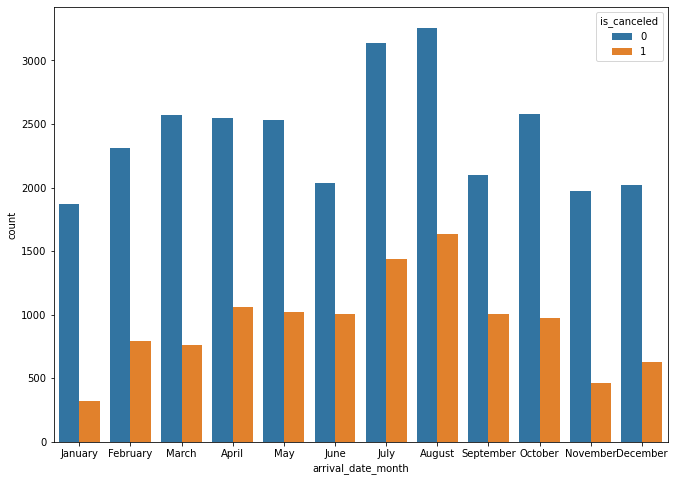

In [52]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
cancel_rh = sns.countplot(x="arrival_date_month", hue="is_canceled", data=resort_hotel, order=Months_order)

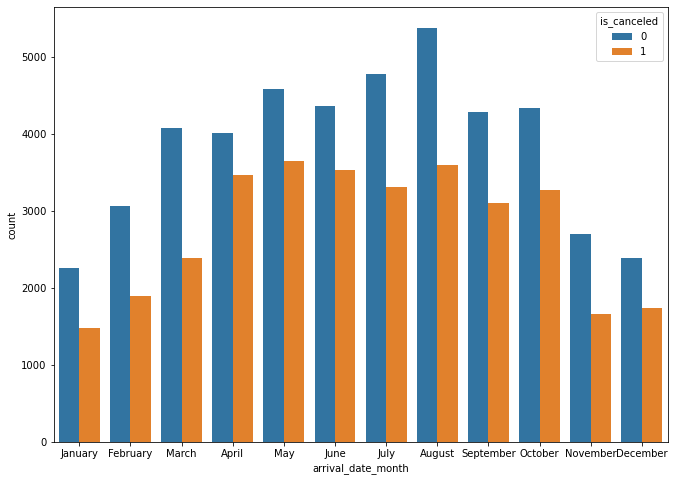

In [53]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
cancel_ch = sns.countplot(x="arrival_date_month", hue="is_canceled", data=city_hotel, order=Months_order)

### 2.3 Visualize Months vs meal

In [54]:
city_hotel['meal'].value_counts()

BB    62305
SC    10564
HB     6417
FB       44
Name: meal, dtype: int64

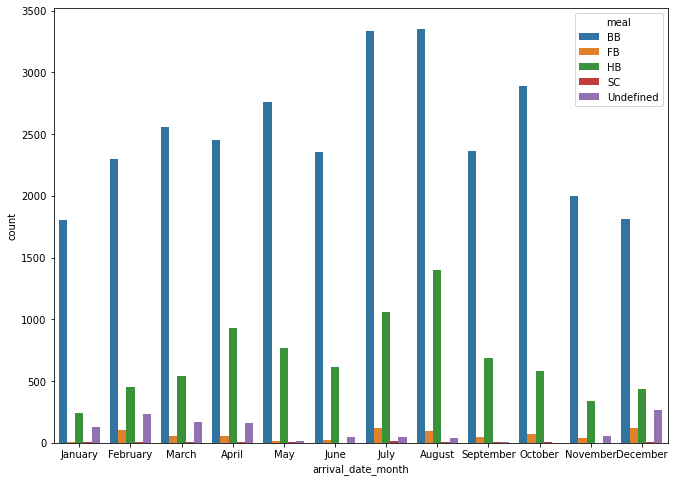

In [55]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
meal_rh = sns.countplot(x="arrival_date_month", hue="meal", data=resort_hotel, order=Months_order )

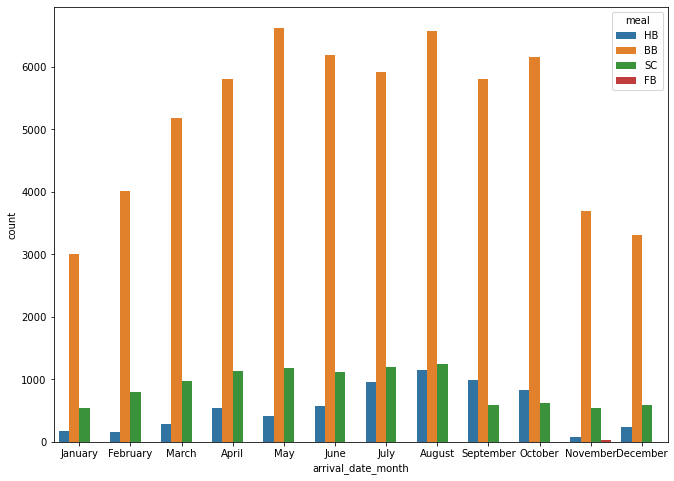

In [56]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
meal_ch = sns.countplot(x="arrival_date_month", hue="meal", data=city_hotel, order=Months_order)

### 2.4 Visualize Months vs market segment

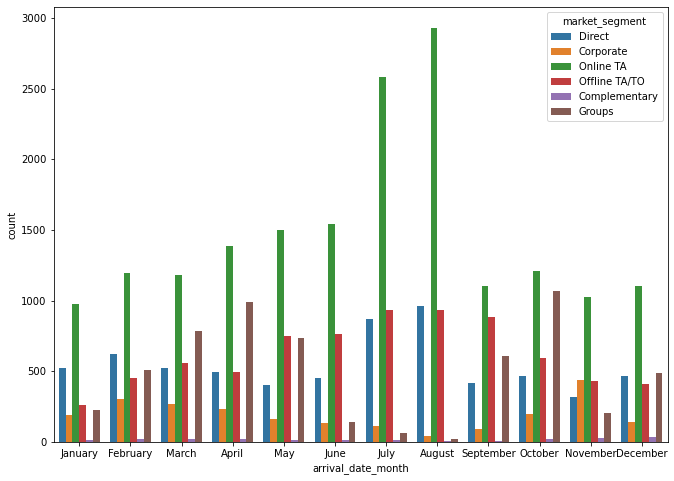

In [57]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
mark_seg_rh = sns.countplot(x="arrival_date_month", hue="market_segment", data=resort_hotel, order=Months_order )

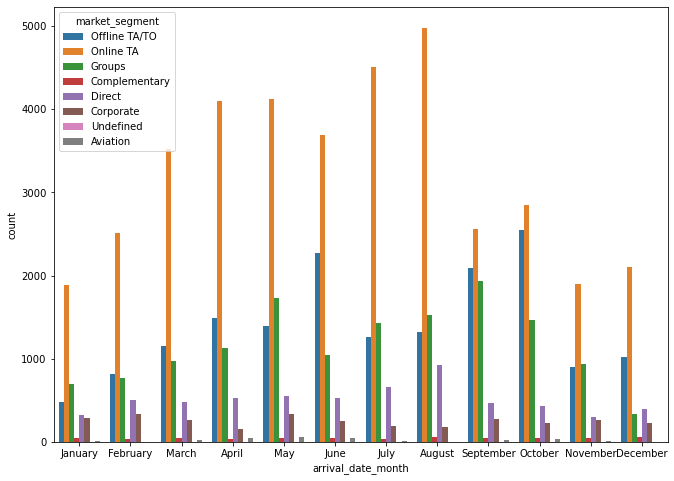

In [58]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
mark_seg_ch = sns.countplot(x="arrival_date_month", hue="market_segment", data=city_hotel, order=Months_order )

### 2.5 Visualize Months vs distribution channel

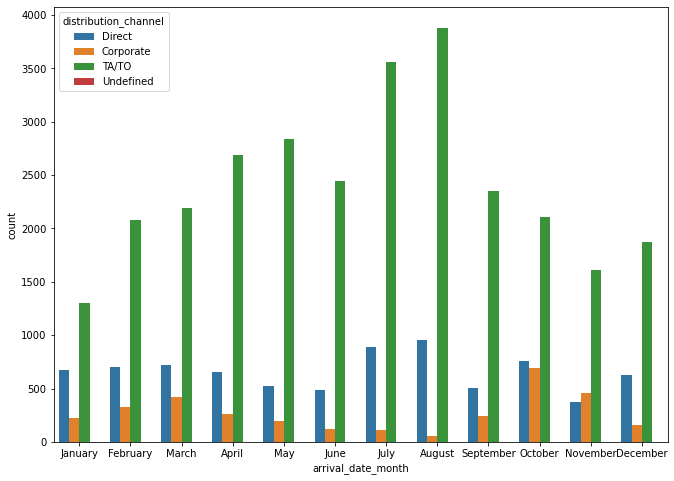

In [59]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
distr_channel_rh = sns.countplot(x="arrival_date_month", hue="distribution_channel", data=resort_hotel, order=Months_order )

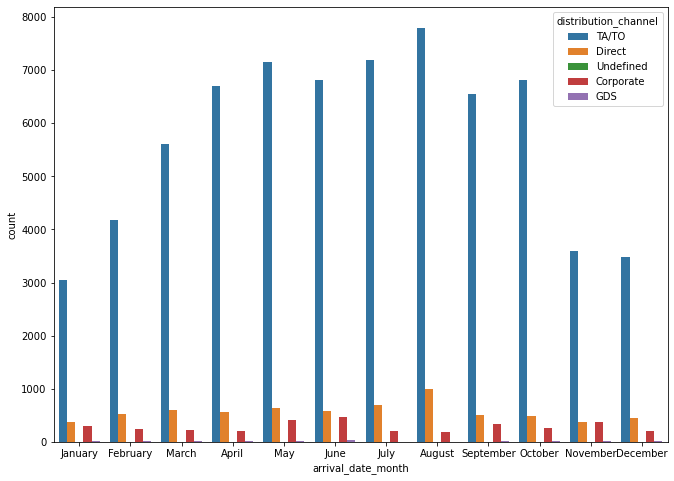

In [60]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
distr_channel_ch = sns.countplot(x="arrival_date_month", hue="distribution_channel", data=city_hotel, order=Months_order )

### 2.6 Visualize Months vs repeated guests

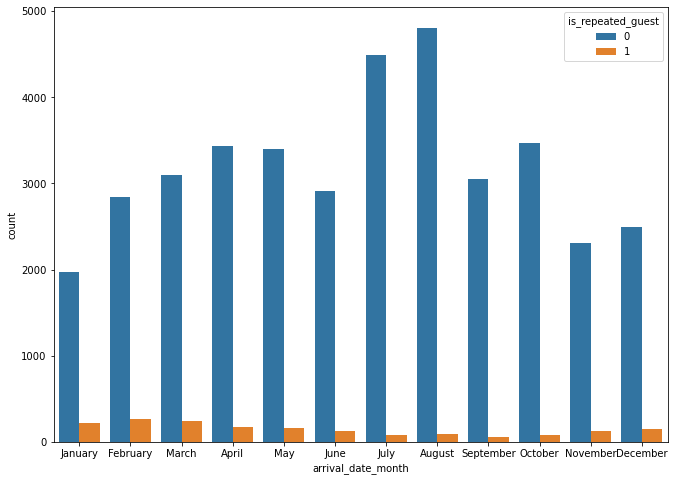

In [61]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
rep_guests_rh = sns.countplot(x="arrival_date_month", hue="is_repeated_guest", data=resort_hotel, order=Months_order)

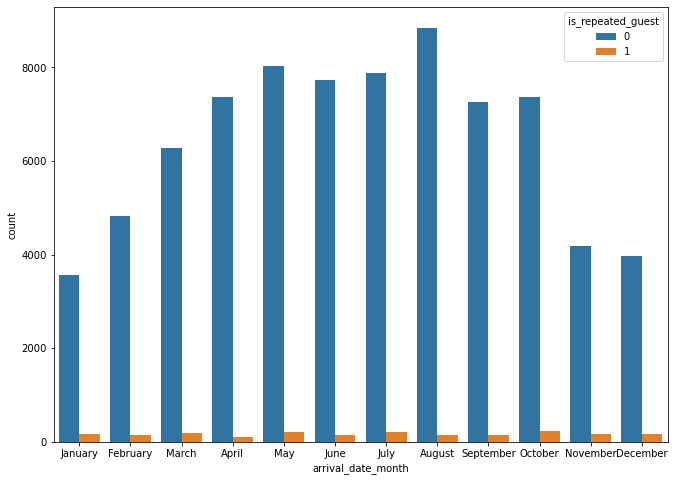

In [62]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
rep_guests_ch = sns.countplot(x="arrival_date_month", hue="is_repeated_guest", data=city_hotel, order=Months_order)

### 2.7 Visualize Months vs room type

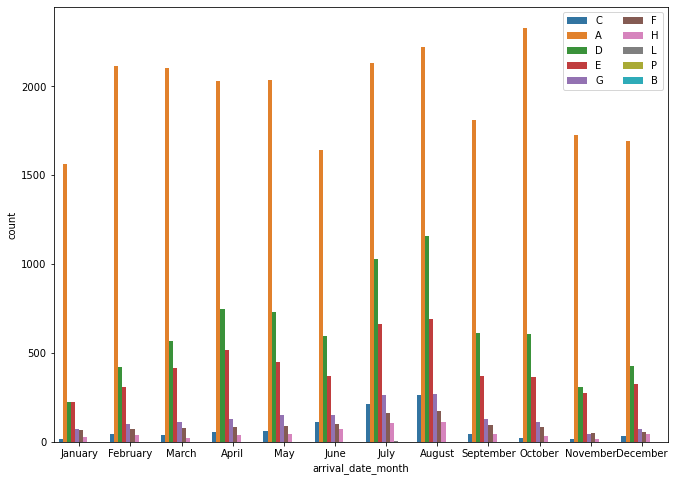

In [63]:
# Seaborn Countplot

Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
room_type_rh = sns.countplot(x="arrival_date_month", hue="reserved_room_type", data=resort_hotel, order=Months_order)
room_type_rh.legend(ncol=2, loc='upper right', )

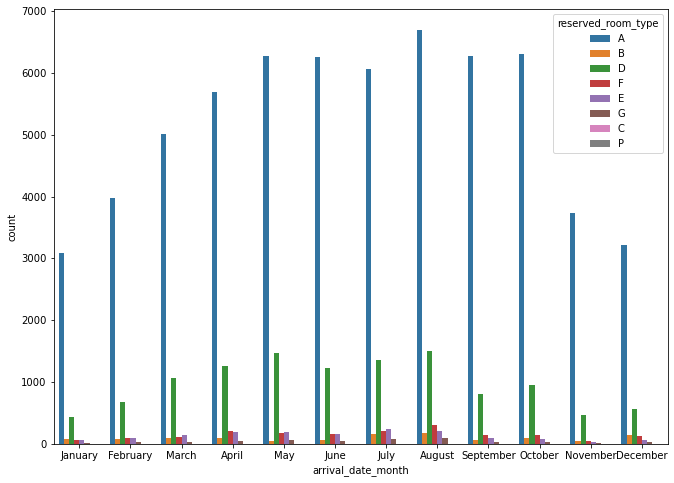

In [64]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
room_type_ch = sns.countplot(x="arrival_date_month", hue="reserved_room_type", data=city_hotel, order=Months_order)

### 2.8 Visualize Months vs type of deposit

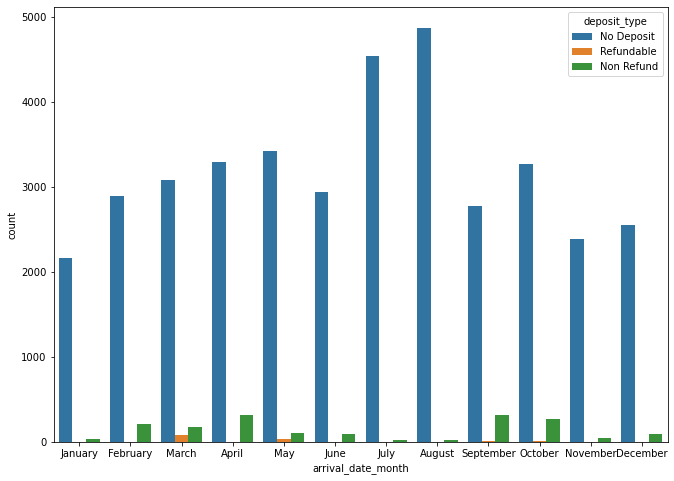

In [65]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
deposit_type_rh = sns.countplot(x="arrival_date_month", hue="deposit_type", data=resort_hotel, order=Months_order)

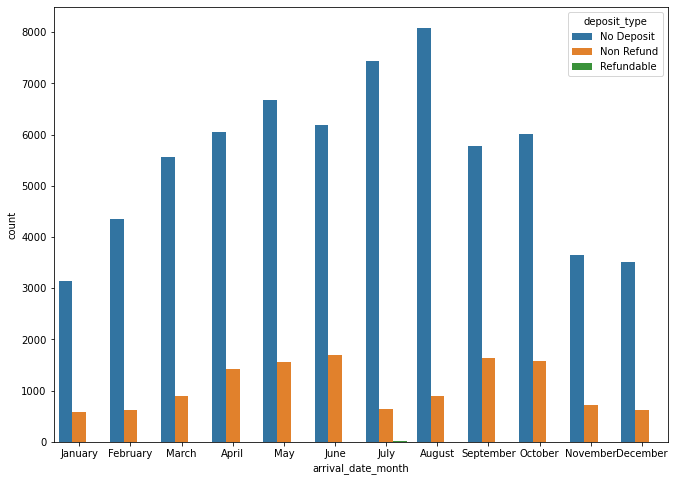

In [66]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
deposit_type_ch = sns.countplot(x="arrival_date_month", hue="deposit_type", data=city_hotel, order=Months_order)

### 2.9 Visualize Months vs type of customer

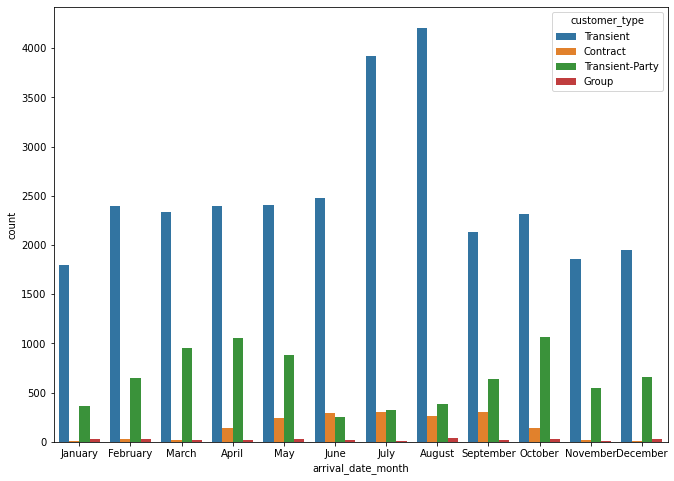

In [67]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
customer_type_rh = sns.countplot(x="arrival_date_month", hue="customer_type", data=resort_hotel, order=Months_order)

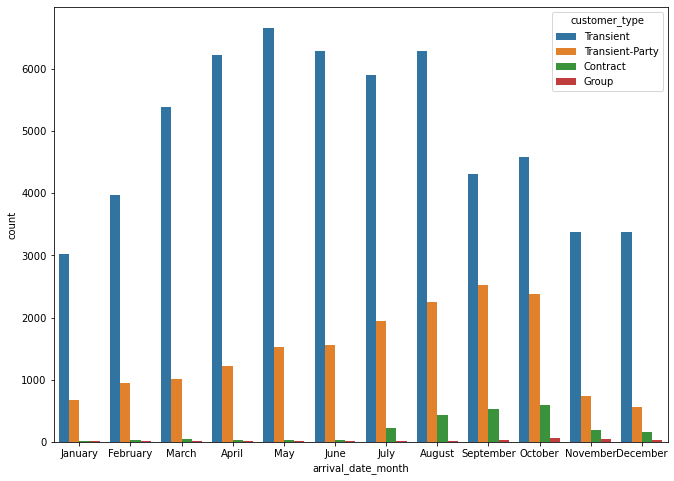

In [68]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
customer_type_ch = sns.countplot(x="arrival_date_month", hue="customer_type", data=city_hotel, order=Months_order)

### 2.10 Visualize Months vs reservations

In [69]:
city_hotel['reservation_status'].unique()

array(['Check-Out', 'Canceled', 'No-Show'], dtype=object)

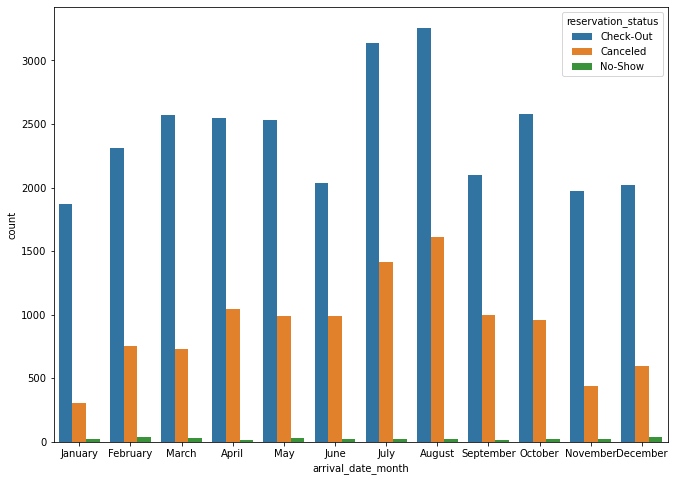

In [70]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
reservations_rh = sns.countplot(x="arrival_date_month", hue="reservation_status", data=resort_hotel, order=Months_order)

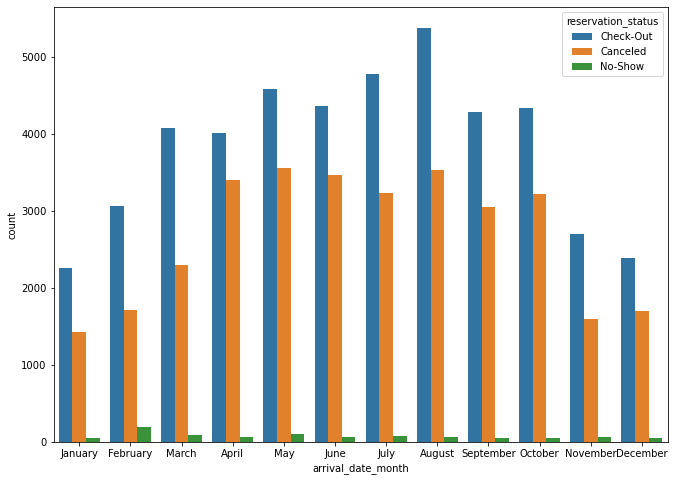

In [71]:
# Seaborn Countplot
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
fig = plt.figure(figsize=(11,8));
reservations_ch = sns.countplot(x="arrival_date_month", hue="reservation_status", data=city_hotel, order=Months_order)

In [72]:
city_hotel.shape

(79330, 14)

In [73]:
resort_hotel.shape

(40060, 14)

***


## Step 3: Mean, Median, Minimum, Maximum, Standard deviation
Lyndon B.

##### Code references:
- https://datacarpentry.org/python-ecology-lesson/05-merging-data/index.html
- https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475

### 3.1 Pull the clean numerical dataframes together
First, we need to pull together the cleaned datasets (discrete and continuous) we obtained from our step 1 of data preparation, so we can restart the analysis with all the features available in a single dataset.

In [74]:
numerical = num.copy()
numerical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 15 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   lead_time                       119390 non-null  int64  
 1   arrival_date_week_number        119390 non-null  int64  
 2   arrival_date_day_of_month       119390 non-null  int64  
 3   stays_in_weekend_nights         119390 non-null  int64  
 4   stays_in_week_nights            119390 non-null  int64  
 5   adults                          119390 non-null  int64  
 6   children                        119390 non-null  int64  
 7   babies                          119390 non-null  int64  
 8   previous_cancellations          119390 non-null  int64  
 9   previous_bookings_not_canceled  119390 non-null  int64  
 10  booking_changes                 119390 non-null  int64  
 11  days_in_waiting_list            119390 non-null  int64  
 12  adr             

### 3.2 Separate dataframe based on hotel type
The two hotels are different and therefore may exhibit different values and relationships from
which differing conclusions can be drawn later on in the analysis, therefore we need to reintegrate the hotel information back on the numerical dataframe, so we can then separate the dataframes meaningfully.

In [75]:
hotel_type = categorical[['hotel']]
hotel_type

,hotel
0,Resort Hotel
1,Resort Hotel
2,Resort Hotel
3,Resort Hotel
4,Resort Hotel
...,...
119385,City Hotel
119386,City Hotel
119387,City Hotel
119388,City Hotel


In [76]:
numerical_analysis = pd.concat([numerical, hotel_type], axis=1)
numerical_analysis

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,hotel
0,342,27,1,0,0,2,0,0,0,0,3,0,0.00,0,0,Resort Hotel
1,737,27,1,0,0,2,0,0,0,0,4,0,0.00,0,0,Resort Hotel
2,7,27,1,0,1,1,0,0,0,0,0,0,75.00,0,0,Resort Hotel
3,13,27,1,0,1,1,0,0,0,0,0,0,75.00,0,0,Resort Hotel
4,14,27,1,0,2,2,0,0,0,0,0,0,98.00,0,1,Resort Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,23,35,30,2,5,2,0,0,0,0,0,0,96.14,0,0,City Hotel
119386,102,35,31,2,5,3,0,0,0,0,0,0,225.43,0,2,City Hotel
119387,34,35,31,2,5,2,0,0,0,0,0,0,157.71,0,4,City Hotel
119388,109,35,31,2,5,2,0,0,0,0,0,0,104.40,0,0,City Hotel


In [77]:
numerical1 = numerical_analysis[numerical_analysis['hotel'] == 'Resort Hotel']    

numerical2 = numerical_analysis[numerical_analysis['hotel'] == 'City Hotel']

In [78]:
numerical1

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,hotel
0,342,27,1,0,0,2,0,0,0,0,3,0,0.00,0,0,Resort Hotel
1,737,27,1,0,0,2,0,0,0,0,4,0,0.00,0,0,Resort Hotel
2,7,27,1,0,1,1,0,0,0,0,0,0,75.00,0,0,Resort Hotel
3,13,27,1,0,1,1,0,0,0,0,0,0,75.00,0,0,Resort Hotel
4,14,27,1,0,2,2,0,0,0,0,0,0,98.00,0,1,Resort Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,212,35,31,2,8,2,1,0,0,0,1,0,89.75,0,0,Resort Hotel
40056,169,35,30,2,9,2,0,0,0,0,0,0,202.27,0,1,Resort Hotel
40057,204,35,29,4,10,2,0,0,0,0,0,0,153.57,0,3,Resort Hotel
40058,211,35,31,4,10,2,0,0,0,0,0,0,112.80,0,1,Resort Hotel


In [79]:
numerical2

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,hotel
40060,6,27,1,0,2,1,0,0,0,0,0,0,0.00,0,0,City Hotel
40061,88,27,1,0,4,2,0,0,0,0,0,0,76.50,0,1,City Hotel
40062,65,27,1,0,4,1,0,0,0,0,0,0,68.00,0,1,City Hotel
40063,92,27,1,2,4,2,0,0,0,0,0,0,76.50,0,2,City Hotel
40064,100,27,2,0,2,2,0,0,0,0,0,0,76.50,0,1,City Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,23,35,30,2,5,2,0,0,0,0,0,0,96.14,0,0,City Hotel
119386,102,35,31,2,5,3,0,0,0,0,0,0,225.43,0,2,City Hotel
119387,34,35,31,2,5,2,0,0,0,0,0,0,157.71,0,4,City Hotel
119388,109,35,31,2,5,2,0,0,0,0,0,0,104.40,0,0,City Hotel


### 3.3 Summary statistics of the new dataframes

In [80]:
numerical1.describe()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.000000,40060.00000
mean,92.675686,27.140864,15.821243,1.189815,3.128732,1.867149,0.128682,0.013904,0.101722,0.146455,0.287968,0.527758,94.952930,0.138068,0.61977
std,97.285315,14.005441,8.883708,1.147812,2.461329,0.697285,0.445195,0.118998,1.335115,1.001955,0.726548,7.428580,61.442418,0.351001,0.81393
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.380000,0.000000,0.00000
25%,10.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.00000
50%,57.000000,28.000000,16.000000,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,75.000000,0.000000,0.00000
75%,155.000000,38.000000,24.000000,2.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,125.000000,0.000000,1.00000
max,737.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,2.000000,26.000000,30.000000,17.000000,185.000000,508.000000,8.000000,5.00000


In [81]:
numerical2.describe()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000,79330.000000
mean,109.735724,27.177449,15.786625,0.795185,2.182957,1.850977,0.091365,0.004941,0.079743,0.132371,0.187369,3.226774,105.304465,0.024367,0.546918
std,110.948526,13.398523,8.728451,0.885026,1.456416,0.509292,0.372168,0.084323,0.415472,1.693411,0.608620,20.870890,43.602954,0.154919,0.780776
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,17.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,79.200000,0.000000,0.000000
50%,74.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,99.900000,0.000000,0.000000
75%,163.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000
max,629.000000,53.000000,31.000000,16.000000,41.000000,4.000000,3.000000,10.000000,21.000000,72.000000,21.000000,391.000000,5400.000000,3.000000,5.000000


***


## Step 4: Min-Max Normalization, Z-score
Lyndon B.

### Refrences

##### Resources:
- <https://www.codecademy.com/articles/normalization>
- <https://www.researchgate.net/post/When_and_why_do_we_need_data_normalization>


##### Code resources:

- https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475
- https://stackoverflow.com/questions/43131274/how-do-i-plot-two-countplot-graphs-side-by-side-in-seaborn
- https://stackoverflow.com/questions/62348532/adding-a-title-to-two-side-by-side-plots
- https://stackoverflow.com/questions/16419670/increase-distance-between-title-and-plot-in-matplolib/56738085

### 4.1 Min-Max Normalization
MinMax normalisation is a data preprocessing procedure that prepares data for later use by machine learning tools. If there are large differences in the scale of some features they may
inappropriately influence or dominate the results of the later machine learning stages. Sometimes normalisation can make relationships more visible in visualisations though this 
depends on the data itself

#### Apply min-max normalization to Resort hotel dataframe

In [82]:
numerical1 = numerical1.drop(['hotel'], axis=1)
numerical1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40060 entries, 0 to 40059
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   lead_time                       40060 non-null  int64  
 1   arrival_date_week_number        40060 non-null  int64  
 2   arrival_date_day_of_month       40060 non-null  int64  
 3   stays_in_weekend_nights         40060 non-null  int64  
 4   stays_in_week_nights            40060 non-null  int64  
 5   adults                          40060 non-null  int64  
 6   children                        40060 non-null  int64  
 7   babies                          40060 non-null  int64  
 8   previous_cancellations          40060 non-null  int64  
 9   previous_bookings_not_canceled  40060 non-null  int64  
 10  booking_changes                 40060 non-null  int64  
 11  days_in_waiting_list            40060 non-null  int64  
 12  adr                             

In [83]:
#https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475

# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
df_num1 = pd.DataFrame(scaler.fit_transform(numerical1), columns=numerical1.columns)

df_num1

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0.464043,0.500000,0.000000,0.000000,0.00,0.036364,0.0,0.0,0.0,0.0,0.176471,0.0,0.012403,0.0,0.0
1,1.000000,0.500000,0.000000,0.000000,0.00,0.036364,0.0,0.0,0.0,0.0,0.235294,0.0,0.012403,0.0,0.0
2,0.009498,0.500000,0.000000,0.000000,0.02,0.018182,0.0,0.0,0.0,0.0,0.000000,0.0,0.158210,0.0,0.0
3,0.017639,0.500000,0.000000,0.000000,0.02,0.018182,0.0,0.0,0.0,0.0,0.000000,0.0,0.158210,0.0,0.0
4,0.018996,0.500000,0.000000,0.000000,0.04,0.036364,0.0,0.0,0.0,0.0,0.000000,0.0,0.202924,0.0,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,0.287653,0.653846,1.000000,0.105263,0.16,0.036364,0.1,0.0,0.0,0.0,0.058824,0.0,0.186885,0.0,0.0
40056,0.229308,0.653846,0.966667,0.105263,0.18,0.036364,0.0,0.0,0.0,0.0,0.000000,0.0,0.405634,0.0,0.2
40057,0.276798,0.653846,0.933333,0.210526,0.20,0.036364,0.0,0.0,0.0,0.0,0.000000,0.0,0.310957,0.0,0.6
40058,0.286296,0.653846,1.000000,0.210526,0.20,0.036364,0.0,0.0,0.0,0.0,0.000000,0.0,0.231696,0.0,0.2


#### Apply min-max normalization to City hotel dataframe

In [84]:
numerical2 = numerical2.drop(['hotel'], axis=1)
numerical2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79330 entries, 40060 to 119389
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   lead_time                       79330 non-null  int64  
 1   arrival_date_week_number        79330 non-null  int64  
 2   arrival_date_day_of_month       79330 non-null  int64  
 3   stays_in_weekend_nights         79330 non-null  int64  
 4   stays_in_week_nights            79330 non-null  int64  
 5   adults                          79330 non-null  int64  
 6   children                        79330 non-null  int64  
 7   babies                          79330 non-null  int64  
 8   previous_cancellations          79330 non-null  int64  
 9   previous_bookings_not_canceled  79330 non-null  int64  
 10  booking_changes                 79330 non-null  int64  
 11  days_in_waiting_list            79330 non-null  int64  
 12  adr                        

In [85]:
# References: https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475

# Create a scaler object
scaler = MinMaxScaler()

# Fit and transform the data
df_num2 = pd.DataFrame(scaler.fit_transform(numerical2), columns=numerical2.columns)

df_num2

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0.009539,0.500000,0.000000,0.000,0.048780,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.139905,0.500000,0.000000,0.000,0.097561,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.014167,0.0,0.2
2,0.103339,0.500000,0.000000,0.000,0.097561,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.012593,0.0,0.2
3,0.146264,0.500000,0.000000,0.125,0.097561,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.014167,0.0,0.4
4,0.158983,0.500000,0.033333,0.000,0.048780,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.014167,0.0,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0.036566,0.653846,0.966667,0.125,0.121951,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.017804,0.0,0.0
79326,0.162162,0.653846,1.000000,0.125,0.121951,0.75,0.0,0.0,0.0,0.0,0.0,0.0,0.041746,0.0,0.4
79327,0.054054,0.653846,1.000000,0.125,0.121951,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.029206,0.0,0.8
79328,0.173291,0.653846,1.000000,0.125,0.121951,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.019333,0.0,0.0


##### Example of the effect of Min-max normalisation on a feature

Notice in the side by side comparison below, how the feature' scale changes, demonstrated by the shrinking of the scale evident in the values comparison between the X axis.

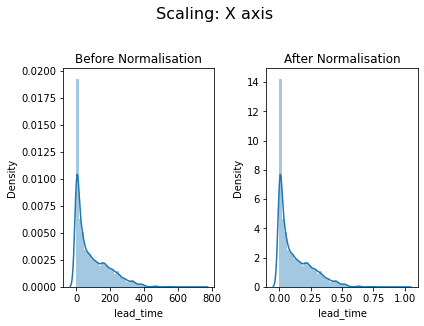

In [86]:
##https://stackoverflow.com/questions/43131274/how-do-i-plot-two-countplot-graphs-side-by-side-in-seaborn
##https://stackoverflow.com/questions/62348532/adding-a-title-to-two-side-by-side-plots
##https://stackoverflow.com/questions/16419670/increase-distance-between-title-and-plot-in-matplolib/56738085

fig, ax =plt.subplots(1,2)
sns.distplot(numerical1['lead_time'], ax=ax[0])
sns.distplot(df_num1['lead_time'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle(' Scaling: X axis',fontsize=15,size=16, y=1.12)
fig.tight_layout()

### 4.2 Before and after normalisation

Let's look at some plots of interest before and after normalisation

##### Resort hotels

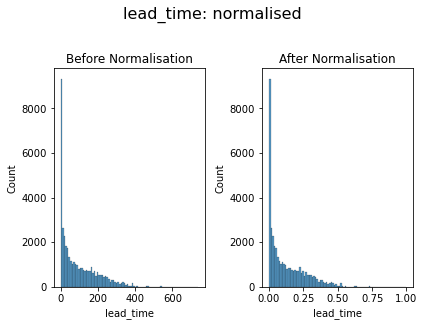

In [87]:
# Seaborn histplot
##sns.histplot(data=numerical1, x="lead_time")
fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['lead_time'], ax=ax[0])
sns.histplot(df_num1['lead_time'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('lead_time: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

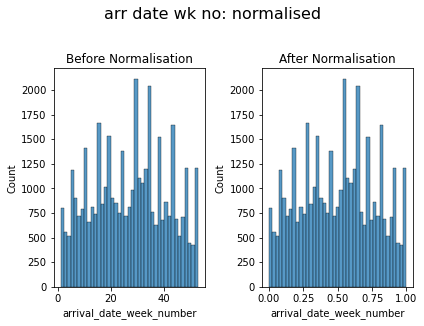

In [88]:
# Seaborn histplot

##sns.histplot(data=numerical1, x="lead_time")
fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['arrival_date_week_number'], ax=ax[0])
sns.histplot(df_num1['arrival_date_week_number'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('arr date wk no: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

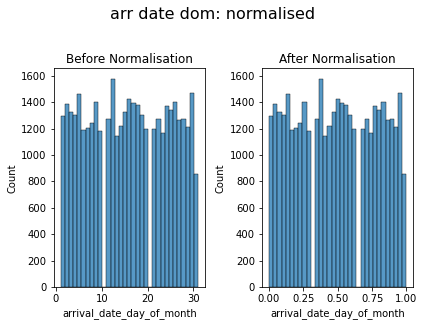

In [89]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['arrival_date_day_of_month'], ax=ax[0])
sns.histplot(df_num1['arrival_date_day_of_month'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('arr date dom: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

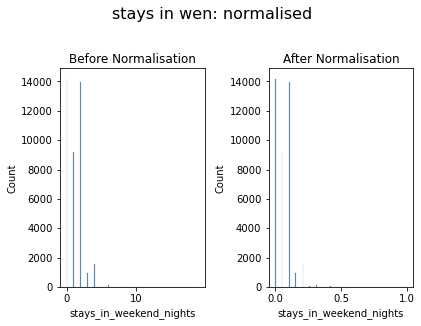

In [90]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['stays_in_weekend_nights'], ax=ax[0])
sns.histplot(df_num1['stays_in_weekend_nights'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('stays in wen: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

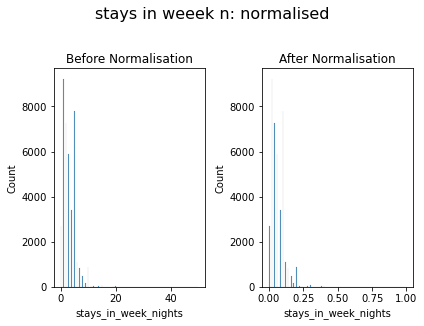

In [91]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['stays_in_week_nights'], ax=ax[0])
sns.histplot(df_num1['stays_in_week_nights'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('stays in weeek n: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

(0.0, 1.0)

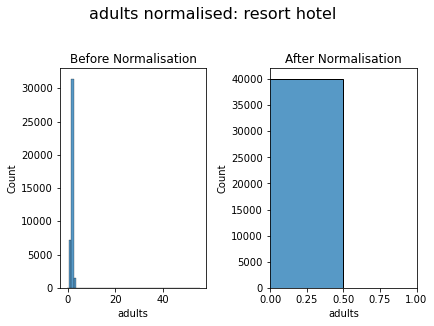

In [92]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical1['adults'],discrete=True, ax=ax[0])
sns.histplot(df_num1['adults'],discrete=True, ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('adults normalised: resort hotel',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

(0.0, 1.0)

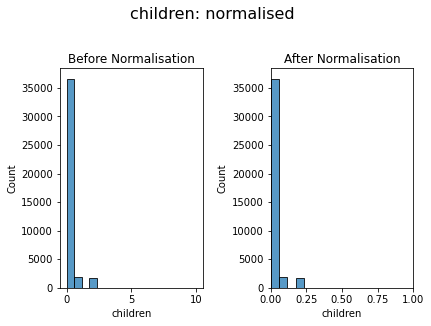

In [93]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['children'], ax=ax[0])

sns.histplot(df_num1['children'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('children: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

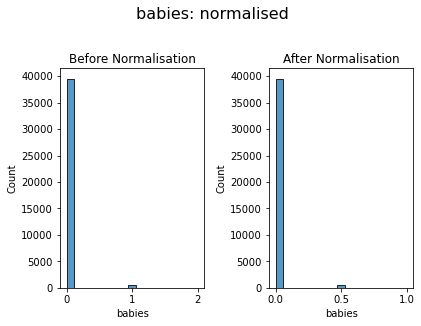

In [94]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['babies'], ax=ax[0])

sns.histplot(df_num1['babies'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('babies: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

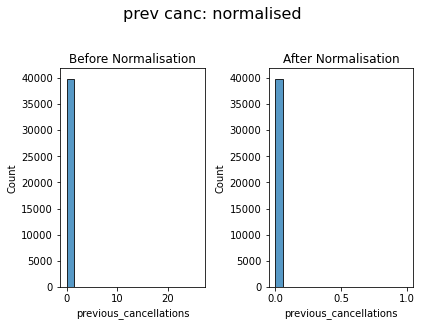

In [95]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['previous_cancellations'], ax=ax[0])

sns.histplot(df_num1['previous_cancellations'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('prev canc: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

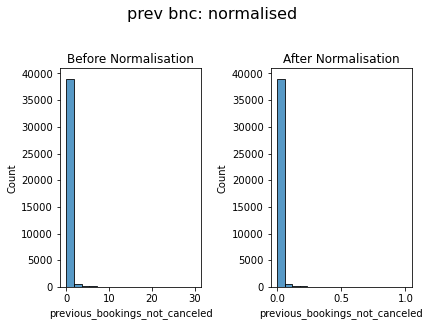

In [96]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['previous_bookings_not_canceled'], ax=ax[0])

sns.histplot(df_num1['previous_bookings_not_canceled'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('prev bnc: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

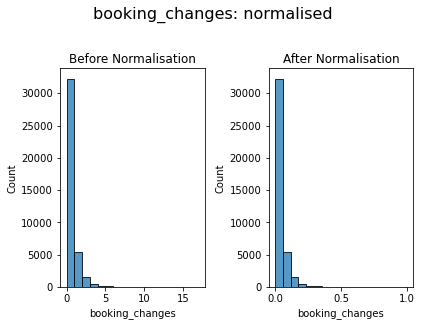

In [97]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['booking_changes'], ax=ax[0])

sns.histplot(df_num1['booking_changes'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('booking_changes: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

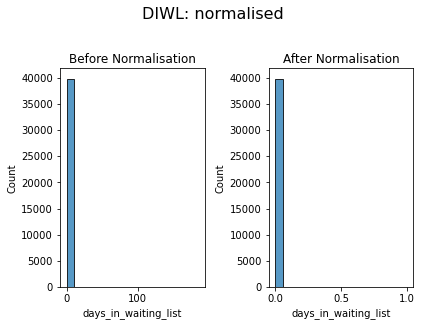

In [98]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['days_in_waiting_list'], ax=ax[0])

sns.histplot(df_num1['days_in_waiting_list'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('DIWL: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

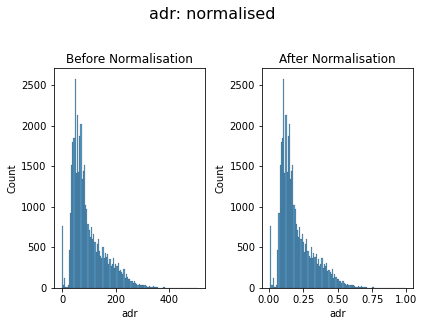

In [99]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['adr'], ax=ax[0])

sns.histplot(df_num1['adr'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('adr: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

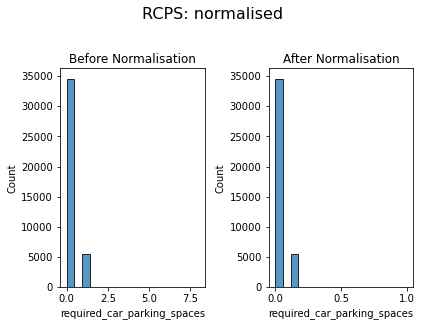

In [100]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['required_car_parking_spaces'], ax=ax[0])

sns.histplot(df_num1['required_car_parking_spaces'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('RCPS: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

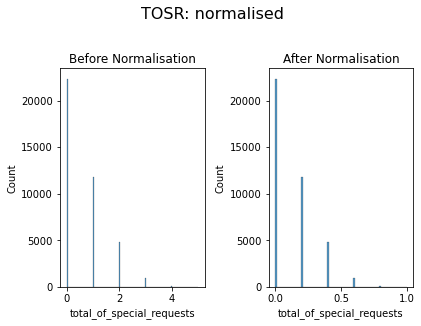

In [101]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['total_of_special_requests'], ax=ax[0])

sns.histplot(df_num1['total_of_special_requests'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('TOSR: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

##### City hotels

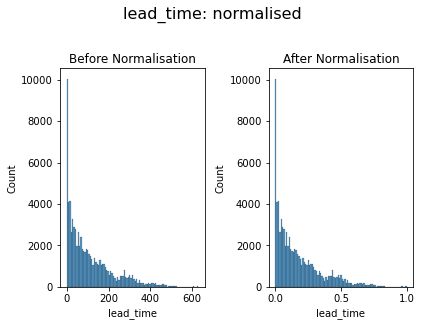

In [102]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['lead_time'], ax=ax[0])
sns.histplot(df_num2['lead_time'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('lead_time: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

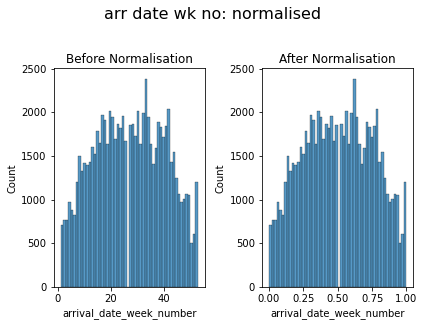

In [103]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['arrival_date_week_number'], ax=ax[0])
sns.histplot(df_num2['arrival_date_week_number'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('arr date wk no: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

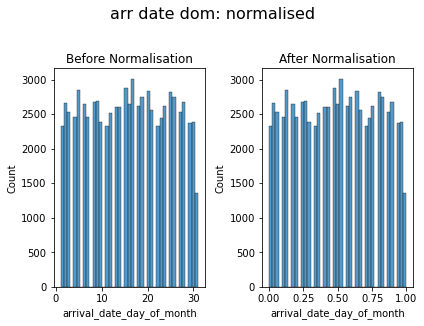

In [104]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['arrival_date_day_of_month'], ax=ax[0])
sns.histplot(df_num2['arrival_date_day_of_month'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('arr date dom: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

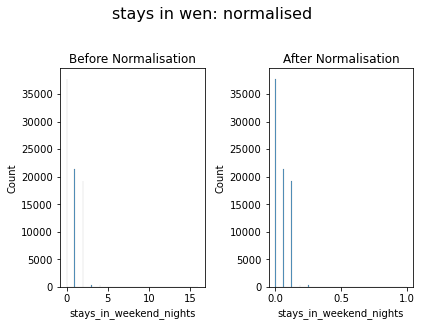

In [105]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['stays_in_weekend_nights'], ax=ax[0])
sns.histplot(df_num2['stays_in_weekend_nights'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('stays in wen: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

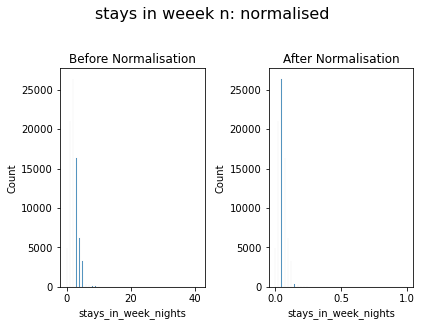

In [106]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['stays_in_week_nights'], ax=ax[0])
sns.histplot(df_num2['stays_in_week_nights'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('stays in weeek n: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

(0.0, 1.0)

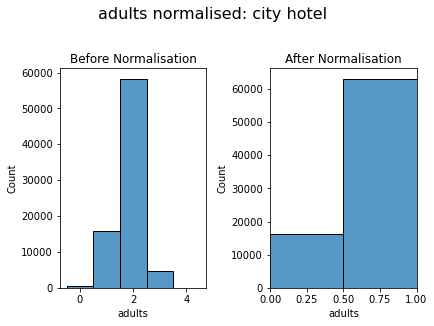

In [107]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical2['adults'],discrete=True, ax=ax[0])
sns.histplot(df_num2['adults'],discrete=True, ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('adults normalised: city hotel',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

(0.0, 1.0)

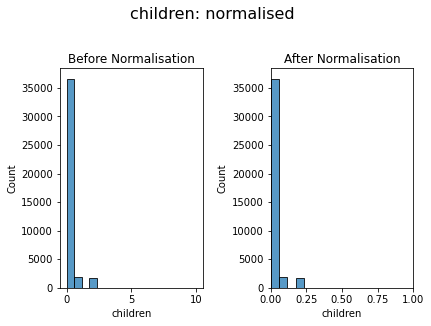

In [108]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical1['children'], ax=ax[0])
sns.histplot(df_num1['children'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('children: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

(0.0, 1.0)

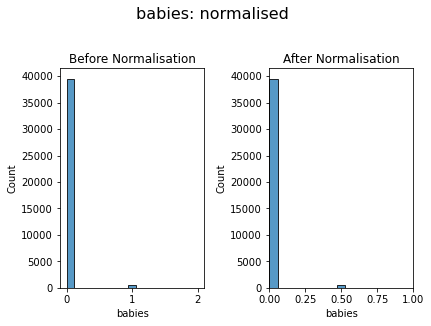

In [109]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical1['babies'], ax=ax[0])
sns.histplot(df_num1['babies'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('babies: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

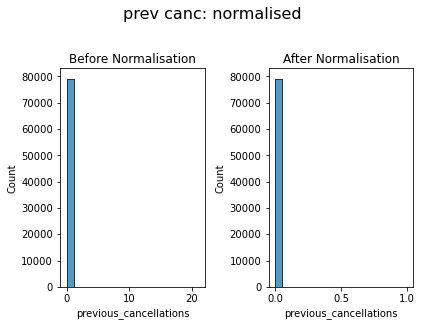

In [110]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['previous_cancellations'], ax=ax[0])

sns.histplot(df_num2['previous_cancellations'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('prev canc: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

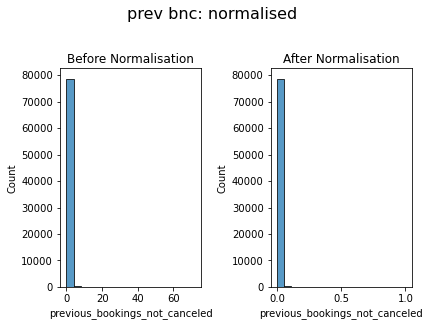

In [111]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['previous_bookings_not_canceled'], ax=ax[0])

sns.histplot(df_num2['previous_bookings_not_canceled'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('prev bnc: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

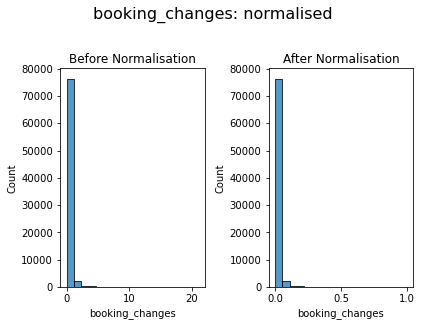

In [112]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['booking_changes'], ax=ax[0])

sns.histplot(df_num2['booking_changes'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('booking_changes: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

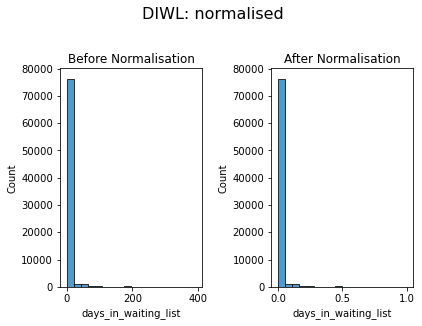

In [113]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['days_in_waiting_list'], ax=ax[0])

sns.histplot(df_num2['days_in_waiting_list'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('DIWL: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

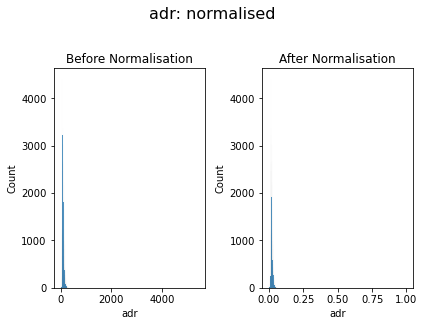

In [114]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['adr'], ax=ax[0])

sns.histplot(df_num2['adr'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('adr: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

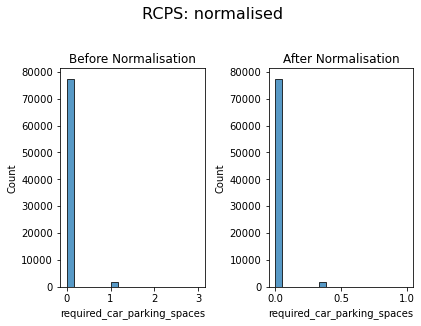

In [115]:
# Seaborn histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['required_car_parking_spaces'], ax=ax[0])

sns.histplot(df_num2['required_car_parking_spaces'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('RCPS: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

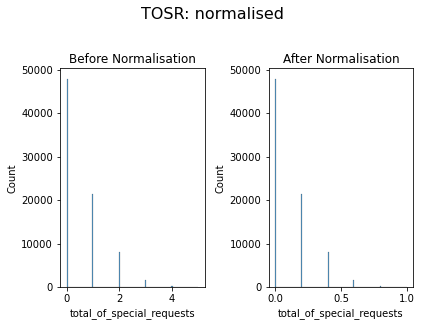

In [116]:
fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['total_of_special_requests'], ax=ax[0])

sns.histplot(df_num2['total_of_special_requests'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('TOSR: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

**Adr vs Children before**

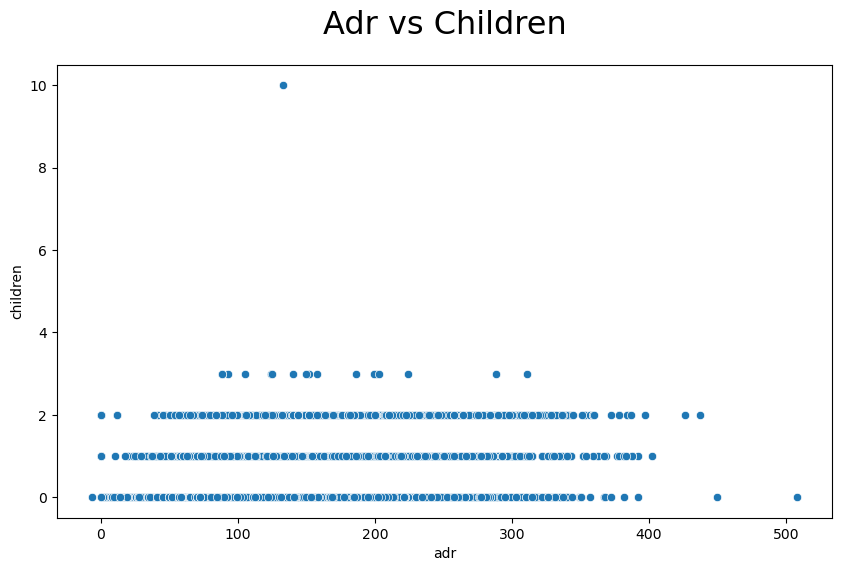

In [117]:
# Seaborn scatterplot

ax = numerical1


x = ax['adr']
y = ax['children']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('Adr vs Children', fontsize = 23, y =1.05);

**Adr vs Children before**

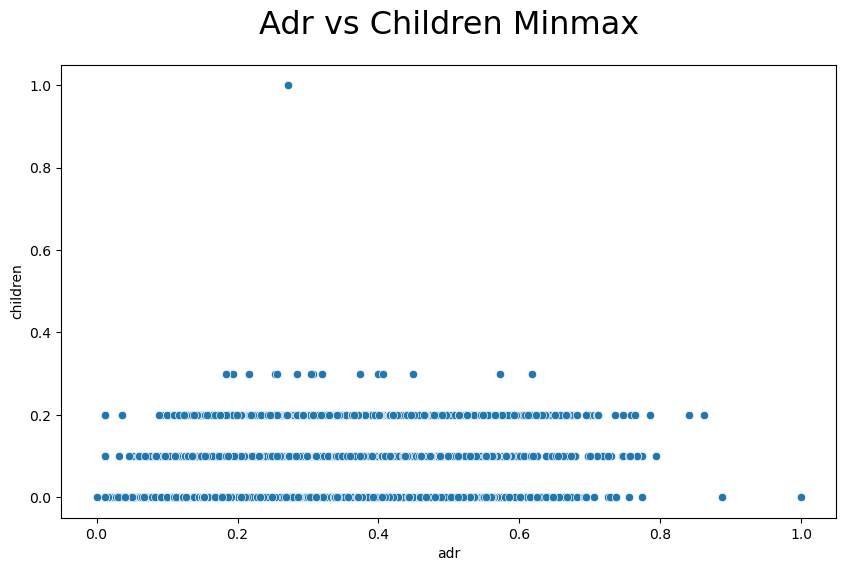

In [118]:
# Seaborn scatterplot

ax = df_num1

# define the axes content
x = ax['adr']
y = ax['children']

#sns.scatterplot from DataFrame
fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('Adr vs Children Minmax', fontsize = 23, y =1.05);

### 4.3 Further exploration

Min-max Normalisation can sometimes expand our view into clustered or overplotted data but
in this case, the same overplotted horizontal lines show meaning despite the heatmap data we 
cannot easily identify linear correlational patterns between these features after normalisation.

Please pay attention however to the X and Y Axis, the scale has been recallibrated to lie between 0 and 1 for the relevant features.

Essentially the same result is achieved regarding visibility in the visualisation via utilising Z-score standardisation making this non-usable approach for these features in this case.

Let's try the same approach with some other variables which appear to exhibit some correlation
and test if minmax or Z-score standardisation make a difference in visualising the data

**Before normalization**

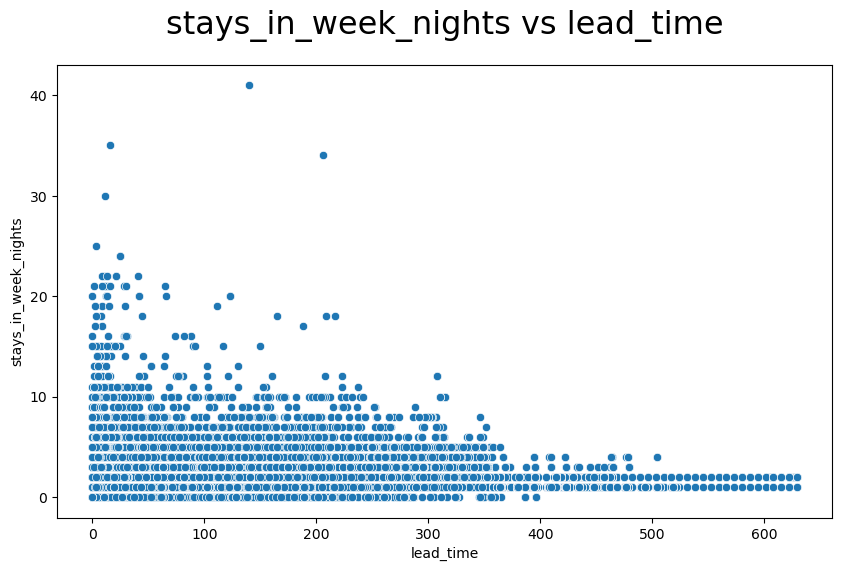

In [119]:
# Seaborn scatterplot

ax = numerical2


x = ax['lead_time']
y = ax['stays_in_week_nights']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('stays_in_week_nights vs lead_time', fontsize = 23, y =1.05);


**After normalization**

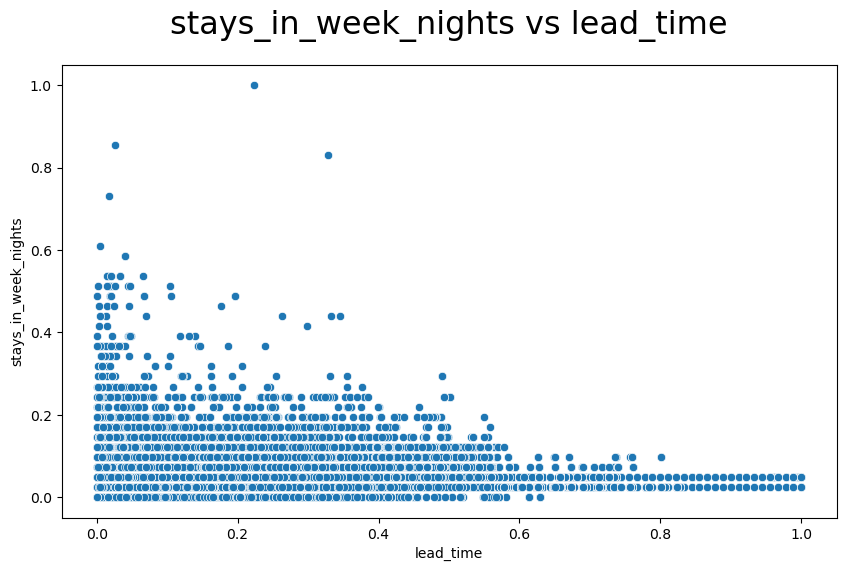

In [120]:
# Seaborn scatterplot

ax = df_num2


x = ax['lead_time']
y = ax['stays_in_week_nights']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('stays_in_week_nights vs lead_time', fontsize = 23, y =1.05);

Again unfortunately, despite the heatmap suggesting some correlation between these two features,
the normalisation has not helped us to unpack this visually.Normalisation, however, has uses to 
be discussed later

In [121]:
#https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475


# apply the z-score method in Pandas using the .mean() and .std() methods
def z_score(df):
    # copy the dataframe
    df_std = df.copy()
    # apply the z-score method
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()) / df_std[column].std()
        
    return df_std
    
# call the z_score function
numerical_standardized1 = z_score(numerical1)

numerical_standardized1

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,2.562815,-0.010058,-1.668362,-1.036594,-1.271155,0.190526,-0.289046,-0.116844,-0.07619,-0.14617,3.732766,-0.071044,-1.545397,-0.393354,-0.761454
1,6.623038,-0.010058,-1.668362,-1.036594,-1.271155,0.190526,-0.289046,-0.116844,-0.07619,-0.14617,5.109138,-0.071044,-1.545397,-0.393354,-0.761454
2,-0.880664,-0.010058,-1.668362,-1.036594,-0.864871,-1.243607,-0.289046,-0.116844,-0.07619,-0.14617,-0.396351,-0.071044,-0.324742,-0.393354,-0.761454
3,-0.818990,-0.010058,-1.668362,-1.036594,-0.864871,-1.243607,-0.289046,-0.116844,-0.07619,-0.14617,-0.396351,-0.071044,-0.324742,-0.393354,-0.761454
4,-0.808711,-0.010058,-1.668362,-1.036594,-0.458586,0.190526,-0.289046,-0.116844,-0.07619,-0.14617,-0.396351,-0.071044,0.049592,-0.393354,0.467153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,1.226540,0.561149,1.708606,0.705851,1.979121,0.190526,1.957160,-0.116844,-0.07619,-0.14617,0.980021,-0.071044,-0.084680,-0.393354,-0.761454
40056,0.784541,0.561149,1.596040,0.705851,2.385405,0.190526,-0.289046,-0.116844,-0.07619,-0.14617,-0.396351,-0.071044,1.746628,-0.393354,0.467153
40057,1.144307,0.561149,1.483475,2.448297,2.791690,0.190526,-0.289046,-0.116844,-0.07619,-0.14617,-0.396351,-0.071044,0.954016,-0.393354,2.924368
40058,1.216261,0.561149,1.708606,2.448297,2.791690,0.190526,-0.289046,-0.116844,-0.07619,-0.14617,-0.396351,-0.071044,0.290468,-0.393354,0.467153


In [122]:
numerical_standardized1.mean()

lead_time                        -4.349696e-15
arrival_date_week_number         -8.846598e-15
arrival_date_day_of_month        -7.802490e-16
stays_in_weekend_nights          -1.254883e-14
stays_in_week_nights             -7.689195e-16
adults                           -8.300983e-15
children                          8.531923e-15
babies                            6.313342e-15
previous_cancellations            2.052625e-14
previous_bookings_not_canceled    9.740547e-15
booking_changes                  -2.458339e-14
days_in_waiting_list             -1.660257e-14
adr                              -1.183771e-14
required_car_parking_spaces      -5.404029e-14
total_of_special_requests         3.674159e-14
dtype: float64

In [123]:
#https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475


# apply the z-score method in Pandas using the .mean() and .std() methods
def z_score(df):
    # copy the dataframe
    df_std = df.copy()
    # apply the z-score method
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()) / df_std[column].std()
        
    return df_std
    
# call the z_score function
numerical_standardized2 = z_score(numerical2)

numerical_standardized2

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
40060,-0.934990,-0.013244,-1.694072,-0.898487,-0.125622,-1.670901,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-2.415076,-0.157285,-0.700480
40061,-0.195908,-0.013244,-1.694072,-0.898487,1.247612,0.292608,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-0.660608,-0.157285,0.580297
40062,-0.403212,-0.013244,-1.694072,-0.898487,1.247612,-1.670901,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-0.855549,-0.157285,0.580297
40063,-0.159855,-0.013244,-1.694072,1.361333,1.247612,0.292608,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-0.660608,-0.157285,1.861074
40064,-0.087750,-0.013244,-1.579504,-0.898487,-0.125622,0.292608,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-0.660608,-0.157285,0.580297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,-0.781765,0.583837,1.628396,1.361333,1.934229,0.292608,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-0.210180,-0.157285,-0.700480
119386,-0.069724,0.583837,1.742964,1.361333,1.934229,2.256117,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,2.754986,-0.157285,1.861074
119387,-0.682620,0.583837,1.742964,1.361333,1.934229,0.292608,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,1.201880,-0.157285,4.422627
119388,-0.006631,0.583837,1.742964,1.361333,1.934229,0.292608,-0.245494,-0.0586,-0.191933,-0.078168,-0.307859,-0.154606,-0.020743,-0.157285,-0.700480


In [124]:
numerical_standardized1.describe()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04,4.006000e+04
mean,-4.349696e-15,-8.846598e-15,-7.802490e-16,-1.254883e-14,-7.689195e-16,-8.300983e-15,8.531923e-15,6.313342e-15,2.052625e-14,9.740547e-15,-2.458339e-14,-1.660257e-14,-1.183771e-14,-5.404029e-14,3.674159e-14
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-9.526174e-01,-1.866479e+00,-1.668362e+00,-1.036594e+00,-1.271155e+00,-2.677740e+00,-2.890462e-01,-1.168436e-01,-7.618999e-02,-1.461696e-01,-3.963513e-01,-7.104431e-02,-1.649234e+00,-3.933543e-01,-7.614545e-01
25%,-8.498270e-01,-7.954668e-01,-8.804030e-01,-1.036594e+00,-8.648708e-01,1.905256e-01,-2.890462e-01,-1.168436e-01,-7.618999e-02,-1.461696e-01,-3.963513e-01,-7.104431e-02,-7.316270e-01,-3.933543e-01,-7.614545e-01
50%,-3.667119e-01,6.134304e-02,2.012188e-02,-1.653714e-01,-5.230178e-02,1.905256e-01,-2.890462e-01,-1.168436e-01,-7.618999e-02,-1.461696e-01,-3.963513e-01,-7.104431e-02,-3.247419e-01,-3.933543e-01,-7.614545e-01
75%,6.406343e-01,7.753513e-01,9.206468e-01,7.058513e-01,7.602672e-01,1.905256e-01,-2.890462e-01,-1.168436e-01,-7.618999e-02,-1.461696e-01,-3.963513e-01,-7.104431e-02,4.890281e-01,-3.933543e-01,4.671530e-01
max,6.623038e+00,1.846364e+00,1.708606e+00,1.551664e+01,1.904307e+01,7.619956e+01,2.217301e+01,1.669018e+01,1.939778e+01,2.979531e+01,2.300198e+01,2.483277e+01,6.722507e+00,2.239858e+01,5.381583e+00


In [125]:
numerical_standardized2.describe()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04,7.933000e+04
mean,-1.479803e-16,1.612140e-14,-8.550691e-16,8.458156e-15,-1.090956e-14,1.260465e-14,-1.746633e-15,-1.195557e-14,1.195048e-13,-1.384948e-14,-7.820777e-14,-6.882067e-14,8.155759e-14,5.578546e-14,3.772656e-14
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-9.890688e-01,-1.953756e+00,-1.694072e+00,-8.984870e-01,-1.498855e+00,-3.634410e+00,-2.454944e-01,-5.860043e-02,-1.919330e-01,-7.816835e-02,-3.078590e-01,-1.546065e-01,-2.415076e+00,-1.572854e-01,-7.004798e-01
25%,-7.817655e-01,-7.595948e-01,-8.920971e-01,-8.984870e-01,-8.122385e-01,2.926081e-01,-2.454944e-01,-5.860043e-02,-1.919330e-01,-7.816835e-02,-3.078590e-01,-1.546065e-01,-5.986857e-01,-1.572854e-01,-7.004798e-01
50%,-3.220928e-01,-1.324390e-02,2.444586e-02,2.314229e-01,-1.256216e-01,2.926081e-01,-2.454944e-01,-5.860043e-02,-1.919330e-01,-7.816835e-02,-3.078590e-01,-1.546065e-01,-1.239472e-01,-1.572854e-01,-7.004798e-01
75%,4.800810e-01,8.077421e-01,8.264210e-01,1.361333e+00,5.609954e-01,2.926081e-01,-2.454944e-01,-5.860043e-02,-1.919330e-01,-7.816835e-02,-3.078590e-01,-1.546065e-01,4.746361e-01,-1.572854e-01,5.802970e-01
max,4.680227e+00,1.927269e+00,1.742964e+00,1.718007e+01,2.665244e+01,4.219626e+00,7.815380e+00,1.185325e+02,5.035296e+01,4.243958e+01,3.419641e+01,1.857962e+01,1.214297e+02,1.920761e+01,5.703404e+00


### 4.4 Z-score standardisation

Normalisation and standardisation helps to prevent overfitting and helps with training a model
later in the process. Z-score in particular when used on appropriate data helps to reduce the
influence of outliers which would otherwise lead to bad results. Normalisation and standardisation can also speed up this process.


##### Resources:
- https://www.codecademy.com/articles/normalization
- https://www.researchgate.net/post/When_and_why_do_we_need_data_normalization

##### Code Resources:
- https://stackoverflow.com/questions/43131274/how-do-i-plot-two-countplot-graphs-side-by-side-in-seaborn
- https://stackoverflow.com/questions/62348532/adding-a-title-to-two-side-by-side-plots


##### Rescaling in Z-Score Standardisation
Here you can see comparison of a feature from the non-standardised dataset Resort hotels and
the same feature afterm Z-score standardisation. Pay attention to the x axis.

Text(0.5, 1.12, ' Scaling: X axis')

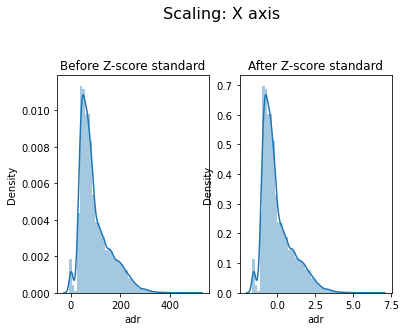

In [126]:
# Seaborn Distplot

fig, ax =plt.subplots(1,2)
sns.distplot(numerical1['adr'], ax=ax[0])
sns.distplot(numerical_standardized1['adr'], ax=ax[1])
ax[0].set_title('Before Z-score standard')
ax[1].set_title('After Z-score standard')
fig.suptitle(' Scaling: X axis',fontsize=15,size=16, y=1.12)

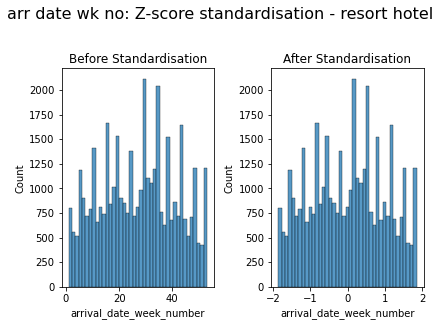

In [127]:
# Seaborn Histplot


fig, ax =plt.subplots(1,2)
sns.histplot(numerical1['arrival_date_week_number'], ax=ax[0])
sns.histplot(numerical_standardized1['arrival_date_week_number'], ax=ax[1])
ax[0].set_title('Before Standardisation')
ax[1].set_title('After Standardisation')
fig.suptitle('arr date wk no: Z-score standardisation - resort hotel',fontsize=15,size=16, y=1.12)
fig.tight_layout()

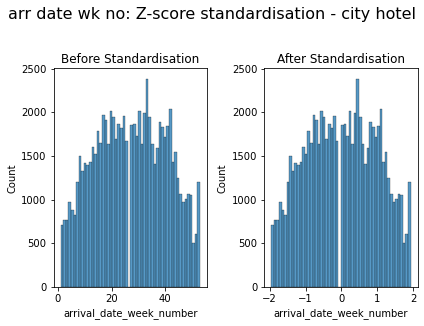

In [128]:
# Seaborn Histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['arrival_date_week_number'], ax=ax[0])
sns.histplot(numerical_standardized2['arrival_date_week_number'], ax=ax[1])
ax[0].set_title('Before Standardisation')
ax[1].set_title('After Standardisation')
fig.suptitle('arr date wk no: Z-score standardisation - city hotel',fontsize=15,size=16, y=1.12)
fig.tight_layout()

(0.0, 1.0)

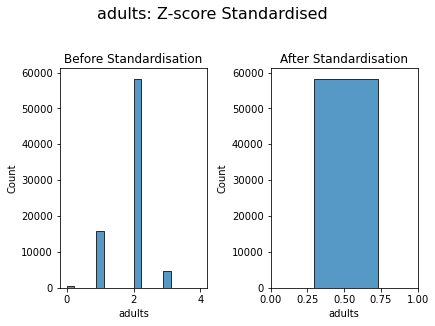

In [129]:
# Seaborn Histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical2['adults'], ax=ax[0])
sns.histplot(numerical_standardized2['adults'], ax=ax[1])
ax[0].set_title('Before Standardisation')
ax[1].set_title('After Standardisation')
fig.suptitle('adults: Z-score Standardised',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

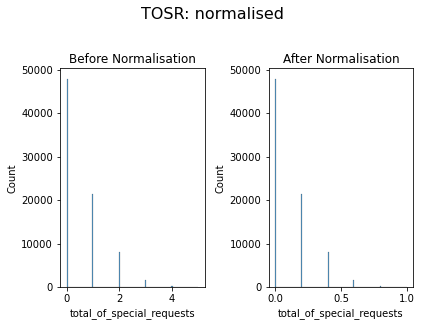

In [130]:
# Seaborn Histplot

fig, ax =plt.subplots(1,2)
sns.histplot(numerical2['total_of_special_requests'], ax=ax[0])

sns.histplot(df_num2['total_of_special_requests'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('TOSR: normalised',fontsize=15,size=16, y=1.12)
fig.tight_layout()

(0.0, 1.0)

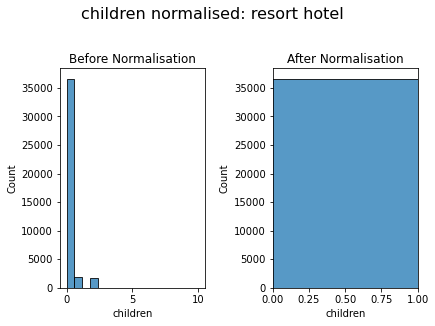

In [131]:
# Seaborn Histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical1['children'], ax=ax[0])
sns.histplot(numerical_standardized1['children'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('children normalised: resort hotel',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

(0.0, 1.0)

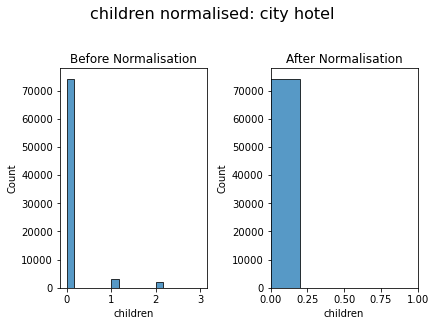

In [132]:
# Seaborn Histplot

fig, ax =plt.subplots(1,2)

sns.histplot(numerical2['children'], ax=ax[0])
sns.histplot(numerical_standardized2['children'], ax=ax[1])
ax[0].set_title('Before Normalisation')
ax[1].set_title('After Normalisation')
fig.suptitle('children normalised: city hotel',fontsize=15,size=16, y=1.12)
fig.tight_layout()
plt.xlim([0,1])

***


## Step 5: Scatterplots for numerical variables
Lyndon B.

##### Code references:
- https://stackoverflow.com/questions/38913965/make-the-size-of-a-heatmap-bigger-with-seaborn

### 5.1 Explore correlations for later anaysis with Scatterplot

##### Explore with Heatmap (Resort hotel)
Generating a heatmap which we can cross-reference with pairplots and other data visualisations
to understand the data better in powerful ways

This heatmap is displaying values for the resort hotels dataframe

Text(0.5, 1.0, 'Resort hotel correlational heatmap')

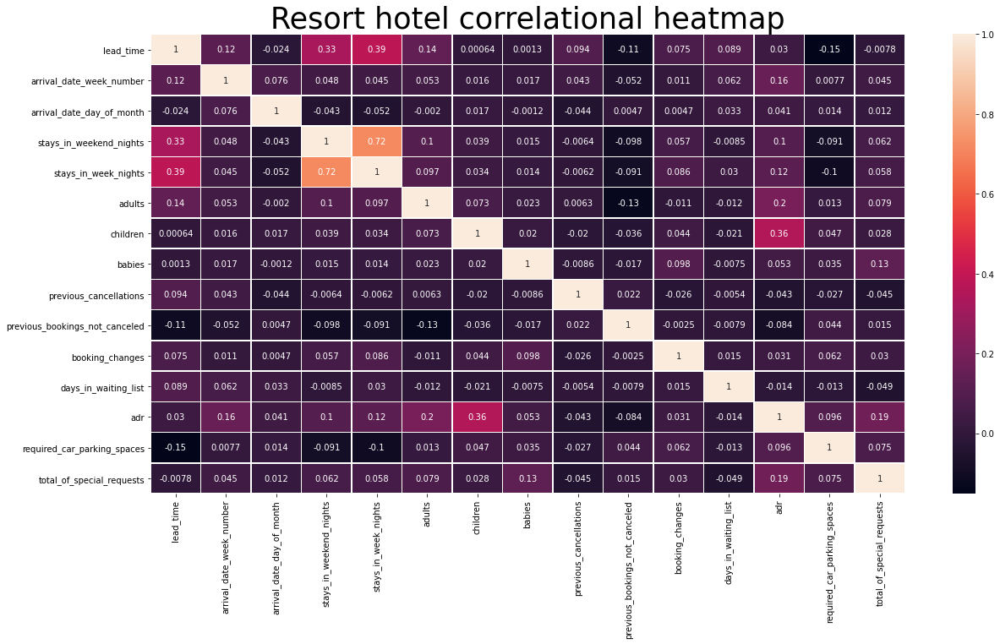

In [133]:
# References: https://stackoverflow.com/questions/38913965/make-the-size-of-a-heatmap-bigger-with-seaborn

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(20,10))         # Sample figsize in inches
sns.heatmap(df_num1.corr(), annot=True, linewidths=.5, ax=ax)
ax.set_title("Resort hotel correlational heatmap",fontsize=35)

Text(0.5, 1.0, 'City hotel correlational heatmap')

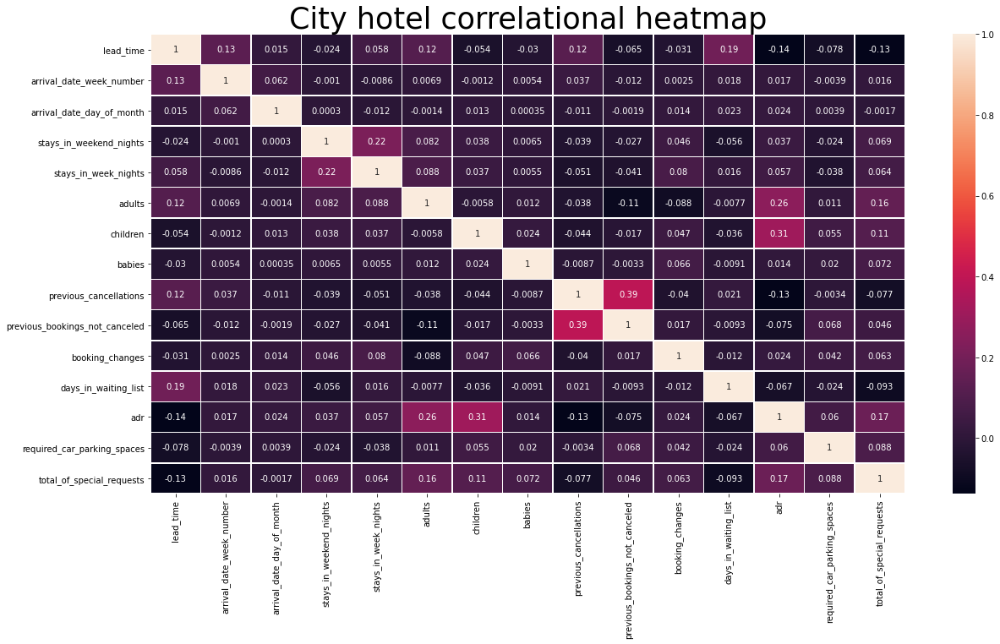

In [134]:
#References: https://stackoverflow.com/questions/38913965/make-the-size-of-a-heatmap-bigger-with-seaborn

fig, ax = plt.subplots(figsize=(20,10))         # Sample figsize in inches
sns.heatmap(df_num2.corr(), annot=True, linewidths=.5, ax=ax)
ax.set_title("City hotel correlational heatmap",fontsize=35)

##### Explore with pairplot (Resort hotel)
Generating a pairplot for the resort hotels dataframe, this can help us to see at a glance
interesting data relations, potential correlations, patterns, outliers and irrelevancies
in the data by comparing all columns.

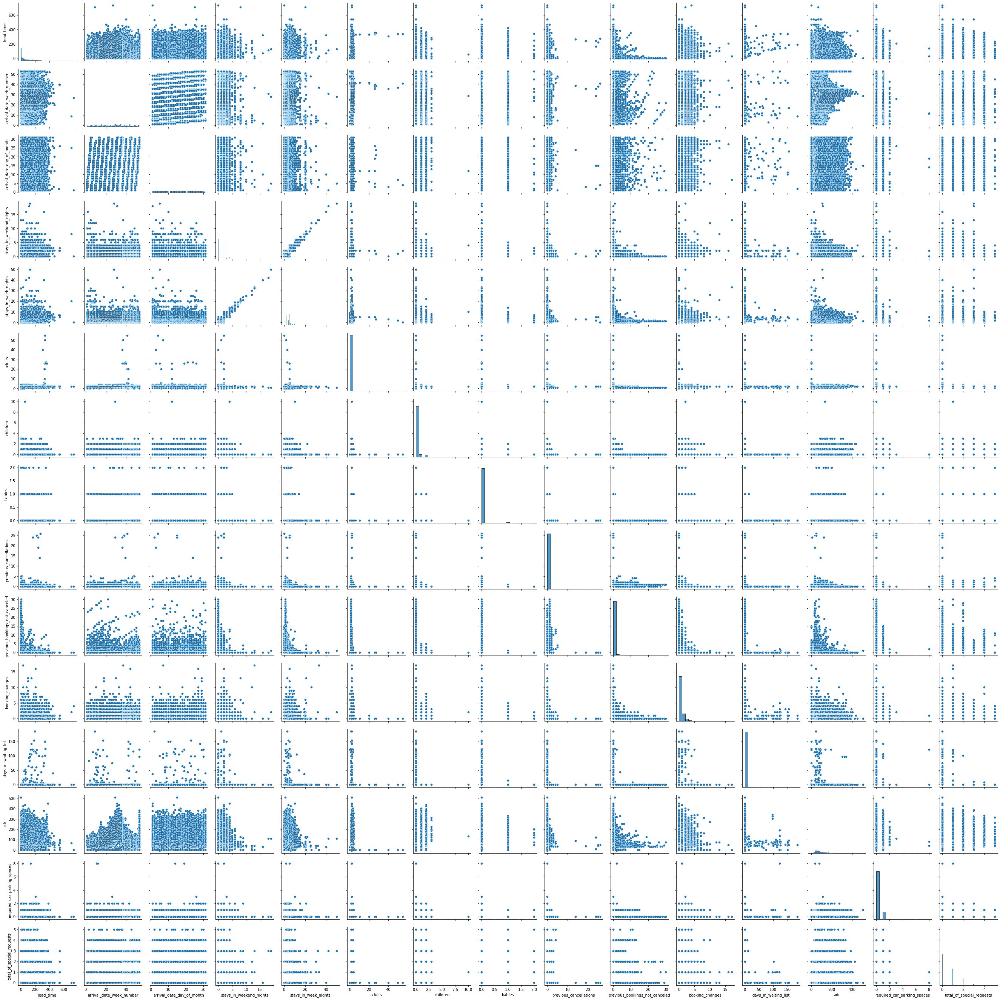

In [135]:
sns.pairplot(numerical1)

##### Explore with pairplot (City hotel)
Generating a pairplot for the city hotels dataframe, this can help us to see at a glance
interesting data relations, potential correlations, patterns, outliers and irrelevancies
in the data by comparing all columns.

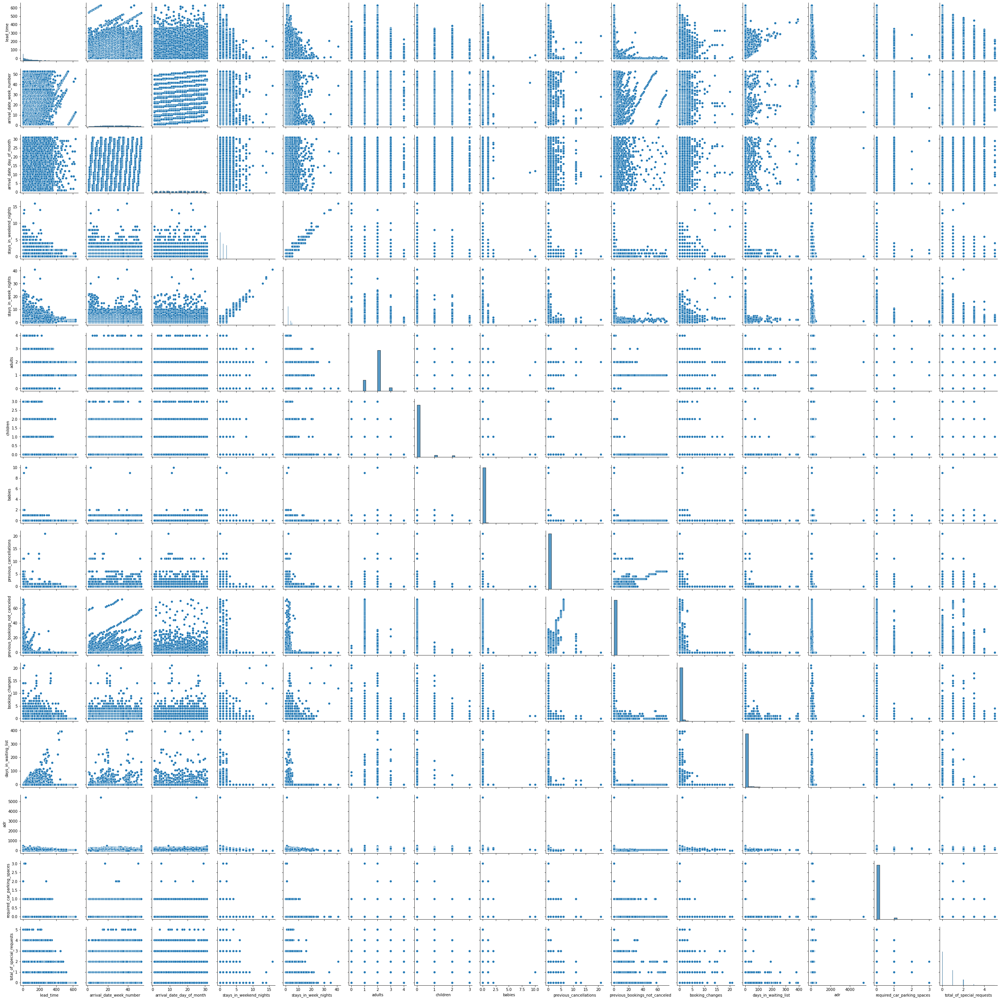

In [136]:
sns.pairplot(numerical2)

### 5.2 Scatterplot visualizations

#### Relationships which show at least some correlation in Resort Hotel

From the pairplot an the heatmaps as a cross-reference, we can look at some relationships which might be promising.

Text(0.5, 1.0, 'stays_in_week_nights vs stays_in_weekend_nights')

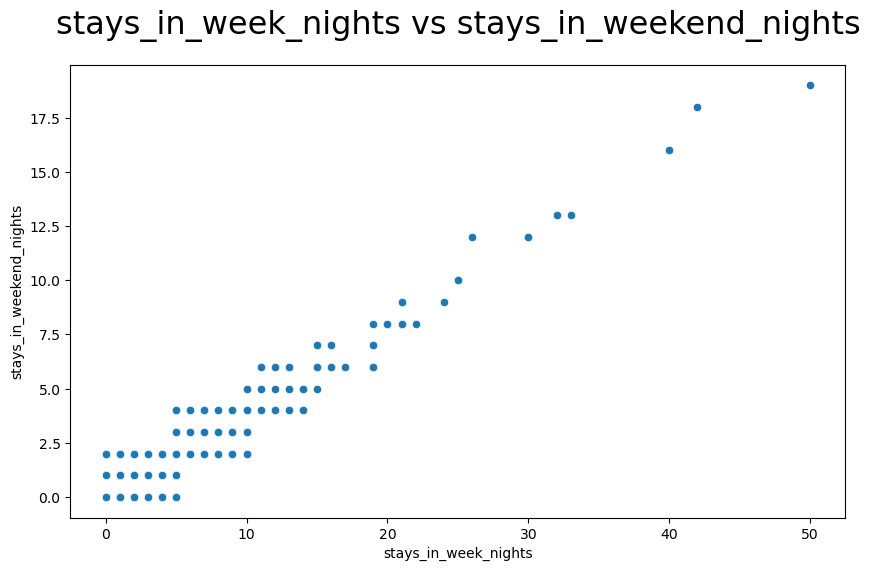

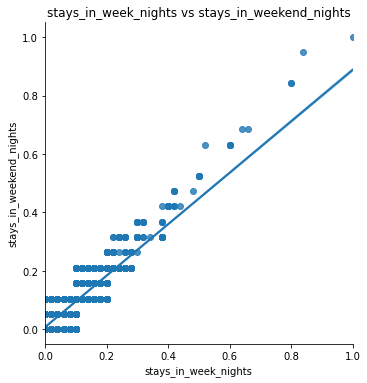

In [137]:
# Seaborn Scatterplot

ax = numerical1


x = ax['stays_in_week_nights']
y = ax['stays_in_weekend_nights']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('stays_in_week_nights vs stays_in_weekend_nights', fontsize = 23, y =1.05);

sns.lmplot(x='stays_in_week_nights',y='stays_in_weekend_nights',data=df_num1)
ax = plt.gca()
ax.set_title("stays_in_week_nights vs stays_in_weekend_nights")

#####  Observations 'stays_in_weekend_nights vs stays_in_week_nights' plot

stays_in_weekend_nights vs stays_in_week_nights shows extreme promise as a candidate for strong correlation, visually easily identifiable in pairplot and in the heatmap for resort hotel. we find a positive correlation of 0.72 and a moderate correlation in the other hotel. Unfortunately this is not helpful as it looks. The data visualisations should show us useful information which we cannot know beforehand. In this case a little interpretation shows that the correlation is just the effect of people who stay in the hotel for more than a week-day and inclusive of a weekend days which we would naturally expect to correlate to some extent.

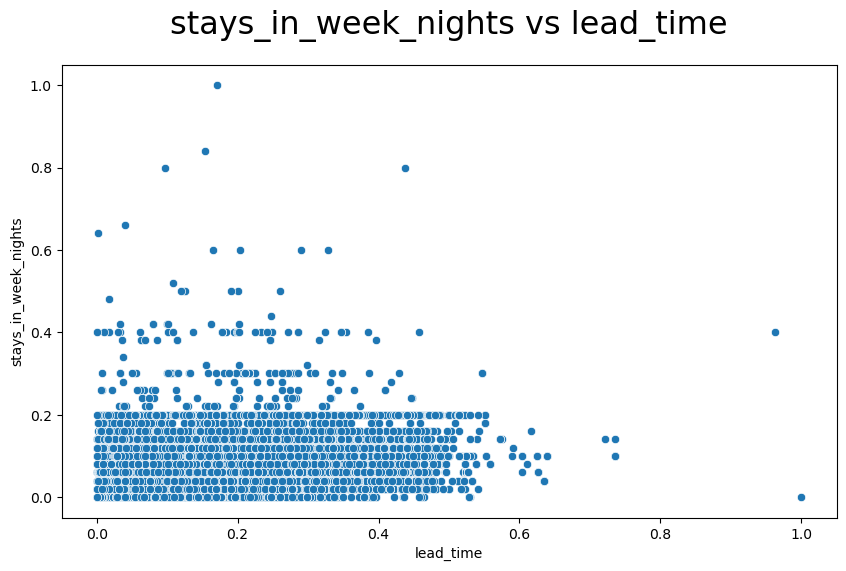

In [138]:
# Seaborn Scatterplot

ax = df_num1


x = ax['lead_time']
y = ax['stays_in_week_nights']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('stays_in_week_nights vs lead_time', fontsize = 23, y =1.05);

##### Observations 'stays_in_week_nights vs lead_time' plot

In this comparison we can fit a line slightly better though we still have some familiar 
prolems, outliers, vertical clustered data, overplotting. The correlation is slightly stronger
than the previous comparison at 0.39 but still relatively weak.

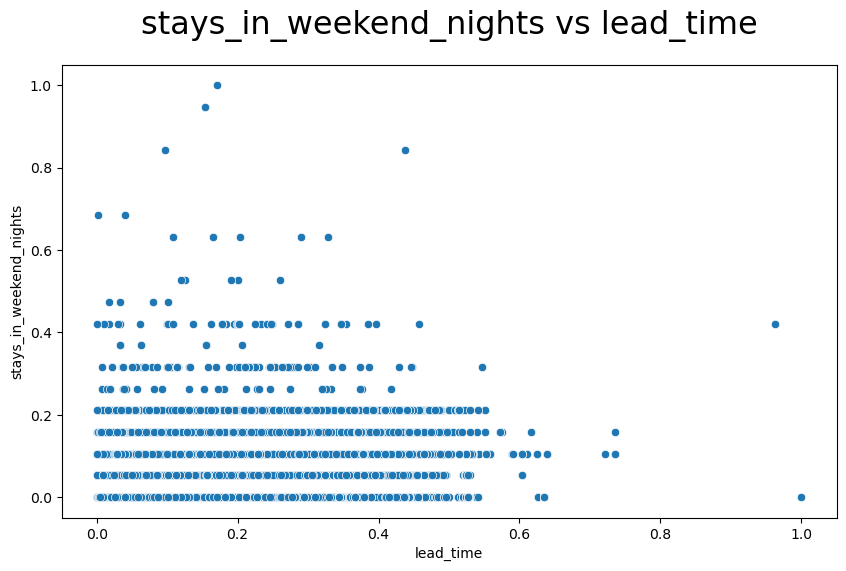

In [139]:
# Seaborn Scatterplot

ax = df_num1


x = ax['lead_time']
y = ax['stays_in_weekend_nights']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('stays_in_weekend_nights vs lead_time', fontsize = 23, y =1.05);

##### Observation 'stays_in_weekend_nights vs lead_time'  plot

These features show weak to moderate correlation in overview.The linear graphic shows but since the vertical bands make the data look more categorical, this might not be an ideal candidate feature comparison for further analysis,this problem is to be discussed more in the section of rejected scatterplots

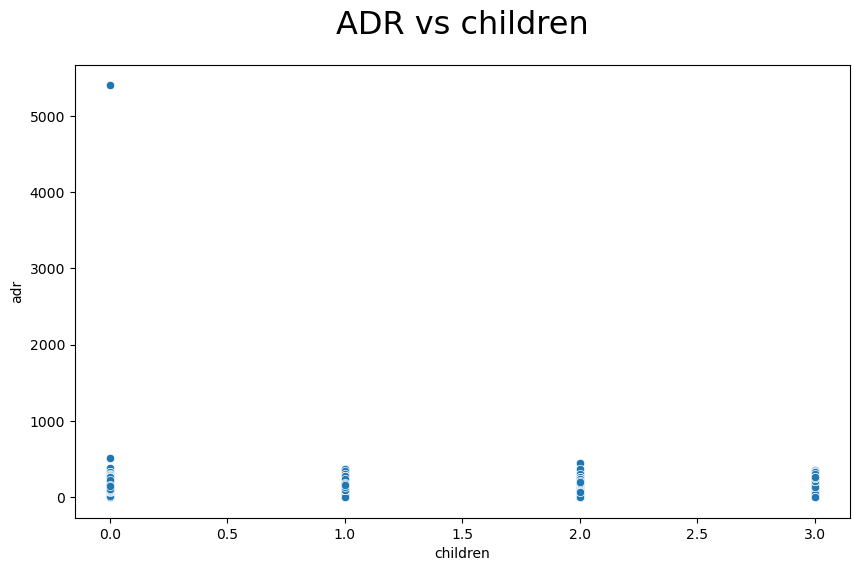

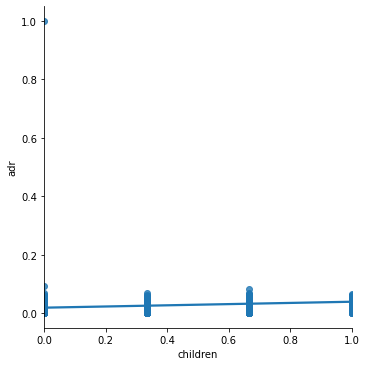

In [140]:
# Seaborn Scatterplot
# Seaborn Lmplot

x = numerical2['children']
y = numerical2['adr']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=numerical2 )
scatter.set_title('ADR vs children', fontsize = 23, y =1.05);

sns.lmplot(x='children',y='adr',data=df_num2)

##### Observations 'adr vs children'  plot

The vertical bands could be confusing however we expect this to be the case with children which, afterall, are a constant and cannot be a continuous variable.This may make this not an ideal candidate for further analysis. A relationship between adr and children is plausible however, in terms of positive linearity as a greater number of children would presumably require larger rooms. 

#### Features in City hotels which exhibit at least some correlation
Overall there are weaker correlations found in this dataframe although the correlations in Resort hotel were generally either not strong or not good candidates for further analysis, or both

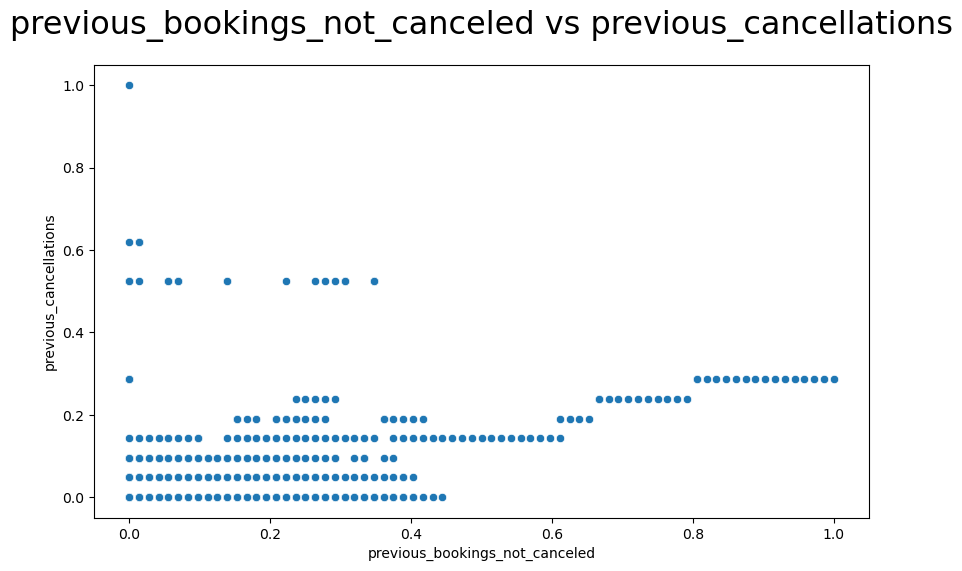

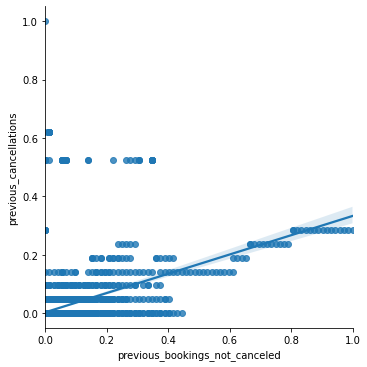

In [141]:
# Seaborn Scatterplot
# Seaborn Lmplot


x = df_num2['previous_bookings_not_canceled']
y = df_num2['previous_cancellations']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=df_num2 )
scatter.set_title('previous_bookings_not_canceled vs previous_cancellations', fontsize = 23, y =1.05);

sns.lmplot(x='previous_bookings_not_canceled',y='previous_cancellations',data=df_num2)

##### Observations 'previous_bookings_not_canceled vs previous_cancellations' plot

Although we can still see horizontal bands of data and outliers, we can make out a positive
line in this graph comparing features from city hotel, which showed a correlation of 0.39.
Perhaps customers with more stays overall are more likely to have both cancellations and
bookings not canceled, and if this were a business question, this relationship could be investigated in more depth though the correlation is still not strong.

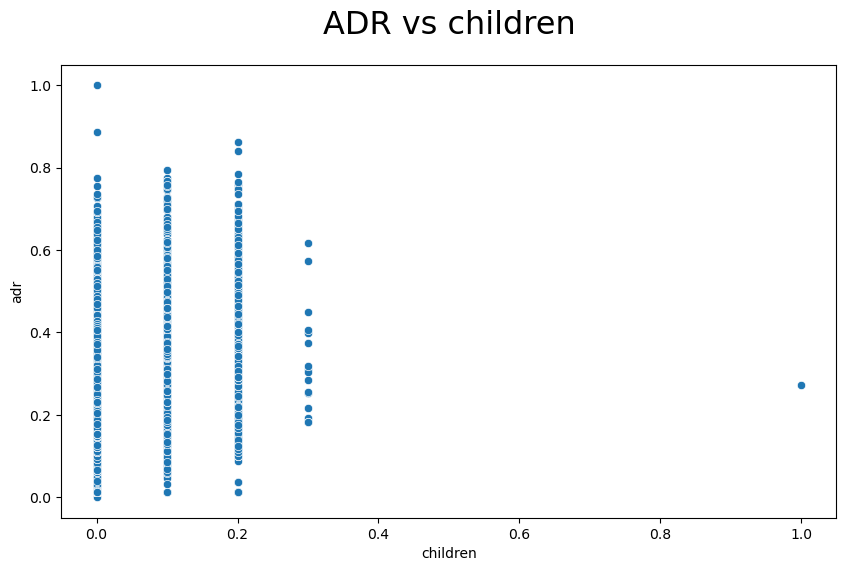

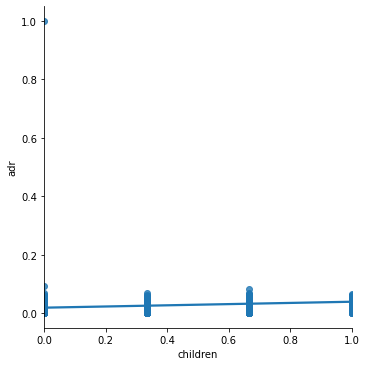

In [142]:
# Seaborn Scatterplot
# Seaborn Lmplot

x = ax['children']
y = ax['adr']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=df_num2 )
scatter.set_title('ADR vs children', fontsize = 23, y =1.05);

sns.lmplot(x='children',y='adr',data=df_num2)

Text(0.5, 1.0, 'adr vs adults: city hotel')

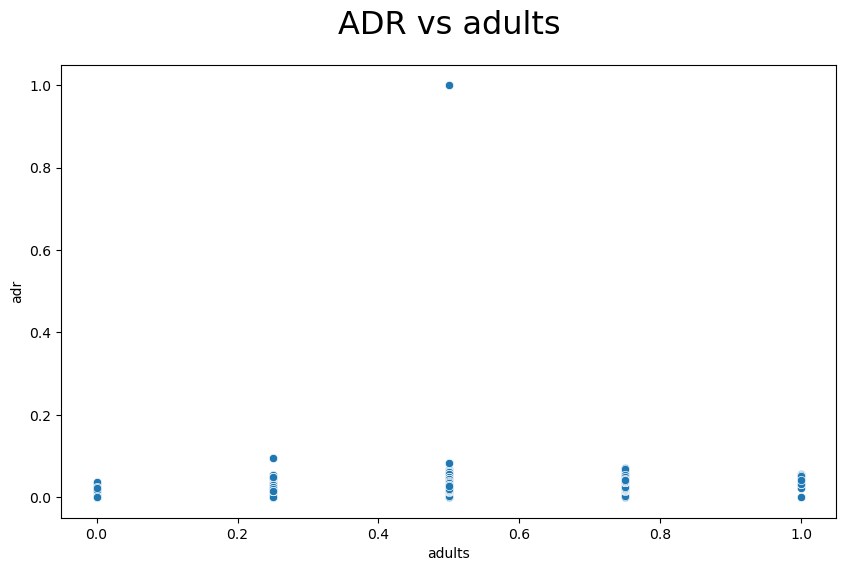

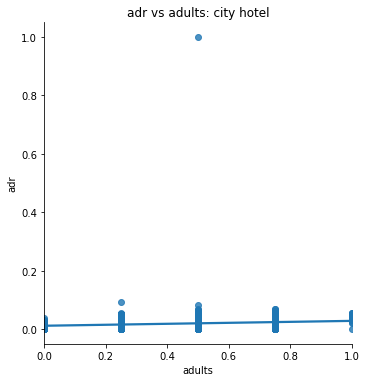

In [143]:
# Seaborn Scatterplot
# Seaborn Lmplot

x = df_num2['adults']
y = df_num2['adr']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=df_num2 )
scatter.set_title('ADR vs adults', fontsize = 23, y =1.05);

sns.lmplot(x='adults',y='adr',data=df_num2)
ax = plt.gca()
ax.set_title('adr vs adults: city hotel')

##### Observations 'adr vs adults' plot
At 0.26 this is an even weaker correlation found in the city hotel and resembles the comparison between adr and children. Again, there is some plausibility to a positive linear relationship since a greater number of adults presumably require more expensive lodgings

***



## Step 6: Exploratory Data Analysis
Kenny T.

### Domain Issue: Find the busiest months from the given years 

Based on the chosen dataset, we proposed our domain problem to focus on knowing exactly which months are the busiest for the hotels. This analysis will be conducted on bookings of historical data collected from 2015, 2016 and 2017. It will be helpful to any business that wishes to plan their resources budgets allocations in advance.
 

#### Visualizations included
- Barplot: differences between city and resort hotel
- Barplot: the busiest months for Hotel bookings
- Count of people vs Months of year = June ---*
- Booking vs Year
- Country vs Count (hue by year)
- June ---*  hotel 1 vs hotel2
- Weeks or Weekends is most preferred and busiest?

##### Code references:
- https://datacarpentry.org/python-ecology-lesson/05-merging-data/index.html
- https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e
- https://stackoverflow.com/questions/31594549/how-do-i-change-the-figure-size-for-a-seaborn-plot
- https://www.dataforeverybody.com/seaborn-legend-change-location-size/
- http://seaborn.pydata.org/generated/seaborn.lmplot.html

### 6.1 Dropping columns we do not need for the analysis
For the purpose of making the Exploratory Data Analysis easier and more granular, I will drop the columns that are not necessary to answer our domain problem. But first, we need to pull together the cleaned and transformed datasets (categorical, discrete, continuous, dates) we obtained from our step 1 of data preparation, so we can build the analysis with all the features available to a single dataset. 

In [144]:
# code inspiration https://datacarpentry.org/python-ecology-lesson/05-merging-data/index.html
# Place the DataFrames side by side
clean_df = pd.concat([categorical, discrete, continuous, dates], axis=1)
clean_df

,hotel,is_canceled,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,customer_type,reservation_status,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,adr,arrival_date_month,reservation_status_date,arrival_date_year
0,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out,342,27,1,0,0,2,0,0,0,0,3,0,0,0,0.00,July,2015-07-01,2015
1,Resort Hotel,0,BB,PRT,Direct,Direct,0,C,C,No Deposit,9,Transient,Check-Out,737,27,1,0,0,2,0,0,0,0,4,0,0,0,0.00,July,2015-07-01,2015
2,Resort Hotel,0,BB,GBR,Direct,Direct,0,A,C,No Deposit,9,Transient,Check-Out,7,27,1,0,1,1,0,0,0,0,0,0,0,0,75.00,July,2015-07-02,2015
3,Resort Hotel,0,BB,GBR,Corporate,Corporate,0,A,A,No Deposit,304,Transient,Check-Out,13,27,1,0,1,1,0,0,0,0,0,0,0,0,75.00,July,2015-07-02,2015
4,Resort Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,240,Transient,Check-Out,14,27,1,0,2,2,0,0,0,0,0,0,0,1,98.00,July,2015-07-03,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,BB,BEL,Offline TA/TO,TA/TO,0,A,A,No Deposit,394,Transient,Check-Out,23,35,30,2,5,2,0,0,0,0,0,0,0,0,96.14,August,2017-09-06,2017
119386,City Hotel,0,BB,FRA,Online TA,TA/TO,0,E,E,No Deposit,9,Transient,Check-Out,102,35,31,2,5,3,0,0,0,0,0,0,0,2,225.43,August,2017-09-07,2017
119387,City Hotel,0,BB,DEU,Online TA,TA/TO,0,D,D,No Deposit,9,Transient,Check-Out,34,35,31,2,5,2,0,0,0,0,0,0,0,4,157.71,August,2017-09-07,2017
119388,City Hotel,0,BB,GBR,Online TA,TA/TO,0,A,A,No Deposit,89,Transient,Check-Out,109,35,31,2,5,2,0,0,0,0,0,0,0,0,104.40,August,2017-09-07,2017


In [145]:
domain_df = clean_df.drop(['lead_time','meal','market_segment','distribution_channel','is_repeated_guest','previous_cancellations','previous_bookings_not_canceled','reserved_room_type','assigned_room_type','booking_changes','deposit_type','previous_bookings_not_canceled','reservation_status','deposit_type','agent','days_in_waiting_list','reservation_status_date','customer_type','required_car_parking_spaces','total_of_special_requests','reservation_status','reservation_status_date'], axis=1)

domain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 13 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   hotel                      119390 non-null  object 
 1   is_canceled                119390 non-null  object 
 2   country                    119390 non-null  object 
 3   arrival_date_week_number   119390 non-null  int64  
 4   arrival_date_day_of_month  119390 non-null  int64  
 5   stays_in_weekend_nights    119390 non-null  int64  
 6   stays_in_week_nights       119390 non-null  int64  
 7   adults                     119390 non-null  int64  
 8   children                   119390 non-null  int64  
 9   babies                     119390 non-null  int64  
 10  adr                        119390 non-null  float64
 11  arrival_date_month         119390 non-null  object 
 12  arrival_date_year          119390 non-null  object 
dtypes: float64(1), int64(7), obje

### 6.2  Sort out the overall cancellation rate for Hotels
In order to work with sensible data, we need to consider and work out all the bookings that haven't actually been checked in.

##### Result:
There are 44224 cancellations. From here we will operate removing canceled bookings for granular analysis, and we will work only with customers who checked in to the hotels.

In [146]:
# Return the series containing the unique rows in the columns, 'is_canceled' DataFrame.
domain_df['is_canceled'].value_counts()

0    75166
1    44224
Name: is_canceled, dtype: int64

In [147]:
confirmed_df = domain_df[(domain_df.is_canceled == 0)] 

In [148]:
confirmed_df.shape

(75166, 13)

### 6.3  Adjust children and adults features to fit next analysis 

In [149]:
confirmed_df.isnull().sum()

hotel                        0
is_canceled                  0
country                      0
arrival_date_week_number     0
arrival_date_day_of_month    0
stays_in_weekend_nights      0
stays_in_week_nights         0
adults                       0
children                     0
babies                       0
adr                          0
arrival_date_month           0
arrival_date_year            0
dtype: int64

In [150]:
confirmed_df.children.value_counts()

0    69702
1     3294
2     2111
3       59
Name: children, dtype: int64

In [151]:
confirmed_df.adults.value_counts()

2    54422
1    16353
3     4051
0      294
4       46
Name: adults, dtype: int64

In [152]:
# Replace adult 0 values to higest values counts based on mode values

confirmed_df["adults"].replace(0, 2,inplace=True)

In [153]:
confirmed_df.adults.value_counts()

2    54716
1    16353
3     4051
4       46
Name: adults, dtype: int64

In [154]:
confirmed_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75166 entries, 0 to 119389
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   hotel                      75166 non-null  object 
 1   is_canceled                75166 non-null  object 
 2   country                    75166 non-null  object 
 3   arrival_date_week_number   75166 non-null  int64  
 4   arrival_date_day_of_month  75166 non-null  int64  
 5   stays_in_weekend_nights    75166 non-null  int64  
 6   stays_in_week_nights       75166 non-null  int64  
 7   adults                     75166 non-null  int64  
 8   children                   75166 non-null  int64  
 9   babies                     75166 non-null  int64  
 10  adr                        75166 non-null  float64
 11  arrival_date_month         75166 non-null  object 
 12  arrival_date_year          75166 non-null  object 
dtypes: float64(1), int64(7), object(5)
memory usa

In [156]:
confirmed_df.shape

(75166, 13)

### 6.4 Visualize differences in data between hotel types
Checking for the values of the records of the dataframe features City Hotels and Resort Hotels, to check if it we can distinguish between city and resort hotels results.

##### Result:
We see that the is a major difference between City hotels and Resort hotels for check-in days, therefore, for the purposes of exploring the dataset accurately and for a more refined analysis, we proceed by splitting the dataset in two, based on the feature hotel type: "City Hotel" and "Resort"

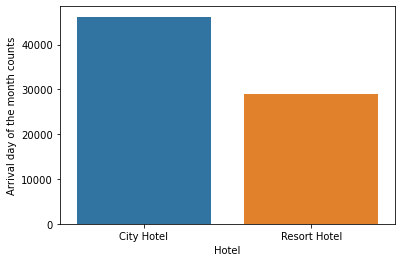

In [157]:
# Seaborn Barplot 

kx = confirmed_df.groupby('hotel').arrival_date_day_of_month.count().reset_index()
sns.barplot(x='hotel', y='arrival_date_day_of_month',data= kx)
plt.xlabel ('Hotel')
plt.ylabel ('Arrival day of the month counts')
plt.show()

### 6.5 Generate new dataframes based on hotel type
We will obtain two datsets to analyse and compare together for a more indepth analysis

In [158]:
df_resort = confirmed_df[confirmed_df['hotel'] == 'Resort Hotel']
df_resort

,hotel,is_canceled,country,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month,arrival_date_year
0,Resort Hotel,0,PRT,27,1,0,0,2,0,0,0.00,July,2015
1,Resort Hotel,0,PRT,27,1,0,0,2,0,0,0.00,July,2015
2,Resort Hotel,0,GBR,27,1,0,1,1,0,0,75.00,July,2015
3,Resort Hotel,0,GBR,27,1,0,1,1,0,0,75.00,July,2015
4,Resort Hotel,0,GBR,27,1,0,2,2,0,0,98.00,July,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,Resort Hotel,0,GBR,35,31,2,8,2,1,0,89.75,August,2017
40056,Resort Hotel,0,IRL,35,30,2,9,2,0,0,202.27,August,2017
40057,Resort Hotel,0,IRL,35,29,4,10,2,0,0,153.57,August,2017
40058,Resort Hotel,0,GBR,35,31,4,10,2,0,0,112.80,August,2017


In [159]:
df_city = confirmed_df[confirmed_df['hotel'] == 'City Hotel']
df_city

,hotel,is_canceled,country,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month,arrival_date_year
40060,City Hotel,0,PRT,27,1,0,2,1,0,0,0.00,July,2015
40066,City Hotel,0,PRT,27,2,0,3,1,0,0,58.67,July,2015
40070,City Hotel,0,PRT,27,3,0,2,2,0,0,86.00,July,2015
40071,City Hotel,0,PRT,27,3,0,2,2,0,0,43.00,July,2015
40072,City Hotel,0,PRT,27,3,0,2,2,0,0,86.00,July,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,BEL,35,30,2,5,2,0,0,96.14,August,2017
119386,City Hotel,0,FRA,35,31,2,5,3,0,0,225.43,August,2017
119387,City Hotel,0,DEU,35,31,2,5,2,0,0,157.71,August,2017
119388,City Hotel,0,GBR,35,31,2,5,2,0,0,104.40,August,2017


### 6.6 Explore numerical variables association and any significance in findings

#### Extract numerical variables for both Resort and City Hotels

In [160]:
city_num_df = df_city.select_dtypes(exclude ='O')
city_num_df

,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr
40060,27,1,0,2,1,0,0,0.00
40066,27,2,0,3,1,0,0,58.67
40070,27,3,0,2,2,0,0,86.00
40071,27,3,0,2,2,0,0,43.00
40072,27,3,0,2,2,0,0,86.00
...,...,...,...,...,...,...,...,...
119385,35,30,2,5,2,0,0,96.14
119386,35,31,2,5,3,0,0,225.43
119387,35,31,2,5,2,0,0,157.71
119388,35,31,2,5,2,0,0,104.40


In [161]:
resort_num_df = df_resort.select_dtypes(exclude ='O')
resort_num_df

,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr
0,27,1,0,0,2,0,0,0.00
1,27,1,0,0,2,0,0,0.00
2,27,1,0,1,1,0,0,75.00
3,27,1,0,1,1,0,0,75.00
4,27,1,0,2,2,0,0,98.00
...,...,...,...,...,...,...,...,...
40055,35,31,2,8,2,1,0,89.75
40056,35,30,2,9,2,0,0,202.27
40057,35,29,4,10,2,0,0,153.57
40058,35,31,4,10,2,0,0,112.80


#### Check for any correlation between lead times and other numerical variables from the DataFrame 
Result: Showing very low correlation in numerical variables from initial touch point

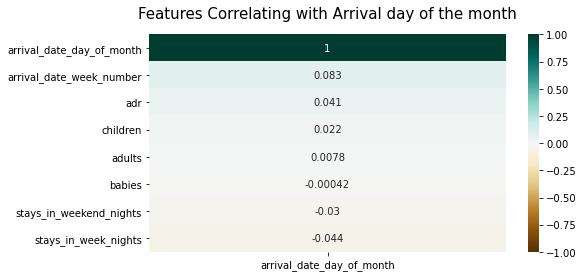

In [162]:
# Reference: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e
# Checking to see correlation with one variable form the dataset 
# Seaborn correlation plot

plt.figure(figsize=(8, 4))
heatmap = sns.heatmap(resort_num_df.corr()[['arrival_date_day_of_month']].sort_values(by='arrival_date_day_of_month', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with Arrival day of the month', fontdict={'fontsize':15}, pad=16);

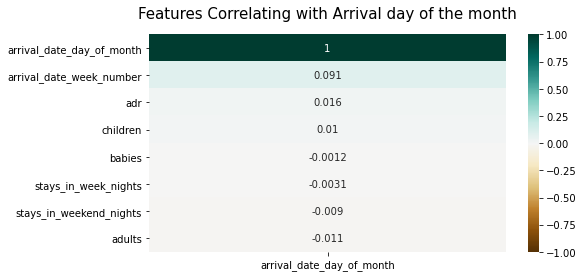

In [163]:
# Reference: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e
# Checking to see correlation with one variable form the dataset 
# Seaborn correlation plot

plt.figure(figsize=(8, 4))
heatmap = sns.heatmap(city_num_df.corr()[['arrival_date_day_of_month']].sort_values(by='arrival_date_day_of_month', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with Arrival day of the month', fontdict={'fontsize':15}, pad=16);

#### Check for overall correlations of numerical data from the Dataframe (City hotel) 

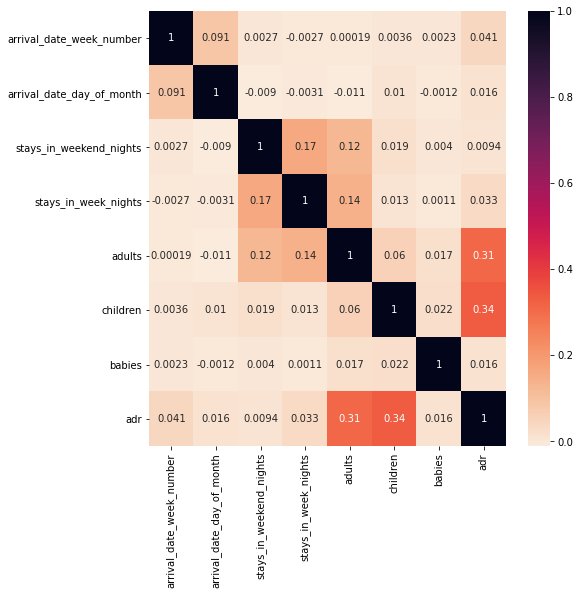

In [164]:
# Seaborn correlation plot

plt.figure(figsize=(8,8))
sns.heatmap(city_num_df.corr(),annot=True,cmap='rocket_r')

##### Check for overall correlations of numerical data from the Dataframe (Resort hotel) 

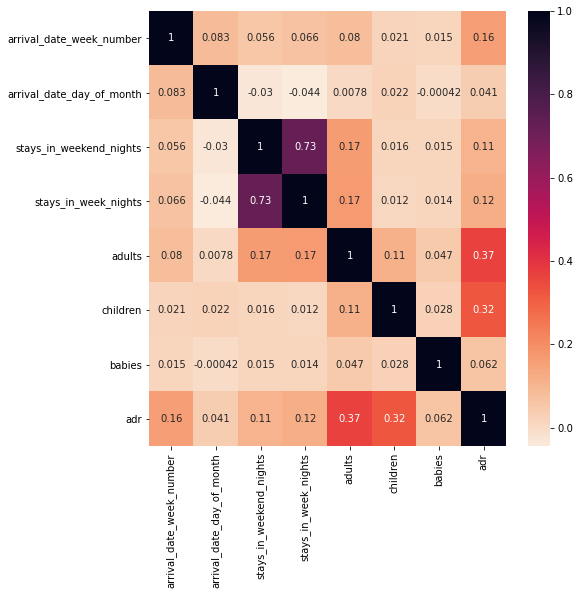

In [165]:
# Seaborn correlation plot

plt.figure(figsize=(8,8))
sns.heatmap(resort_num_df.corr(),annot=True,cmap='rocket_r')

There is some correlation for week days and week nights stay in hotels, but due to the week being seven days its an expected relationship we foresee. Other than the two closely related variables, the rest of the variables do not show any coherence in any shape or form we can interpret. we may find more clarity later in Principle component analysis. 

#### Relationship in plots

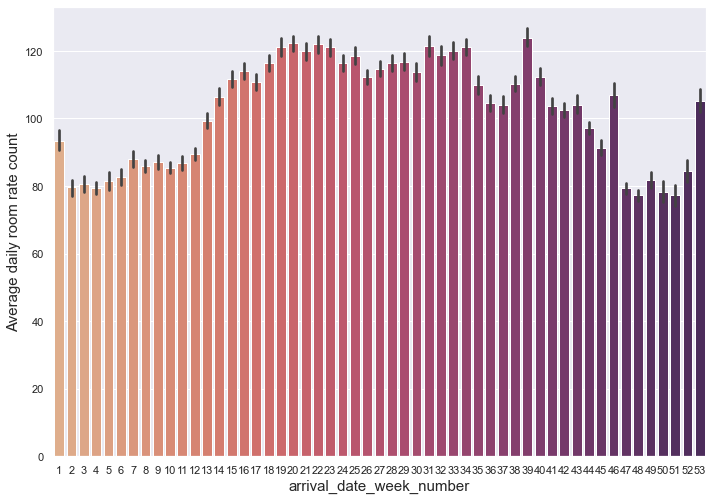

In [166]:
# Seaborn Barplot

# References: https://stackoverflow.com/questions/31594549/how-do-i-change-the-figure-size-for-a-seaborn-plot

sns.set(rc={'figure.figsize':(11.7,8.27)})
ax=sns.barplot(x='arrival_date_week_number',y='adr',data=city_num_df,palette=('flare')) 

ax.set_xlabel('arrival_date_week_number', fontdict={'fontsize':15});
ax.set_ylabel('Average daily room rate count', fontdict={'fontsize':15});

We see the average room rates for city hotels stay mostly with in the range on 80 - 120 for booking counts. 

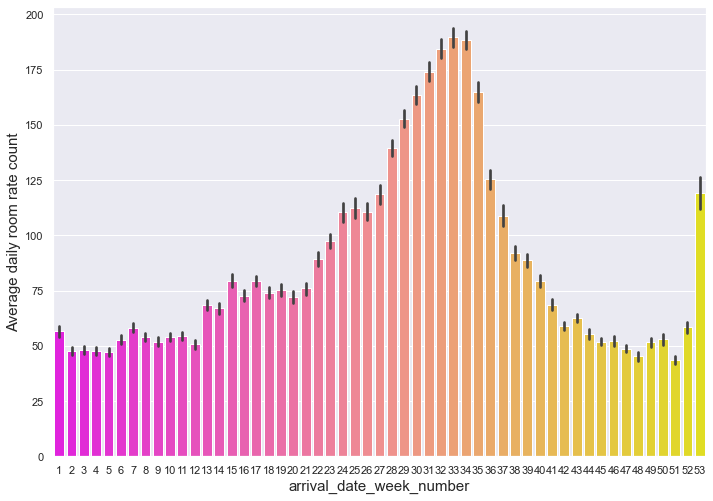

In [167]:
# Seaborn Barplot

# References: https://stackoverflow.com/questions/31594549/how-do-i-change-the-figure-size-for-a-seaborn-plot

sns.set(rc={'figure.figsize':(11.7,8.27)});
fx=sns.barplot(x='arrival_date_week_number',y='adr',data=resort_num_df,palette=("spring")) 

fx.set_xlabel('arrival_date_week_number', fontdict={'fontsize':15});
fx.set_ylabel('Average daily room rate count', fontdict={'fontsize':15});

With resort hotels we see a pattern of moslty bookings that show 'low' activity to 'high' depending on year seasons perhaps, this could also mean the marginal gross average daily rate is variable depending on seasons peak activity.

#### Explore adr for Resort Hotels 

The figure shows most weeknights stays per booking between 0-10 Nights, there are a few outliers, and these could come from group bookings or long stay types. Average daily room rate also is at its peak for day of 10 or less, showing a decrease in price after 10 days and long term bookings may be sold at a lower per night room price point.

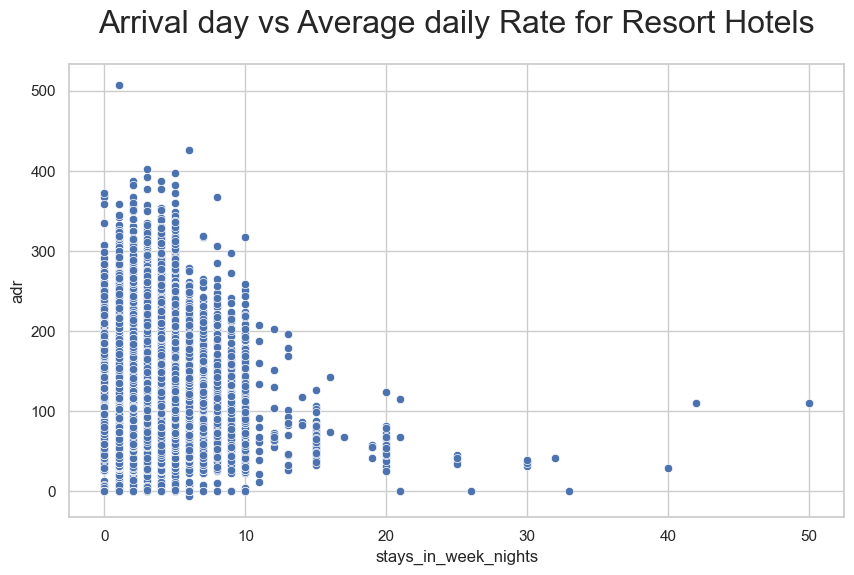

In [168]:
# Seaborn Scatter plot 

# References: https://www.dataforeverybody.com/seaborn-legend-change-location-size/

sns.set_style('whitegrid')

# acquire the data
ax = resort_num_df

# define the axes content
x = ax['stays_in_week_nights']
y = ax['adr']

#sns.scatterplot from DataFrame
fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=ax )
scatter.set_title('Arrival day vs Average daily Rate for Resort Hotels', fontsize = 23, y =1.05);

#### Explore adr for City Hotels 
The figure shows most weeknights stays per booking between 0-10 Nights, there are a few outliers as we can see in graph and these may come from group or long stay booking types. Average daily room rate also is at its peak for day of 6 or less, showing a decrease in price after 6 days of Hotel night stays.

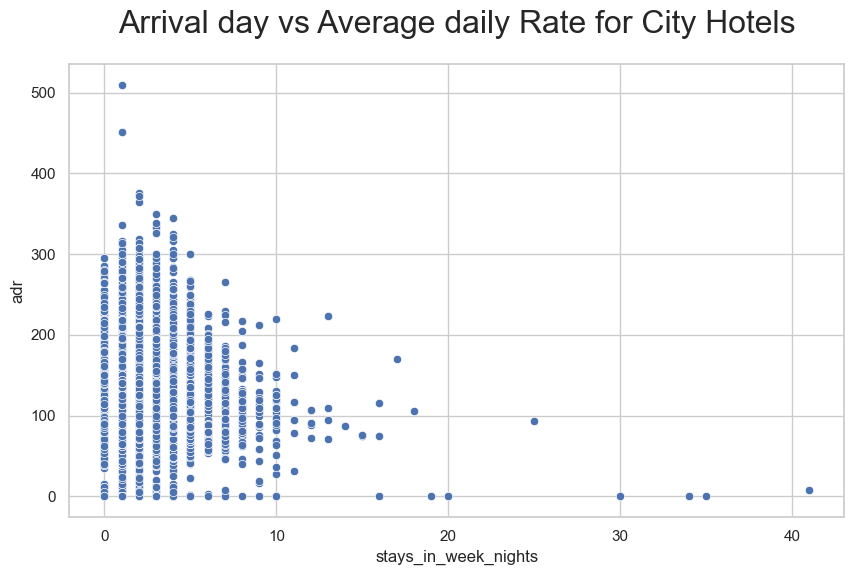

In [170]:
# Seaborn Scatter plot 

# References: https://www.dataforeverybody.com/seaborn-legend-change-location-size/

sns.set_style('whitegrid')

# acquire the data
mx = city_num_df

# define the axes content
x = mx['stays_in_week_nights']
y = mx['adr']

#sns.scatterplot from DataFrame
fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=mx )
scatter.set_title('Arrival day vs Average daily Rate for City Hotels', fontsize = 23, y =1.05);

####  Numerical associations and findings with Implots (Resort hotel)
We see there is peak activity surounding the busy months in summer and once again peaking towards the end of the year. Average Room rate scale upwards with mostly 2 or 3 adults per booking check-in's. 

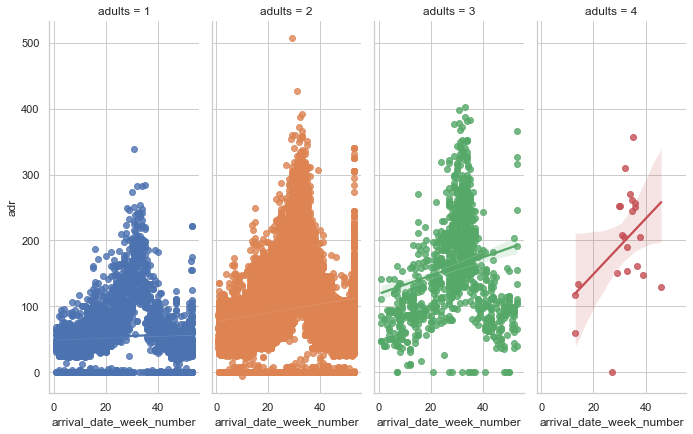

In [171]:
# Seaborn Lmplot 

# Refrences: http://seaborn.pydata.org/generated/seaborn.lmplot.html

g = sns.lmplot(x="arrival_date_week_number", y="adr", hue="adults",col="adults",
               data=resort_num_df, height=6, aspect=.4, x_jitter=.1)

####  Numerical associations and findings with Implots (City hotel)
We see there is higher spread with 2 adults in City Hotel bookings. The associations we see above are between the numerical variables are mostly in line with the average room rate, number of adults and time periods like months, weeks, or days of stay.

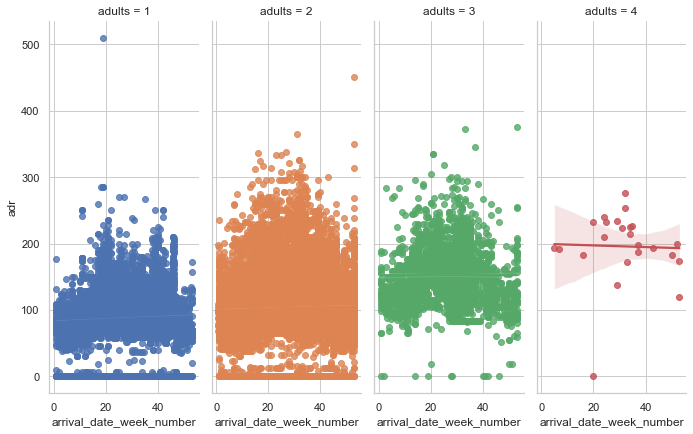

In [172]:
# Seaborn Lmplot 

# Refrences: http://seaborn.pydata.org/generated/seaborn.lmplot.html

h = sns.lmplot(x="arrival_date_week_number", y="adr", hue="adults",col="adults",
               data=city_num_df, height=6, aspect=.4, x_jitter=.1)

#### Final Observations

**(1)**

We tried to drop columns and separate the data frame by Resorts and City Hotels, and in doing so even then the numerical correlations where rather poor or showed no relationship. One of the challenges with dealing with this type of dataset are that most variables may come to us Categorical, Nominal, or continuous variables types.

**(2)**

In this analysis we took dependent variables to show relationships from the data set. The variables being categorical could mean in most cases a Bar plot could be used to analyse the count of Y axis variables, to draw robust and useful insights (as we did for Step 2)

**(3)**

Regarding the accuracy of relationships for each pair of the numerical variables from the dataset, the associations are showing either poor or no correlation among most variables except where average daily rates reveal the busiest month. As our main objective for this analysis is to analyse the busiest and most profitable  months, our variable defers to share the commonalities we expect to show from a numerical relationship. 

### 6.7 Domain question: Visualize the busiest months for Hotel bookings
The visualization will compare the busiest months based on hotel type, therefore I need to generate a new dataframe containing the data of both hotel types separated in different features. (transactions count)

##### Which month is most booked for the City Hotels?

In [173]:
df_city['arrival_date_month'].value_counts()

August       5381
July         4782
May          4579
June         4366
October      4337
September    4290
March        4072
April        4015
February     3064
November     2696
December     2392
January      2254
Name: arrival_date_month, dtype: int64

##### Which month is most booked for the Resort Hotels?

In [174]:
# Return the series containing the unique rows in the columns, 'arrival_date_month' DataFrame.

df_resort['arrival_date_month'].value_counts()

August       3257
July         3137
October      2577
March        2573
April        2550
May          2535
February     2308
September    2102
June         2038
December     2017
November     1976
January      1868
Name: arrival_date_month, dtype: int64

##### Calculating the booking rate for August from the given years in the dataframe

In [175]:
August_booking_perc = df_city['arrival_date_month'].value_counts(normalize=True)['August']
August_booking_perc

0.11640131522021285

##### Plot
We see that the busiest month is showing August from the given years for both Resort and City Hotels Dataset 

#### Plot Refrences: 

- Refrences: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html
- Refrences: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.figure.html#matplotlib.pyplot.figure

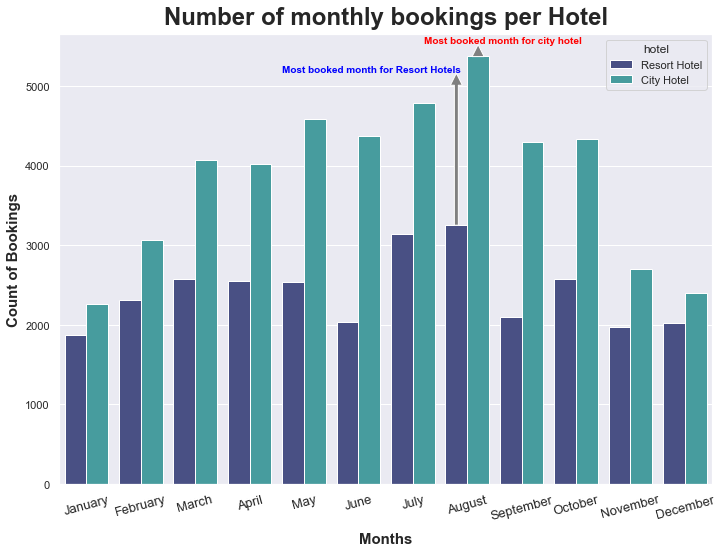

In [176]:
# Seaborn Countplot 

# Column 'arrival_date_month' plot based on categories

#Rearranging months
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Custom size plot

fig.set_size_inches(20, 15)

domain_plot = sns.set(style="darkgrid")
domain_plot = sns.countplot(x="arrival_date_month", data=confirmed_df, palette="mako",hue='hotel',order=Months_order)

domain_plot.annotate("", xy=(7.2, 5520), xytext=(7.2, 5370), arrowprops= dict(facecolor='gray'),annotation_clip=False);
plt.text(6.2, 5545, "Most booked month for city hotel", horizontalalignment='left', size='small', color='red', weight='bold');

domain_plot.annotate("", xy=(6.8, 5160), xytext=(6.8, 3250), arrowprops= dict(facecolor='gray'),annotation_clip=False);
plt.text(3.6, 5175, "Most booked month for Resort Hotels", horizontalalignment='left', size='small', color='blue', weight='bold');


plt.title('Number of monthly bookings per Hotel', weight='bold', fontsize=24,pad=10);

plt.xlabel('Months',labelpad=10, weight='bold',fontsize=15);
plt.ylabel('Count of Bookings', weight='bold',fontsize=15);

domain_plot.set_xticklabels(domain_plot.get_xticklabels(), fontsize=13, rotation=15);

### 6.8 Domain sub-question: Visualize the most profitable time of the year

#### Plot Refrences: 

- Refrences: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html
- Refrences: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.figure.html#matplotlib.pyplot.figure

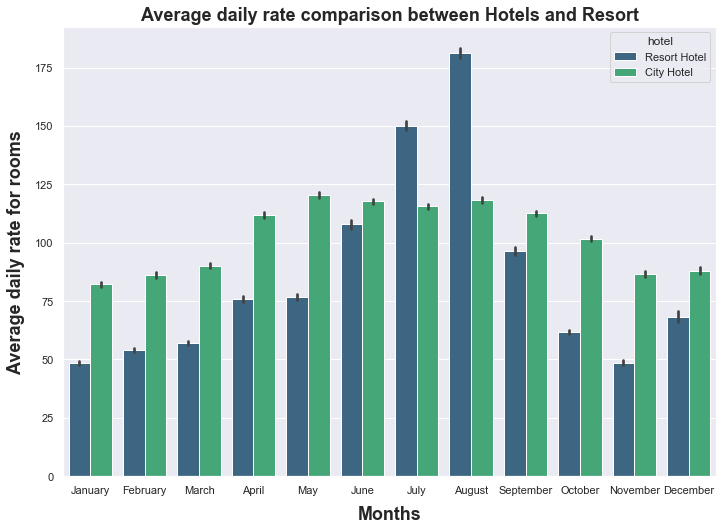

In [177]:
# Seaborn Barplot 

#Rearranging months
Months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Bar plot
sns.barplot(data=confirmed_df, x='arrival_date_month', y='adr', hue='hotel',palette=("viridis"),order=Months_order)

# Custom size plot
fig.set_size_inches(20, 15)

# Title for plot 
plt.title('Average daily rate comparison between Hotels and Resort', weight='bold', fontsize=18);

# label parameters for the plot
plt.xlabel('Months',labelpad=10, weight='bold',fontsize=18);
plt.ylabel('Average daily rate for rooms',labelpad=10, weight='bold',fontsize=18);

#### The average daily room rate variations in years visually for City Hotels
City hotels show a steady increase in room pricing and profitability year on year, also we see from the previous graphs that the city hotels may see marginal growth year on year. Whereas resort hotels we see in the plot shows a decline in year 2016 following a sizable increase the following year 2017, this level of fluctuation might suggest a percentage of uncertainty in projecting future average daily room rates increase.

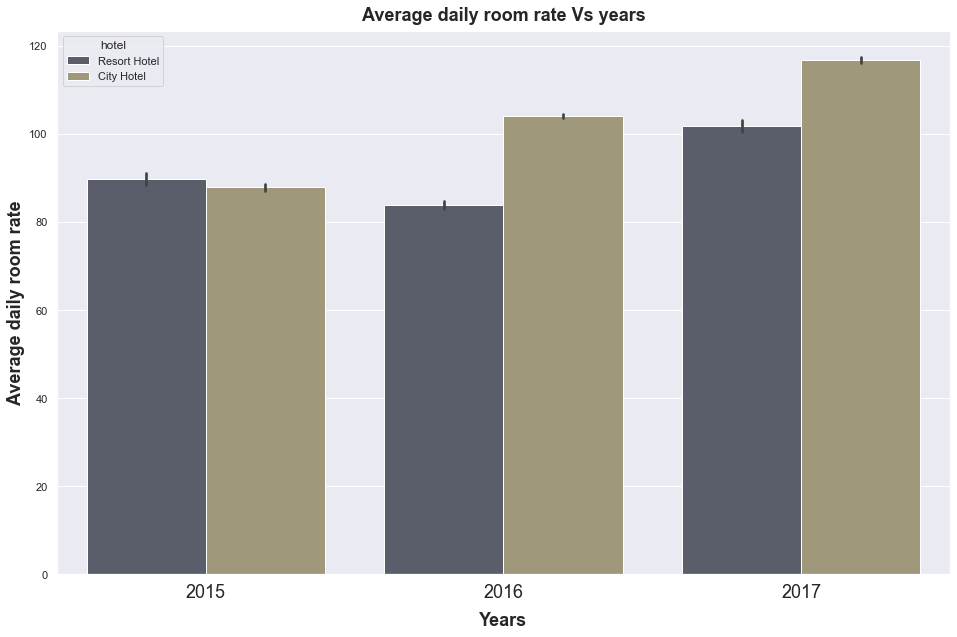

In [178]:
# Seaborn Bar Plot for years as x-axis to adr in y-axis to determine the yearly growth patterns in hotel industry. 

import seaborn as sns 

plt.figure(figsize=(16,10))

gx = sns.barplot(x='arrival_date_year',y='adr',data=confirmed_df,palette=("cividis"), hue = 'hotel')

plt.title('Average daily room rate Vs years', weight='bold', fontsize=18,pad=10);

plt.xlabel('Years',labelpad=10, weight='bold',fontsize=18);
plt.ylabel('Average daily room rate', weight='bold',fontsize=18);

gx.set_xticklabels(gx.get_xticklabels(), fontsize=18);

### 6.9 Answer to Domain question and sub-question

### 1. Busiest Month for hotel bookings (Domain question)

- From the exploratory data analysis, we discovered that the busiest booking months to be first and the highest to be August and second busiest month to be July for both Resort and City hotels. 

- This gives us the ability to have conversation with prospects on how best to marginalise on less busy months and increase preparations for the busy months mainly July and August. 


#### 2. The most profitable months for hotel bookings (Domain sub-question)

- The second domain issue we had was which month is the most profitable for hotels?

- From analysis we discovered the busiest months to be the following: 


#### I. Resort hotels: 

The highest daily rates were found around August. Whereas the other months fluctuated marginally with smaller daily room rates or these being quieter periods perhaps.

#### II. City hotels: 

We found the City Hotels to be the most profitable and stable group among the observed hotel types. City hotels showed the most profitable month being 'May' month. There is also steady scale in pricing between April - September months.

***


## Step 7: Identifying sub-groups
Kenny T.

Based on the current findings there is much to explore with in the dataset with some other variables that could show patterns or insights further.

### 7.1 Top 20 City Hotel bookings for 2017 by booking origin
- A sub group consisting of top 20 customer booking country origin with the higest 'adr' (average daily rate).
- It will be useful to conduct an analysis on common trends shared among  high performing City hotels, for the purposes of utility preparation ahead for the hotels busiest periods.

In [179]:
# Creating a dataset for Top 20 countries with the higest adr (average daily rate)

columns = df_city.filter(items=['hotel','country','arrival_date_month','arrival_date_year','adults','adr'])

year_2017 = columns[(columns.arrival_date_year == 2017)]

Top20 = year_2017.sort_values('adr', ascending=False)

Top20.head(20)

,hotel,country,arrival_date_month,arrival_date_year,adults,adr
111403,City Hotel,ITA,May,2017,1,510.00
118515,City Hotel,ESP,August,2017,3,372.33
115541,City Hotel,ROU,July,2017,2,338.00
110141,City Hotel,ESP,April,2017,2,336.00
112707,City Hotel,ECU,May,2017,3,335.00
112700,City Hotel,CHE,May,2017,3,335.00
114535,City Hotel,NLD,June,2017,2,333.67
118252,City Hotel,NOR,August,2017,2,326.50
118241,City Hotel,PRT,August,2017,2,326.50
110580,City Hotel,FRA,April,2017,2,324.50


### 7.2 Top 20 Resort Hotel bookings for 2017 by booking origin

In [180]:
# Creating a dataset for Top 20 country boookings for resorts with the higest adr (average daily rate) in 2017

columns = df_resort.filter(items=['hotel','country','arrival_date_month','arrival_date_year','adults','adr'])

year_2017 = columns[(columns.arrival_date_year == 2017)]

Top20 = year_2017.sort_values('adr', ascending=False)

Top20.head(20)

,hotel,country,arrival_date_month,arrival_date_year,adults,adr
39155,Resort Hotel,PRT,August,2017,2,426.25
39568,Resort Hotel,ESP,August,2017,3,402.00
39118,Resort Hotel,MAR,July,2017,3,397.38
39517,Resort Hotel,PRT,August,2017,2,392.00
39543,Resort Hotel,ESP,August,2017,3,388.00
39177,Resort Hotel,ESP,August,2017,2,387.00
39960,Resort Hotel,PRT,August,2017,3,383.00
39644,Resort Hotel,GBR,August,2017,3,382.00
38995,Resort Hotel,ESP,August,2017,3,378.00
38612,Resort Hotel,PRT,July,2017,3,377.00


#### From the above analysis we have identified a few subgroups based on:

1. The most hotel booked country and the months, specifically to explore and find patterns in the data that could later be utilised for industry operations in marketing key stake holders and how to allocate budgets according to seasons. 

2. We took the second data frame to find the average daily rate pricing for people with babies, to analyse and find trends in the dataset.

***



## Step 8: One-hot encoding

Alessia R.

One-hot encoding is used to transform huge amounts of categorical data in numerical variables 0 and 1 representing 'False' and 'True', much easier to plot and to work within machine learning. Also, with one-hot encoding we create new variables that still refer to the original meaning of the dataframe, maintaining therefore the categories almost intact.


##### Details
Because of our business case, we have reduced the original dataset to contain only 3 categorical variables:
- **'hotel'** is composed by only 2 unique values, therefore the encoding wouldn't bring any value
- **'is_canceled'** is a categorical data inasmuch binary, but because it already includes only numbers as 0 and 1 (equal to the result of encoding), it is not a good candidate to undego this process
- **'country'** instead presents numerous string unique values, therefore it is much suitable for encoding

### 8.1 Encode the dataset
Once again, we will use the 'confirmed_df' to generate from the previous Exploratory Data Analysis. This will ensure the encoding can reflect our business domain.

In [181]:
confirmed_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75166 entries, 0 to 119389
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   hotel                      75166 non-null  object 
 1   is_canceled                75166 non-null  object 
 2   country                    75166 non-null  object 
 3   arrival_date_week_number   75166 non-null  int64  
 4   arrival_date_day_of_month  75166 non-null  int64  
 5   stays_in_weekend_nights    75166 non-null  int64  
 6   stays_in_week_nights       75166 non-null  int64  
 7   adults                     75166 non-null  int64  
 8   children                   75166 non-null  int64  
 9   babies                     75166 non-null  int64  
 10  adr                        75166 non-null  float64
 11  arrival_date_month         75166 non-null  object 
 12  arrival_date_year          75166 non-null  object 
dtypes: float64(1), int64(7), object(5)
memory usa

In [182]:
confirmed_df['country'].unique()

array(['PRT', 'GBR', 'USA', 'ESP', 'IRL', 'FRA', 'N/A', 'ROU', 'NOR',
       'OMN', 'ARG', 'POL', 'DEU', 'BEL', 'CHE', 'CN', 'GRC', 'ITA',
       'NLD', 'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN',
       'MOZ', 'BWA', 'LUX', 'SVN', 'ALB', 'IND', 'CHN', 'MEX', 'MAR',
       'UKR', 'SMR', 'LVA', 'PRI', 'SRB', 'CHL', 'AUT', 'BLR', 'LTU',
       'TUR', 'ZAF', 'AGO', 'ISR', 'CYM', 'ZMB', 'CPV', 'ZWE', 'DZA',
       'KOR', 'CRI', 'HUN', 'JAM', 'HRV', 'IRN', 'CAF', 'CYP', 'NZL',
       'IDN', 'KAZ', 'THA', 'COL', 'DOM', 'MKD', 'MYS', 'NGA', 'VEN',
       'GIB', 'ARM', 'JPN', 'LKA', 'CUB', 'CMR', 'BIH', 'MUS', 'COM',
       'SUR', 'UGA', 'BGR', 'CIV', 'JOR', 'SYR', 'PHL', 'SGP', 'BDI',
       'URY', 'SAU', 'KWT', 'LBN', 'AND', 'VNM', 'AZE', 'PLW', 'ARE',
       'QAT', 'EGY', 'PER', 'SVK', 'MDV', 'MLT', 'MWI', 'ECU', 'MDG',
       'ISL', 'UZB', 'NPL', 'BHS', 'PAK', 'MAC', 'TGO', 'TWN', 'HKG',
       'DJI', 'GEO', 'TUN', 'STP', 'SEN', 'KNA', 'ETH', 'IRQ', 'RWA',
       'LIE', 'MMR', 

In [184]:
# One-Hot encoding on the 'country' column

confirmed_df_onehot = confirmed_df.copy()
confirmed_df_onehot = pd.get_dummies(confirmed_df_onehot, columns=['country'], prefix=['country'])

confirmed_df_onehot.head()

,hotel,is_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month,arrival_date_year,country_ABW,country_AGO,country_AIA,country_ALB,country_AND,country_ARE,country_ARG,country_ARM,country_ASM,country_ATA,country_ATF,country_AUS,country_AUT,country_AZE,country_BDI,country_BEL,country_BFA,country_BGD,country_BGR,country_BHR,country_BHS,country_BIH,country_BLR,country_BOL,country_BRA,country_BRB,country_BWA,country_CAF,country_CHE,country_CHL,country_CHN,country_CIV,country_CMR,country_CN,country_COL,country_COM,country_CPV,country_CRI,country_CUB,country_CYM,country_CYP,country_CZE,country_DEU,country_DJI,country_DMA,country_DNK,country_DOM,country_DZA,country_ECU,country_EGY,country_ESP,country_EST,country_ETH,country_FIN,country_FRA,country_FRO,country_GAB,country_GBR,country_GEO,country_GHA,country_GIB,country_GNB,country_GRC,country_GTM,country_GUY,country_HKG,country_HRV,country_HUN,country_IDN,country_IND,country_IRL,country_IRN,country_IRQ,country_ISL,country_ISR,country_ITA,country_JAM,country_JOR,country_JPN,country_KAZ,country_KEN,country_KIR,country_KNA,country_KOR,country_KWT,country_LAO,country_LBN,country_LBY,country_LCA,country_LIE,country_LKA,country_LTU,country_LUX,country_LVA,country_MAC,country_MAR,country_MCO,country_MDG,country_MDV,country_MEX,country_MKD,country_MLI,country_MLT,country_MMR,country_MNE,country_MOZ,country_MRT,country_MUS,country_MWI,country_MYS,country_N/A,country_NAM,country_NCL,country_NGA,country_NLD,country_NOR,country_NPL,country_NZL,country_OMN,country_PAK,country_PAN,country_PER,country_PHL,country_PLW,country_POL,country_PRI,country_PRT,country_PRY,country_PYF,country_QAT,country_ROU,country_RUS,country_RWA,country_SAU,country_SDN,country_SEN,country_SGP,country_SLE,country_SLV,country_SMR,country_SRB,country_STP,country_SUR,country_SVK,country_SVN,country_SWE,country_SYC,country_SYR,country_TGO,country_THA,country_TJK,country_TMP,country_TUN,country_TUR,country_TWN,country_TZA,country_UGA,country_UKR,country_URY,country_USA,country_UZB,country_VEN,country_VNM,country_ZAF,country_ZMB,country_ZWE
0,Resort Hotel,0,27,1,0,0,2,0,0,0.0,July,2015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Resort Hotel,0,27,1,0,0,2,0,0,0.0,July,2015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Resort Hotel,0,27,1,0,1,1,0,0,75.0,July,2015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Resort Hotel,0,27,1,0,1,1,0,0,75.0,July,2015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Resort Hotel,0,27,1,0,2,2,0,0,98.0,July,2015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

***




## Step 9: PCA


#### What is PCA? (Prabhakaran, 2019)

PCA is a quite simple dimensionality reduction technique that transforms the columns of a dataset into a new set features called Principal Components (PCs).

The information contained in each column is the amount of variance it contains. The primary objective of Principal Components is to represent the information in the dataset with minimum columns possible.

#### Why do we use PCA? (Prabhakaran, 2019)

In practice PCA is used for two reasons:

##### (1) Dimensionality Reduction:
The information distributed across a large number of columns is transformed into principal components (PC) such that the first few PCs can explain a sizeable chunk of the total information (variance). These PCs can be used as explanatory variables in Machine Learning models.
##### (2) Visualize Classes: 
Visualising the separation of classes (or clusters) is hard for data with more than 3 dimensions (features). With the first two PCs itself, it’s usually possible to see a clear separation.

### Use PCA to visualize Classes within our dataset
For the purpose of this assignment we are going to conduct **PCA with a concrete business problem in our mind**. Namely, we want to see which months are usually the most most busy for each of our two hotels. Our dataset contains data from three consecutive years: *2015, 2016, and 2017*.

##### Details
Considering the above, our **target variable** will be **month - 'arrival_date_month'** column. 

For our PCA we will choose only these variables that can help us to answer our business question. Therefore, the final dataframe for our PCA will contain the following variables:

    (1) is_canceled (int64)
    (2) arrival_date_month (object)
    (3) arrival_date_week_number (int64)
    (4) arrival_date_day_of_month (int64)
    (5) stays_in_weekend_nights (int64)
    (6) stays_in_week_nights (int64)
    (7) adults (int64)
    (8) Children (int64)
    (9) Babies (int64)
    (10) adr (float64)

The above dataset of variables contains both, numerical and categorical variables, and NOTE that we have only one continous variable which is adr (average daily rate).

Our categorical variable is actually our target veriable so before conducting PCA we are going to separate this variable from the numerical features. 

##### Datesets preparation

Before we proceed with PCA, we have to extract the 10 variables listed above from the dataframe. 

As per business domain, we are in need of separating the 2 hotel types our original dataframe is built upon, in fact during the Exploratory Data Analysis we discovered there is much difference between the distribution of data of both Resort and City hotels. 

We will recycle the same datasets used before, and will drop the columns not needed.

### 9.1 Data preparation (Resort hotel)

#### Drop unnecessary information
We will drop the variables that we do not need by using .drop() function from Pandas, and using the remainig variables we will create a new dataframe called new_df_H1.

In [185]:
df_resort.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28938 entries, 0 to 40059
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   hotel                      28938 non-null  object 
 1   is_canceled                28938 non-null  object 
 2   country                    28938 non-null  object 
 3   arrival_date_week_number   28938 non-null  int64  
 4   arrival_date_day_of_month  28938 non-null  int64  
 5   stays_in_weekend_nights    28938 non-null  int64  
 6   stays_in_week_nights       28938 non-null  int64  
 7   adults                     28938 non-null  int64  
 8   children                   28938 non-null  int64  
 9   babies                     28938 non-null  int64  
 10  adr                        28938 non-null  float64
 11  arrival_date_month         28938 non-null  object 
 12  arrival_date_year          28938 non-null  object 
dtypes: float64(1), int64(7), object(5)
memory usag

In [186]:
df_H1 = domain_df[domain_df['hotel'] == 'Resort Hotel']
df_H1

,hotel,is_canceled,country,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month,arrival_date_year
0,Resort Hotel,0,PRT,27,1,0,0,2,0,0,0.00,July,2015
1,Resort Hotel,0,PRT,27,1,0,0,2,0,0,0.00,July,2015
2,Resort Hotel,0,GBR,27,1,0,1,1,0,0,75.00,July,2015
3,Resort Hotel,0,GBR,27,1,0,1,1,0,0,75.00,July,2015
4,Resort Hotel,0,GBR,27,1,0,2,2,0,0,98.00,July,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,Resort Hotel,0,GBR,35,31,2,8,2,1,0,89.75,August,2017
40056,Resort Hotel,0,IRL,35,30,2,9,2,0,0,202.27,August,2017
40057,Resort Hotel,0,IRL,35,29,4,10,2,0,0,153.57,August,2017
40058,Resort Hotel,0,GBR,35,31,4,10,2,0,0,112.80,August,2017


In [187]:
new_df_H1 = df_H1.drop(['hotel','arrival_date_year', 'country'], axis=1)
new_df_H1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40060 entries, 0 to 40059
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   is_canceled                40060 non-null  object 
 1   arrival_date_week_number   40060 non-null  int64  
 2   arrival_date_day_of_month  40060 non-null  int64  
 3   stays_in_weekend_nights    40060 non-null  int64  
 4   stays_in_week_nights       40060 non-null  int64  
 5   adults                     40060 non-null  int64  
 6   children                   40060 non-null  int64  
 7   babies                     40060 non-null  int64  
 8   adr                        40060 non-null  float64
 9   arrival_date_month         40060 non-null  object 
dtypes: float64(1), int64(7), object(2)
memory usage: 3.4+ MB


In [188]:
new_df_H1.shape

(40060, 10)

So, our new_df_H1 has 10 columns and 40060 records.

#### Clean dataset  (Resort hotel)
Before we move any further, we are going just to make sure that there are no NULL values in our dataset.

In [189]:
new_df_H1.isnull().sum()

is_canceled                  0
arrival_date_week_number     0
arrival_date_day_of_month    0
stays_in_weekend_nights      0
stays_in_week_nights         0
adults                       0
children                     0
babies                       0
adr                          0
arrival_date_month           0
dtype: int64

#### Adjust dataset for PCA  (Resort hotel)
As arrival_date_month is our target variable we have to separate it from the numerical features before conducting PCA. To do so we will use .drop() function.

In [190]:
pca_new_H1 = new_df_H1.drop(['arrival_date_month'], axis=1)
pca_new_H1.head()

,is_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr
0,0,27,1,0,0,2,0,0,0.0
1,0,27,1,0,0,2,0,0,0.0
2,0,27,1,0,1,1,0,0,75.0
3,0,27,1,0,1,1,0,0,75.0
4,0,27,1,0,2,2,0,0,98.0


In [191]:
pca_new_H1.shape

(40060, 9)

### 9.2  PCA exploration  (Resort hotel)
Before we proceed with PCA we want to see if there is correlation between any variables in the above dataframe. One way of doing this is to create a heatmap.

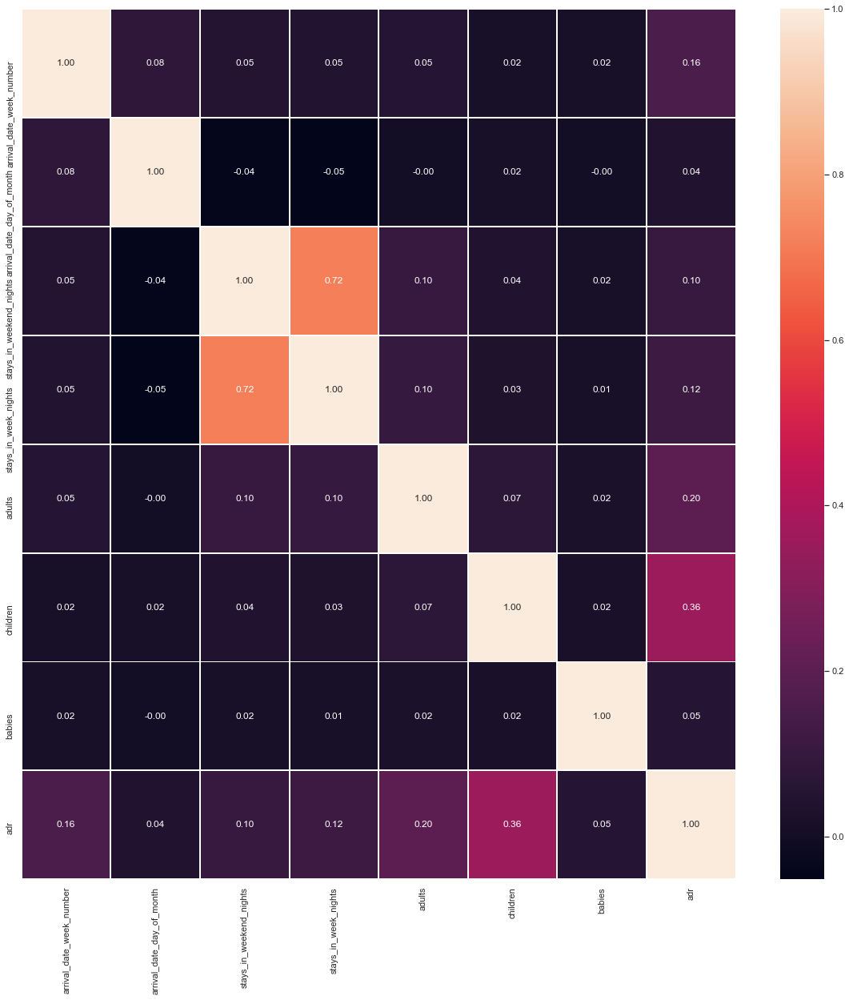

In [193]:
# Seaborn Correlation plot 

fig, ax = plt.subplots(figsize=(20,20))  
sns.heatmap(pca_new_H1.corr(), annot=True, fmt='.2f', linewidths=1, ax=ax)

On the above heatmap we can see that there is very little or no correlation between the majority of our features. We can see only two features that have moderate correlation (represented by the orange squares). This means that for sure we will need more than 2 components to explain our target variable.
But at this stage this is only our assumption. we will see more after we conduct PCA.

So, there are 9 variables in our pca_new_H1 dataset. Only 1 out of these 9 is continous. The other 8 variables is descrete. PCA gives the best results on continous variables. With the majority of descrete type of variables our results will not be as impresive as in the books. Nevertheless, let's proceed with our PCA.

As PCA is affected by the scale, we need to scale our features. 

We will use StandardScaler() to help us standardize the dataset’s features onto unit scale (mean = 0 and variance = 1) which is a requirement for the optimal performance of many machine learning algorithms. 

In [194]:
pca_H1 = StandardScaler().fit_transform(pca_new_H1)
pca_H1

array([[-0.61995075, -0.01005791, -1.6683831 , ..., -0.2890498 ,
        -0.11684507, -1.54541631],
       [-0.61995075, -0.01005791, -1.6683831 , ..., -0.2890498 ,
        -0.11684507, -1.54541631],
       [-0.61995075, -0.01005791, -1.6683831 , ..., -0.2890498 ,
        -0.11684507, -0.32474599],
       ...,
       [-0.61995075,  0.5611558 ,  1.48349333, ..., -0.2890498 ,
        -0.11684507,  0.95402824],
       [-0.61995075,  0.5611558 ,  1.70862736, ..., -0.2890498 ,
        -0.11684507,  0.29047186],
       [-0.61995075,  0.5611558 ,  1.70862736, ..., -0.2890498 ,
        -0.11684507,  0.06684505]])

In [195]:
pca_H1.shape

(40060, 9)

We have to check whether the normalized data has a mean of zero and a standard deviation of one.

In [196]:
np.mean(pca_H1), np.std(pca_H1)

(2.0535461548289355e-17, 0.9999999999999998)

Both results are good enough.

### 9.3 PCA Projection to 2D  (Resort hotel)

In this section, we will try to project this 9 dimensional dataset into 2 dimensions.

Before we move any further - a bit of theory.

Principal components are new variables that are constructed as linear combinations or mixtures of the initial variables. These combinations are done in such a way that the new variables, called principal components, are uncorrelated and most of the information within the initial variables is squeezed or compressed into the first components (Jaadi, 2020). However, in our case this task might be difficult as almost all of our variables have no correlation with each other from the very start so all of them might be essential to explain the target variable.

So theory is as follows: our 9-dimensional data gives us 9 principal components, but PCA tries to put maximum possible information in the first component, then maximum remaining information in the second and so on. If our dataset was perfect, organizing information in principal components, would allow us to reduce dimensionality without losing much information, and this by discarding the components with low information and considering the remaining components as our new variables. 

Important to NOTE is that the principal components (PCs) are less interpretable and don’t have any real meaning since they are constructed as linear combinations of the initial variables.
So, after dimensionality reduction, there isn’t a particular meaning assigned to each principal component. The new components are just the two main dimensions of variation.

So, let's try to reduce our 9-dimensions to 2 dimensions. We will do this using sklearn.decomposition.PCA from scikit-learn library.

In [197]:
pca_H1 = PCA(n_components=2)
principalComponents = pca_H1.fit_transform(pca_new_H1)
pcDf_H1 = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2'])

In [198]:
pcDf_H1.head()

,PC1,PC2
0,-94.994985,2.327376
1,-94.994985,2.327376
2,-20.048665,-0.525226
3,-20.048665,-0.525226
4,2.941206,-1.395849


In [199]:
pcDf_H1.shape

(40060, 2)

##### Plot PCA graph
So now our 9-dimensions is reduced into 2-dimensions. Next, we will try to plot this 2 dimensional data.

First, we will have to concatenate our target variable with the 2-dimensional dataframe above.

In [200]:
finalDf_H1 = pd.concat([pcDf_H1, new_df_H1['arrival_date_month']], axis = 1)
finalDf_H1.head()

,PC1,PC2,arrival_date_month
0,-94.994985,2.327376,July
1,-94.994985,2.327376,July
2,-20.048665,-0.525226,July
3,-20.048665,-0.525226,July
4,2.941206,-1.395849,July


In [201]:
finalDf_H1.shape

(40060, 3)

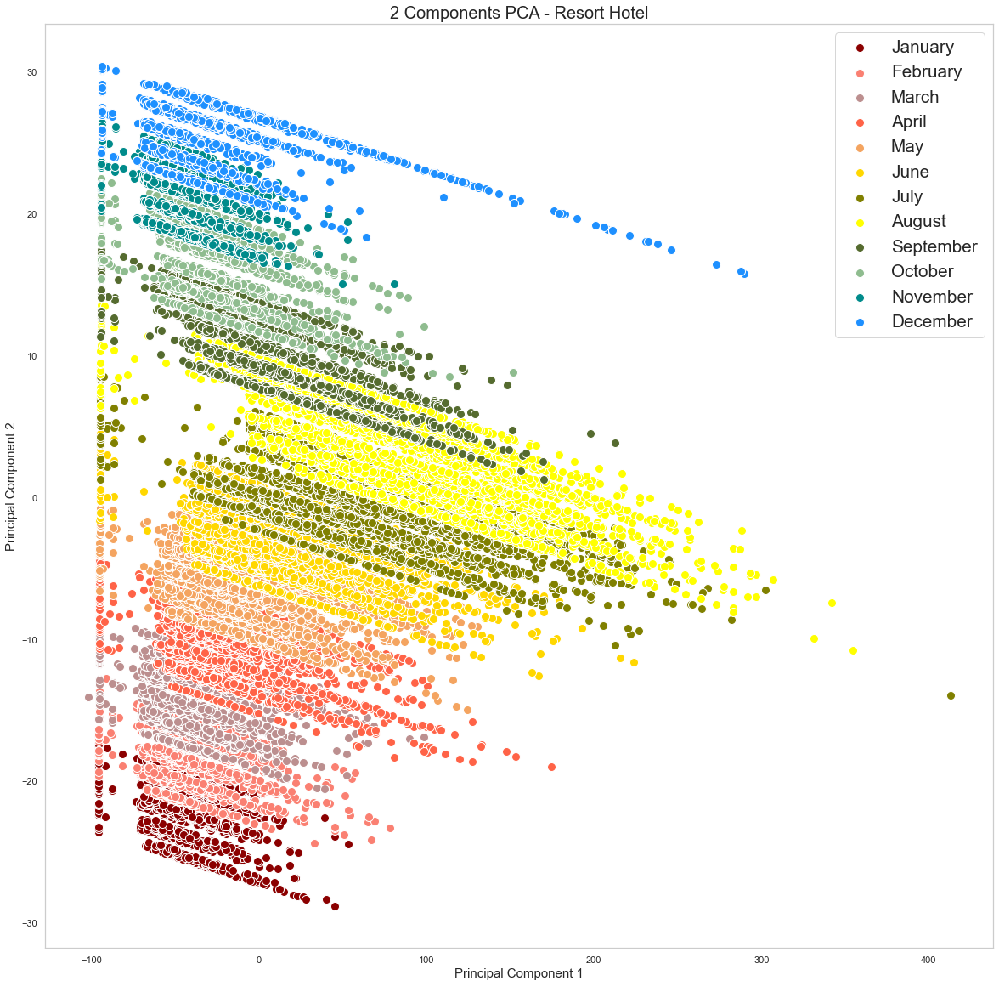

In [202]:
# First, we want to determine the size of our 2D figure
fig = plt.figure(figsize = (20,20))

# Then, we design our plot
sns.set_style('whitegrid')
pca_h1 = fig.add_subplot(1,1,1)

# Naming the lables on axis
pca_h1.set_xlabel('Principal Component 1', fontsize = 15)
pca_h1.set_ylabel('Principal Component 2', fontsize = 15)
pca_h1.set_title('2 Components PCA - Resort Hotel', fontsize = 20)

# defining our targets and their colors
targets = ['January', 'February', 'March', 'April', 'May', 'June',
           'July', 'August', 'September', 'October', 'November', 'December']

colors = ['darkred','salmon','rosybrown','tomato','sandybrown','gold','olive','yellow',
          'darkolivegreen','darkseagreen','darkcyan','dodgerblue']

for target, color in zip(targets,colors):
    indicesToKeep = finalDf_H1['arrival_date_month'] == target
    pca_h1.scatter(finalDf_H1.loc[indicesToKeep, 'PC1'], finalDf_H1.loc[indicesToKeep, 'PC2'], 
               c=color, s = 100, edgecolors='w')
    
pca_h1.legend(targets,fontsize='xx-large', loc='best')
pca_h1.grid()

On the above 2D projection we can see a few things. First, data from the Resort Hotel are grouped in 12 clusters that seem to overlap but only with the cluster directly next to them. Second, it seems that the largest amont of data is concentrated around the month August (yellow). The other 2 months that seem busy but not as much as August are July (olive) and June (gold). This is actually in line with or findings from EDA.

This might be much better visible in 3D projection. But before we move there, we want to know explained variance ratio.

##### Explained Variance 

(Data Camp, 2020)
Once we have the principal components, we can find the explained variance ratio. It will give us the amount of information or variance that each PC has when projecting the data to a lower dimensional subspace. By definition, when using PCA, we want to reduce the number of variables to a minimum, but in the same time we don't want to lose too much information. 

explained_variance_ratio_ help us to see how much variance each of our PCs holds and if the cumulative percentage is too small it means that we have to increase the number of the principal components to reach at least the total of 90-95%.

In [203]:
print('Explained variation per principal component: {}'.format(pca_H1.explained_variance_ratio_))

Explained variation per principal component: [0.9315109  0.04723995]


From the above output we can see that PC1 holds only 93.2% of information while PC2 holds only 4.7%.
Also, the other point to note is that while projecting 9-dimensional data to a 2-dimensional data, only 2.1% of information was lost.

We could stop here because our score met the main purpose for conducting PCA, but we want to see how our dataset's prodejection would look like when described by 3 dimensions.

### 9.4 PCA Projection to 3D  (Resort hotel)

In [204]:
pca_H1 = PCA(n_components=3)
principalComponents = pca_H1.fit_transform(pca_new_H1)
pcDf_H1 = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2', 'PC3'])

In [205]:
pcDf_H1.head()

,PC1,PC2,PC3
0,-94.994985,2.327376,-14.404813
1,-94.994985,2.327376,-14.404813
2,-20.048665,-0.525226,-14.653779
3,-20.048665,-0.525226,-14.653779
4,2.941206,-1.395849,-14.744205


In [206]:
finalDf_H1 = pd.concat([pcDf_H1, new_df_H1['arrival_date_month']], axis = 1)
finalDf_H1.head()

,PC1,PC2,PC3,arrival_date_month
0,-94.994985,2.327376,-14.404813,July
1,-94.994985,2.327376,-14.404813,July
2,-20.048665,-0.525226,-14.653779,July
3,-20.048665,-0.525226,-14.653779,July
4,2.941206,-1.395849,-14.744205,July


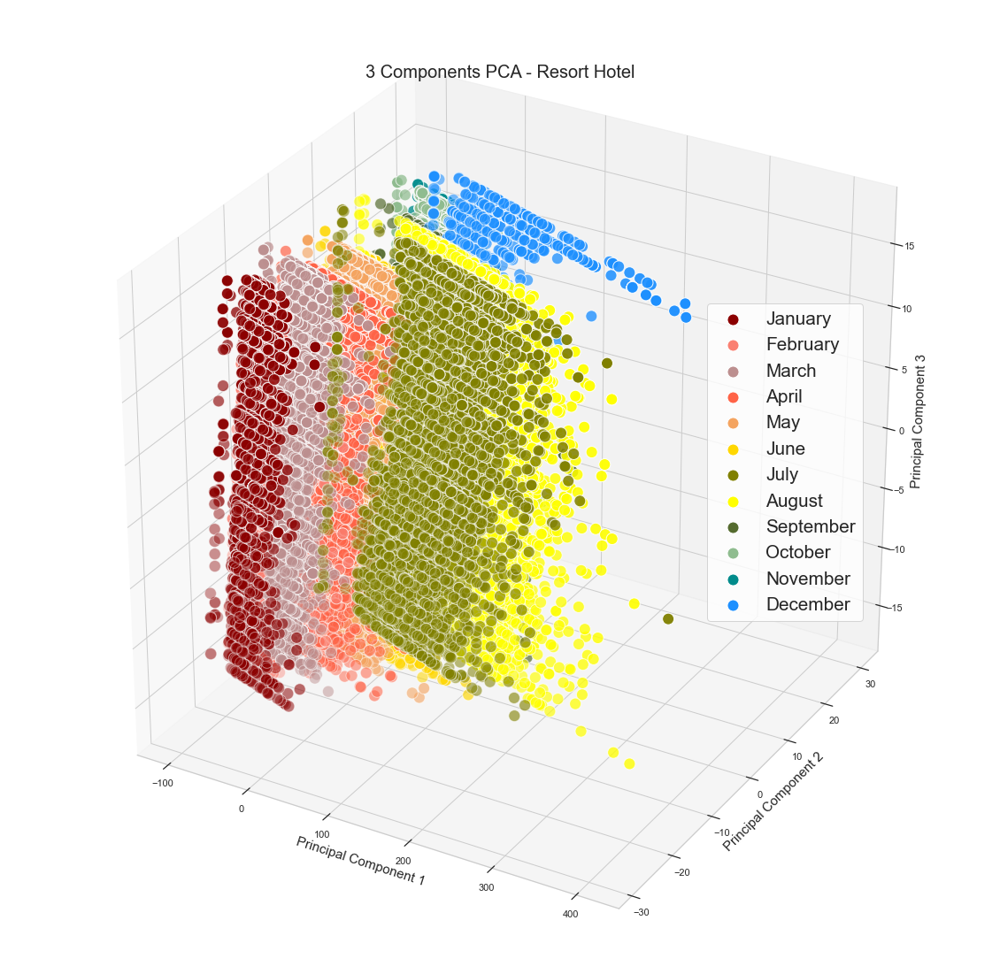

In [208]:
# Define the parameters for 3D plot

fig = plt.figure(figsize=(20, 20))
pca_3d_h1 = fig.add_subplot(111, projection='3d')

# Naming the lables on axis
pca_3d_h1.set_xlabel('Principal Component 1', fontsize = 15)
pca_3d_h1.set_ylabel('Principal Component 2', fontsize = 15)
pca_3d_h1.set_zlabel('Principal Component 3', fontsize = 15)
pca_3d_h1.set_title('3 Components PCA - Resort Hotel', fontsize = 20)

# defining our targets and their colors
targets = ['January', 'February', 'March', 'April', 'May', 'June',
           'July', 'August', 'September', 'October', 'November', 'December']

colors = ['darkred','salmon','rosybrown','tomato','sandybrown','gold','olive','yellow',
          'darkolivegreen','darkseagreen','darkcyan','dodgerblue']

for target, color in zip(targets,colors):
    indicesToKeep = finalDf_H1['arrival_date_month'] == target
    pca_3d_h1.scatter(finalDf_H1.loc[indicesToKeep, 'PC1'], finalDf_H1.loc[indicesToKeep, 'PC2'],
               finalDf_H1.loc[indicesToKeep, 'PC3'], c=color, s = 170, edgecolors='w')
    
pca_3d_h1.legend(targets, fontsize='xx-large', loc='best', bbox_to_anchor=(0.7, 0.7))
pca_3d_h1.grid()

Three dimensional scatter plot clearly show that August (yellow) and July (olive) are the most busiest months. We also can see that data are separated in clusters. Now, let's see how much more information our 3 PCs hold.

In [209]:
print('Explained variation per principal component: {}'.format(pca_H1.explained_variance_ratio_))

Explained variation per principal component: [0.9315109  0.04723995 0.01925501]


From the above output we can see that PC1 holds 93.2% of information, PC2 holds 4.7% of information, and PC3 holds only 1.9%.

And like earlier, the other point to note is that while projecting 9-dimensional data to a 3-dimensional data, we further reduced the amount of lost information to 0.2%. 

### 9.5 Some quick ways to check the number of Principal Components

An essential part of using PCA in practice is the ability to estimate the number of components needed to describe the data. The usual goal of PCA is to reduce the number of dimensions to a number that contains at least 90-95% of the information contained in the original dataset.
#### (1)
We can determine the number of principal components by looking at the cumulative explained_variance_ratio_ as a function of the number of components (VanderPlas, 2020):

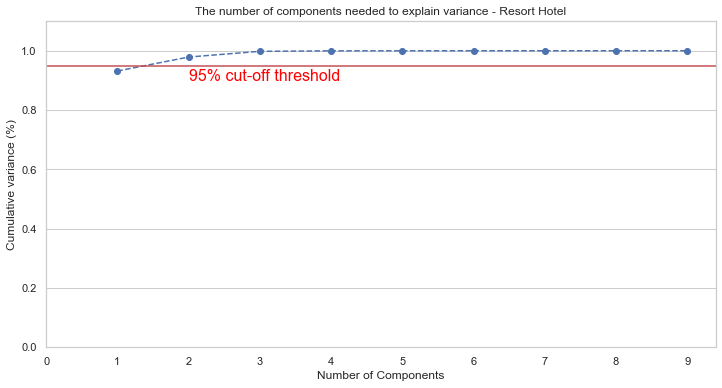

In [210]:
pca_H1_95 = PCA().fit(pca_new_H1)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()

xi = np.arange(1, 10, step=1)
y = np.cumsum(pca_H1_95.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 10, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance - Resort Hotel')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(2.0, 0.90, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

**(2)**

Another quick way to check the number of principal component that can give us 95% of explained variance is to run PCA that will reduce the original dataframe only to the number of compnents that can explain 95% of the variance (see below).

In [211]:
pca_H1_95 = PCA(n_components=0.95)
principalComponents = pca_H1_95.fit_transform(pca_new_H1)

In [212]:
pcDf_H1 = pd.DataFrame(data = principalComponents)
pcDf_H1.head()

,0,1
0,-94.994985,2.327376
1,-94.994985,2.327376
2,-20.048665,-0.525226
3,-20.048665,-0.525226
4,2.941206,-1.395849


In [213]:
pcDf_H1.shape

(40060, 2)

So, after running only 4 lines of code above we learned that 2 PCs would be enough to explain our target variable.

**(3) Explained_Variance Table (Gouda, 2019)**

Below we have included explained_variance table that can be another way of determining how many components is needed.

In [214]:
pca=PCA()  
pca.n_components=9  
pca_data=pca.fit_transform(pca_new_H1)

# look at explainded variance of PCA components 
exp_var_cumsum=pd.Series(np.round(pca.explained_variance_ratio_.cumsum(),4)*100)

for index,var in enumerate(exp_var_cumsum):  
    print('if n_components= %d,   variance=%f' %(index,np.round(var,3)))

if n_components= 0,   variance=93.150000
if n_components= 1,   variance=97.880000
if n_components= 2,   variance=99.800000
if n_components= 3,   variance=99.970000
if n_components= 4,   variance=99.980000
if n_components= 5,   variance=99.990000
if n_components= 6,   variance=100.000000
if n_components= 7,   variance=100.000000
if n_components= 8,   variance=100.000000


**(4) Scree Plot**

A scree plot is like a bar chart and it shows the size of each of the principal components. It helps us visualize the percentage of variation captured by each of the principal components (Kindson The Genius, 2019). 

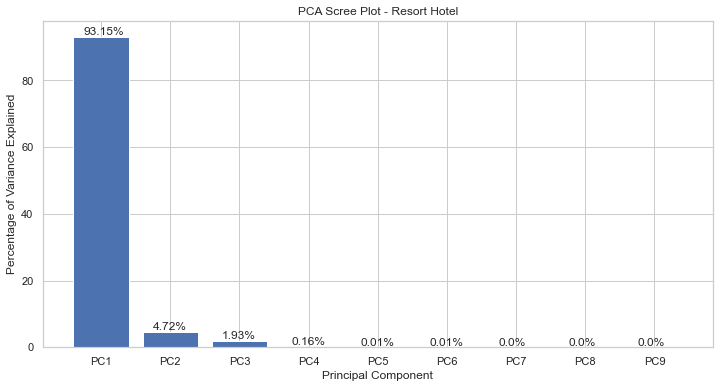

In [215]:
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9']
plt.bar(x= range(1,10), height=percent_variance, tick_label=columns)
plt.ylabel('Percentage of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot - Resort Hotel')

y=percent_variance
for i, v in enumerate(y):
    xlocs=[i+1 for i in range(0,10)]
    plt.text(xlocs[i] - 0.25, v + 0.5, str(v)+'%')
    
plt.show()

In the next part of this analysis we will repeat all the steps using City Hotel dataset.

### 9.6 Data Preparation (City hotel)
Similarly as the previously analysed datased, the city hotel dataframe contains data from three consecutive years: 2015, 2016, and 2017.

Rememebering our business problem we are going to extract the following variables for our PCA:

    (1) is_canceled (int64)
    (2) arrival_date_month (object)
    (3) arrival_date_week_number (int64)
    (4) arrival_date_day_of_month (int64)
    (5) stays_in_weekend_nights (int64)
    (6) stays_in_week_nights (int64)
    (7) adults (int64)
    (8) Children (int64)
    (9) Babies (int64)
    (10) adr (float64)
    
Our categorical variable is actually our target veriable so before conducting PCA we are going to separate this variable from the numerical features. 

But before we do this, we have to extract the 10 variables listed above from the main dataset.

We will use the same method as previously and we will call our new dataframe new_df_H2.

In [217]:
df_H2 = domain_df[domain_df['hotel'] == 'City Hotel']
df_H2

,hotel,is_canceled,country,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month,arrival_date_year
40060,City Hotel,0,PRT,27,1,0,2,1,0,0,0.00,July,2015
40061,City Hotel,1,PRT,27,1,0,4,2,0,0,76.50,July,2015
40062,City Hotel,1,PRT,27,1,0,4,1,0,0,68.00,July,2015
40063,City Hotel,1,PRT,27,1,2,4,2,0,0,76.50,July,2015
40064,City Hotel,1,PRT,27,2,0,2,2,0,0,76.50,July,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,BEL,35,30,2,5,2,0,0,96.14,August,2017
119386,City Hotel,0,FRA,35,31,2,5,3,0,0,225.43,August,2017
119387,City Hotel,0,DEU,35,31,2,5,2,0,0,157.71,August,2017
119388,City Hotel,0,GBR,35,31,2,5,2,0,0,104.40,August,2017


In [218]:
new_df_H2 = df_H2.drop(['hotel','arrival_date_year', 'country'], axis=1)
new_df_H2

,is_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month
40060,0,27,1,0,2,1,0,0,0.00,July
40061,1,27,1,0,4,2,0,0,76.50,July
40062,1,27,1,0,4,1,0,0,68.00,July
40063,1,27,1,2,4,2,0,0,76.50,July
40064,1,27,2,0,2,2,0,0,76.50,July
...,...,...,...,...,...,...,...,...,...,...
119385,0,35,30,2,5,2,0,0,96.14,August
119386,0,35,31,2,5,3,0,0,225.43,August
119387,0,35,31,2,5,2,0,0,157.71,August
119388,0,35,31,2,5,2,0,0,104.40,August


To avoid unnecessary problem when concatenating PC's dataframe with our target variable we will reset indexing for our dataframe. We will do this by using Pandas function .reset_index() and argument drop=True to avoid adding the column with an old index.

In [219]:
new_df_H2 = new_df_H2.reset_index(drop=True)
new_df_H2

,is_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,arrival_date_month
0,0,27,1,0,2,1,0,0,0.00,July
1,1,27,1,0,4,2,0,0,76.50,July
2,1,27,1,0,4,1,0,0,68.00,July
3,1,27,1,2,4,2,0,0,76.50,July
4,1,27,2,0,2,2,0,0,76.50,July
...,...,...,...,...,...,...,...,...,...,...
79325,0,35,30,2,5,2,0,0,96.14,August
79326,0,35,31,2,5,3,0,0,225.43,August
79327,0,35,31,2,5,2,0,0,157.71,August
79328,0,35,31,2,5,2,0,0,104.40,August


Our new_df_H2 has 10 columns and 79330 records.

#### Clean dataset  (City hotel)
Before we move any further, we are going just to make sure that there are no NULL values in our dataset.

In [220]:
new_df_H2.isnull().sum()

is_canceled                  0
arrival_date_week_number     0
arrival_date_day_of_month    0
stays_in_weekend_nights      0
stays_in_week_nights         0
adults                       0
children                     0
babies                       0
adr                          0
arrival_date_month           0
dtype: int64

#### Adjust dataset  for PCA (City hotel)
As arrival_date_month is our target variable we have to separate it from the numerical features before conducting PCA.
To do so we will use .drop() function.

In [221]:
pca_new_H2 = new_df_H2.drop(['arrival_date_month'], axis=1)
pca_new_H2

,is_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr
0,0,27,1,0,2,1,0,0,0.00
1,1,27,1,0,4,2,0,0,76.50
2,1,27,1,0,4,1,0,0,68.00
3,1,27,1,2,4,2,0,0,76.50
4,1,27,2,0,2,2,0,0,76.50
...,...,...,...,...,...,...,...,...,...
79325,0,35,30,2,5,2,0,0,96.14
79326,0,35,31,2,5,3,0,0,225.43
79327,0,35,31,2,5,2,0,0,157.71
79328,0,35,31,2,5,2,0,0,104.40


### 9.7  PCA exporation (City hotel)
Before we proceed with PCA we want to see if there is correlation between any variables in the above dataframe. One way of doing this is to create a heatmap. 

We also want to see if there are differences in results between two hotels.

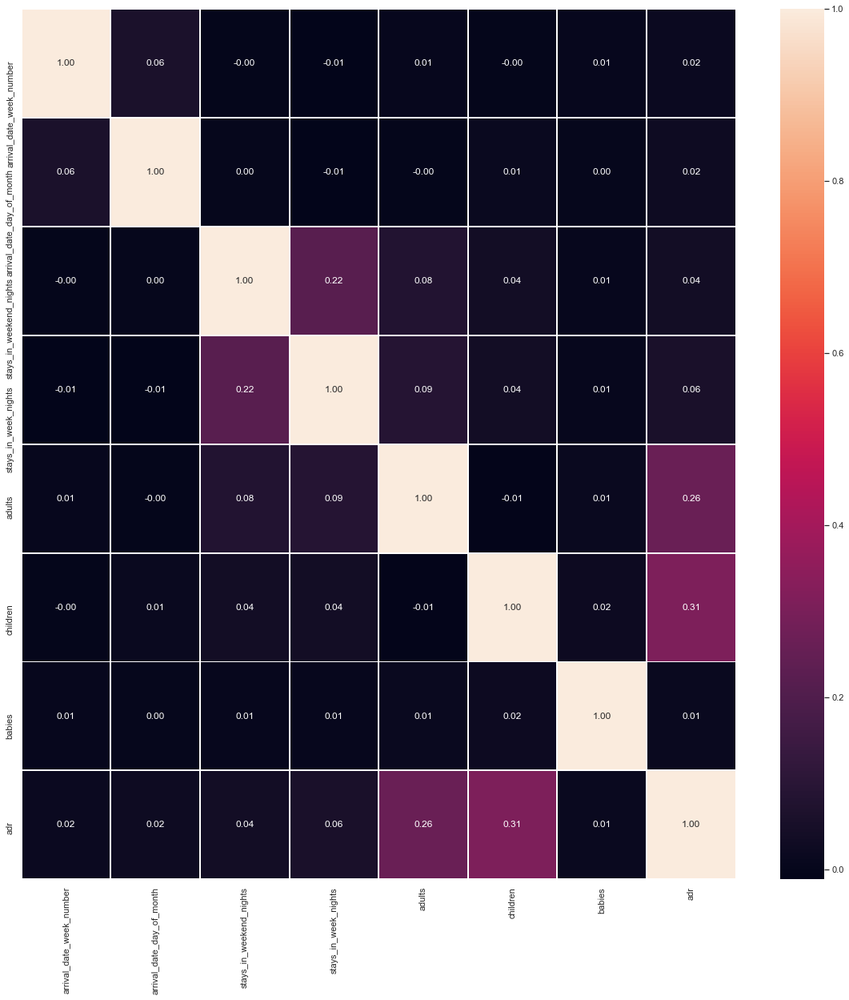

In [222]:
fig, ax = plt.subplots(figsize=(20,20))  
sns.heatmap(pca_new_H2.corr(), annot=True, fmt='.2f', linewidths=1, ax=ax)

We can see clearly that there is difference between two hotels in relation to the correlation results. While in the Resort Hotel results we could see 2 variables that were moderately correlated, here none of the selected variables correlate with each other.

Let's what else is different.

As mentioned earlier, PCA is affected by the scale, so we have to scale our features.

We will use StandardScaler() to help us standardize the dataset’s features onto unit scale (mean = 0 and variance = 1) which is a requirement for the optimal performance of many machine learning algorithms.

In [223]:
pca_H2 = StandardScaler().fit_transform(pca_new_H2)
pca_H2

array([[-0.84620301, -0.01324398, -1.69408289, ..., -0.24549598,
        -0.0586008 , -2.41509164],
       [ 1.18174952, -0.01324398, -1.69408289, ..., -0.24549598,
        -0.0586008 , -0.66061228],
       [ 1.18174952, -0.01324398, -1.69408289, ..., -0.24549598,
        -0.0586008 , -0.85555443],
       ...,
       [-0.84620301,  0.58384053,  1.74297492, ..., -0.24549598,
        -0.0586008 ,  1.20188795],
       [-0.84620301,  0.58384053,  1.74297492, ..., -0.24549598,
        -0.0586008 , -0.02074334],
       [-0.84620301,  0.58384053,  1.51383773, ..., -0.24549598,
        -0.0586008 ,  1.0525852 ]])

In [224]:
pca_H2.shape

(79330, 9)

We have to check whether the normalized data has a mean of zero and a standard deviation of one.

In [225]:
np.mean(pca_H2), np.std(pca_H2)

(1.5604731426696318e-17, 1.0)

It seems that it is.

### 9.8 PCA Projection to 2D (City hotel)

In this section, we will try to project this 9-dimensional dataset into 2-dimensions.

We will do this using sklearn.decomposition.PCA from scikit-learn library.

In [226]:
pca_H2 = PCA(n_components=2)
princComp = pca_H2.fit_transform(pca_new_H2)
pcDf_H2 = pd.DataFrame(data = princComp, columns = ['PC1', 'PC2'])

In [227]:
pcDf_H2

,PC1,PC2
0,-105.379101,0.543128
1,-28.875417,1.018247
2,-37.378147,0.965752
3,-28.873913,1.018485
4,-28.874220,0.947190
...,...,...
79325,-9.040558,-8.835192
79326,120.252343,-8.104678
79327,52.531985,-8.523321
79328,-0.775880,-8.852929


So now our 9-dimensions is reduced into 2-dimensions. Next, we will try to plot this 2 dimensional data.

##### Plot PCA graph

First, we will have to concatenate our target variable with the 2-dimensional dataframe above.

In [228]:
finalDf_H2 = pd.concat([pcDf_H2, new_df_H2['arrival_date_month']], axis=1)
finalDf_H2

,PC1,PC2,arrival_date_month
0,-105.379101,0.543128,July
1,-28.875417,1.018247,July
2,-37.378147,0.965752,July
3,-28.873913,1.018485,July
4,-28.874220,0.947190,July
...,...,...,...
79325,-9.040558,-8.835192,August
79326,120.252343,-8.104678,August
79327,52.531985,-8.523321,August
79328,-0.775880,-8.852929,August


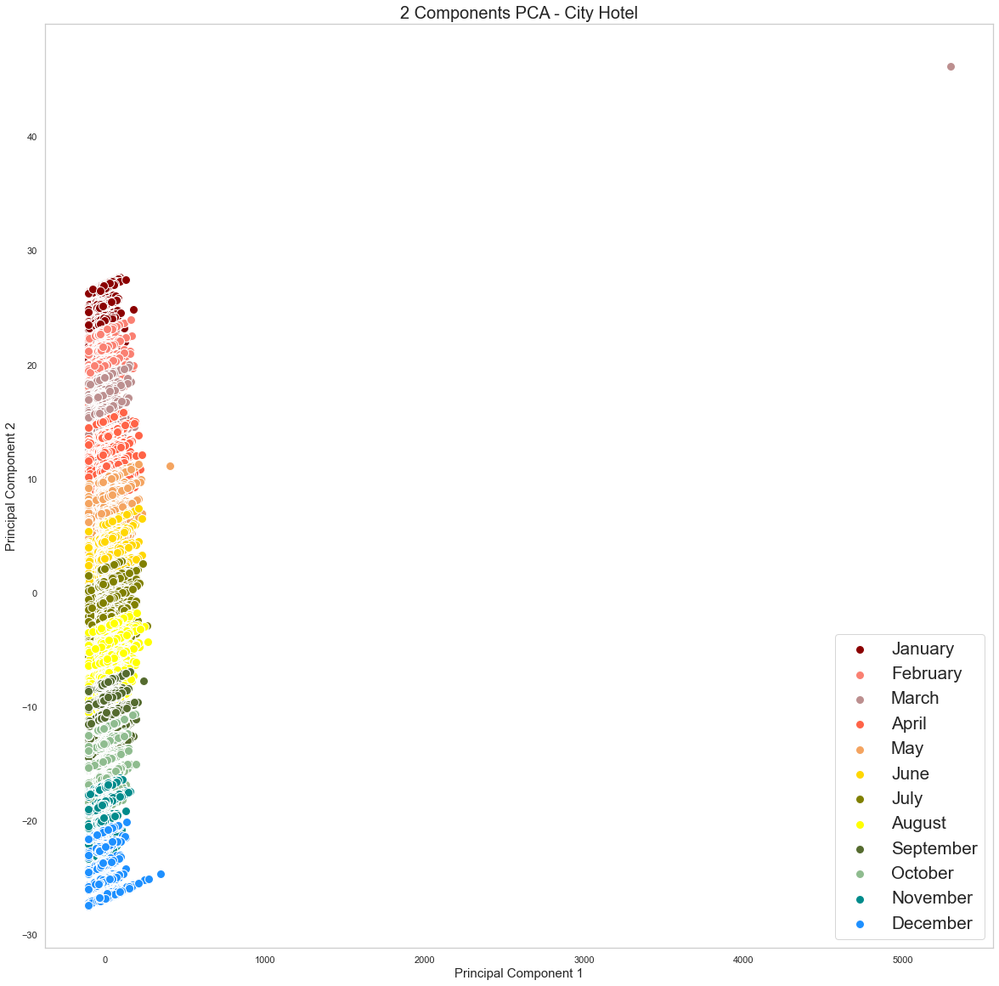

In [230]:
# 2D plot

# First, we want to determine the size of our 2D figure
fig = plt.figure(figsize = (20,20))

# Then, we design our plot

ax = fig.add_subplot(1,1,1)

# Naming the lables on axis
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Components PCA - City Hotel', fontsize = 20)

# defining our targets and their colors
targets = ['January', 'February', 'March', 'April', 'May', 'June',
           'July', 'August', 'September', 'October', 'November', 'December']

colors = ['darkred','salmon','rosybrown','tomato','sandybrown','gold','olive','yellow',
          'darkolivegreen','darkseagreen','darkcyan','dodgerblue']

for target, color in zip(targets,colors):
    indicesToKeep = finalDf_H2['arrival_date_month'] == target
    ax.scatter(finalDf_H2.loc[indicesToKeep, 'PC1'], finalDf_H2.loc[indicesToKeep, 'PC2'], 
               c=color, s = 100, edgecolors='w')
    
ax.legend(targets,fontsize='xx-large', loc='best')
ax.grid()

On this scatter plot we can see that each month is almost equally busy. There is also one outlier related to March data, which make it difficult to see the actual pattern. What we can say for sure is that each cluster of data overlap the next to it. Also, while the data from the Resort Hotel clearly indicated which months are the busisest, here data related to all months are almost equally distributed. In addition, because of one outlier we see this visualisation in a very small scale. If this outlier wasn't there we would be able to see more clearly a distribution of each cluster. This might be much better visible in 3D projection. 

As this outlier was bothering us, we have decided to check which record is actually causing the problem and if it affects any other part of our analysis.
This is what we have found:

![image.png](attachment:image.png)

So, within the 79330 records there is one where adr value is insereted incorrectly. It seems that instead of 54.00, the value of 5400 was inserted. To make sure that our assumptions are correct we selected two other records from the same dataset that had similar characteristics. We can see that the average rate for the room category 'A' during the week days was in March 2016 between 40 and 57.73 if 2 adults were staying in the room.

To be on safe side, in our EDA we have concentrated mainly on our business question thus we acknowledged that there were 'cancelled' bookings in our dataset but they were not taken into consideration when we were looking at the months that are busy. 

For our PCA we took all bookings into consideration (including the cancelled one) as we wanted to see the clusters distribution, and thanks to that we actually found the reason for our strange statistics related to numerical data. As this is only one record which actually related to canelled booking we decided to remove it from the dataset. First, however, we will check the mean.

In [231]:
pca_new_H2['adr'].mean()

105.3044653977023

In [232]:
pca_new_H2[8455:8456]

,is_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr
8455,1,13,25,0,1,2,0,0,5400.0


In [233]:
pca_new_H2=pca_new_H2.drop([8455])

In [234]:
pca_new_H2['adr'].mean()

105.23772189236882

So, mean didn't change much after replacemen, which is actually good. Let's see how our 2D projection will look right now. We will repeat all the necessary steps.
First, we will check the shape of our updated dataframe.

In [235]:
pca_new_H2.shape

(79329, 9)

Next, we have to scale our data for PCA.

In [236]:
pca_H2 = StandardScaler().fit_transform(pca_new_H2)
pca_H2

array([[-0.84619023, -0.01325733, -1.6940708 , ..., -0.24549762,
        -0.05860117, -2.67491685],
       [ 1.18176737, -0.01325733, -1.6940708 , ..., -0.24549762,
        -0.05860117, -0.73045117],
       [ 1.18176737, -0.01325733, -1.6940708 , ..., -0.24549762,
        -0.05860117, -0.94650291],
       ...,
       [-0.84619023,  0.58382763,  1.74298948, ..., -0.24549762,
        -0.05860117,  1.33373261],
       [-0.84619023,  0.58382763,  1.74298948, ..., -0.24549762,
        -0.05860117, -0.02129309],
       [-0.84619023,  0.58382763,  1.51385213, ..., -0.24549762,
        -0.05860117,  1.16826239]])

Then we will check if the mean is 0 and sd=1

In [237]:
np.mean(pca_H2), np.std(pca_H2)

(1.4012588530048854e-17, 0.9999999999999999)

It is close enough, so now we will proceed with PCA.
Now, we are going to reduce our 9-dimensions to 2-dimensions.

In [238]:
pca_H2 = PCA(n_components=2)
princComp = pca_H2.fit_transform(pca_new_H2)
pcDf_H2 = pd.DataFrame(data = princComp, columns = ['PC1', 'PC2'])

In [239]:
pcDf_H2

,PC1,PC2
0,-105.322751,0.304691
1,-28.819374,0.952471
2,-37.322586,0.880738
3,-28.817458,0.952751
4,-28.818355,0.881422
...,...,...
79324,-8.943330,-8.853302
79325,120.347819,-7.831082
79326,52.628464,-8.402492
79327,-0.678064,-8.852303


Next, we are adding our target variable.

In [240]:
finalDf_H2 = pd.concat([pcDf_H2, new_df_H2['arrival_date_month']], axis=1)
finalDf_H2

,PC1,PC2,arrival_date_month
0,-105.322751,0.304691,July
1,-28.819374,0.952471,July
2,-37.322586,0.880738,July
3,-28.817458,0.952751,July
4,-28.818355,0.881422,July
...,...,...,...
79325,120.347819,-7.831082,August
79326,52.628464,-8.402492,August
79327,-0.678064,-8.852303,August
79328,46.112065,-8.317676,August


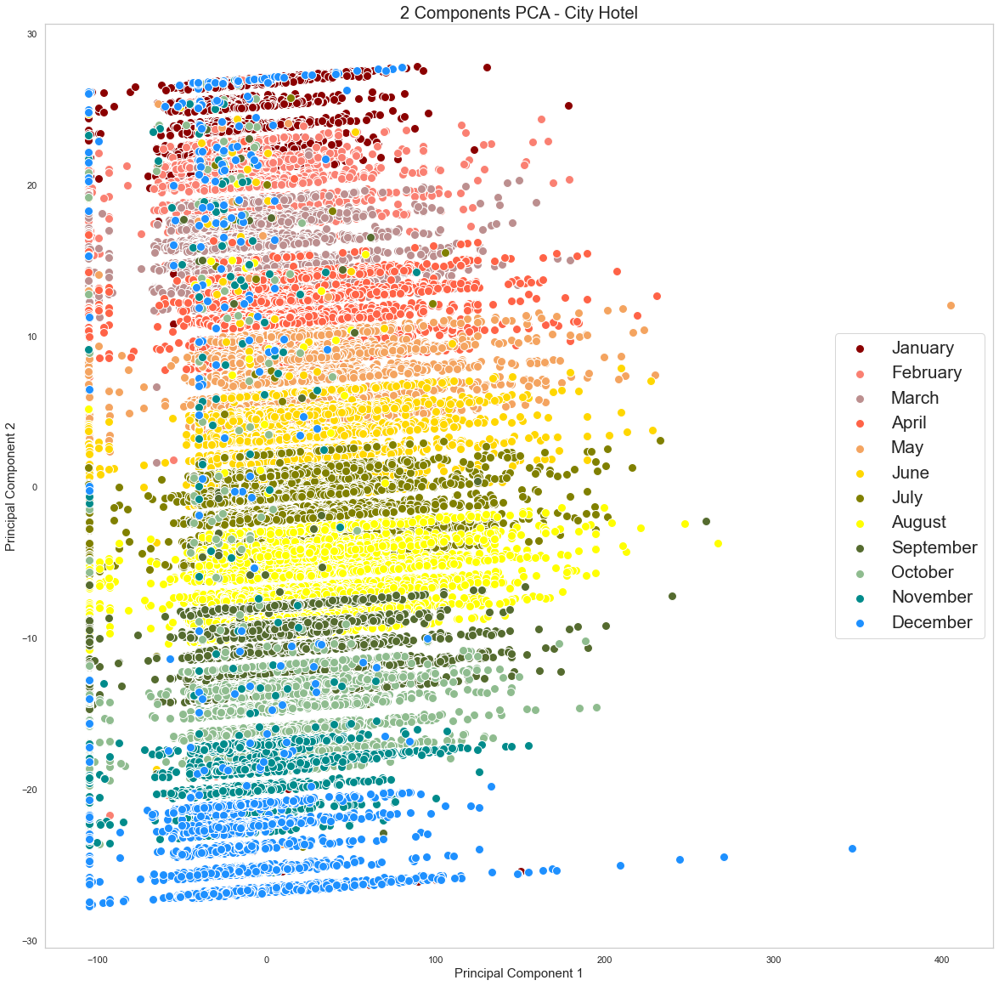

In [242]:
# 2D Plot

# First, we want to determine the size of our 2D figure
fig = plt.figure(figsize = (20,20))

# Then, we design our plot

ax = fig.add_subplot(1,1,1)

# Naming the lables on axis
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Components PCA - City Hotel', fontsize = 20)

# defining our targets and their colors
targets = ['January', 'February', 'March', 'April', 'May', 'June',
           'July', 'August', 'September', 'October', 'November', 'December']

colors = ['darkred','salmon','rosybrown','tomato','sandybrown','gold','olive','yellow',
          'darkolivegreen','darkseagreen','darkcyan','dodgerblue']

for target, color in zip(targets,colors):
    indicesToKeep = finalDf_H2['arrival_date_month'] == target
    ax.scatter(finalDf_H2.loc[indicesToKeep, 'PC1'], finalDf_H2.loc[indicesToKeep, 'PC2'], 
               c=color, s = 100, edgecolors='w')
    
ax.legend(targets,fontsize='xx-large', loc='best')
ax.grid()

As we can see the difference is huge. Now we can clearly see all the clusters. They seem a bit more messy than for the Resort Hotel but still the pattern is clear. The City Hotel is busy all year around. However, there are about 3 to 4 months where more data seems to be clustered. These are: May, June, July, August. It is close to the findings from our EDA analysis.

Before we move to 3D projection, we want to know explained variance ratio.

In [243]:
print('Explained variation per principal component: {}'.format(pca_H2.explained_variance_ratio_))

Explained variation per principal component: [0.85663712 0.09956493]


**From the above output we can see that PC1 holds only 85.66% of information while PC2 holds only 9.96%.**
So, while projecting 9-dimensional data to a 2-dimensional data, we lost 4.38% of information. 

We hit our target of 95% so we could stop here, but we want to see how our dataset's prodjection would look like when described by 3 dimensions.

### 9.9 PCA Projection to 3D (City hotel)

In [244]:
pca_H2 = PCA(n_components=3)
principalComponents = pca_H2.fit_transform(pca_new_H2)
pcDf_H2 = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2', 'PC3'])

In [245]:
pcDf_H2.head()

,PC1,PC2,PC3
0,-105.322751,0.304691,-14.187671
1,-28.819374,0.952471,-14.592814
2,-37.322586,0.880738,-14.547826
3,-28.817458,0.952751,-14.592950
4,-28.818355,0.881422,-13.590945


In [246]:
finalDf_H2 = pd.concat([pcDf_H2, new_df_H2['arrival_date_month']], axis = 1)

In [247]:
finalDf_H2.head()

,PC1,PC2,PC3,arrival_date_month
0,-105.322751,0.304691,-14.187671,July
1,-28.819374,0.952471,-14.592814,July
2,-37.322586,0.880738,-14.547826,July
3,-28.817458,0.952751,-14.592950,July
4,-28.818355,0.881422,-13.590945,July


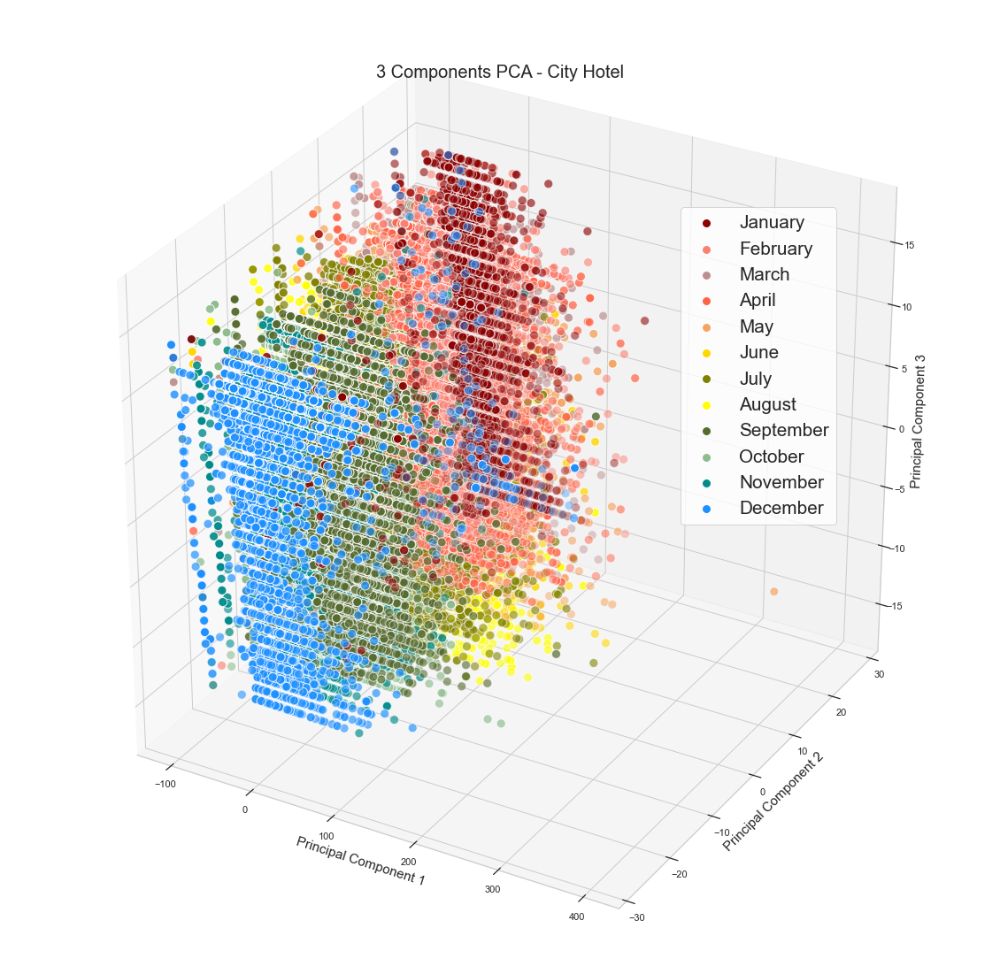

In [248]:
# Define the parameters for 3D plot

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Naming the lables on axis
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_zlabel('Principal Component 3', fontsize = 15)
ax.set_title('3 Components PCA - City Hotel', fontsize = 20)

# defining our targets and their colors
targets = ['January', 'February', 'March', 'April', 'May', 'June',
           'July', 'August', 'September', 'October', 'November', 'December']

colors = ['darkred','salmon','rosybrown','tomato','sandybrown','gold','olive','yellow',
          'darkolivegreen','darkseagreen','darkcyan','dodgerblue']

for target, color in zip(targets,colors):
    indicesToKeep = finalDf_H2['arrival_date_month'] == target
    ax.scatter(finalDf_H2.loc[indicesToKeep, 'PC1'], finalDf_H2.loc[indicesToKeep, 'PC2'],
               finalDf_H2.loc[indicesToKeep, 'PC3'], c=color, s = 100, edgecolors='w')
    
ax.legend(targets, fontsize='xx-large', loc='best', bbox_to_anchor=(0.85, 0.8))
ax.grid()

Three dimensional scatter plot clearly show that all months seem to be more less the same busy. We also can see that data are separated in less organised clusters then for the Resort Hotel. Now, let's see how much more information our 3 PCs hold.

In [249]:
print('Explained variation per principal component: {}'.format(pca_H2.explained_variance_ratio_))

Explained variation per principal component: [0.85663712 0.09956493 0.04185944]


**From the above output we can see that PC1 holds 85.66% of information, PC2 holds 9.96% of information, and PC3 holds only 4.19%.**

And like earlier, the other point to note is that while projecting 9-dimensional data to a 3-dimensional data, we further reduced the amount of lost information to 0.19%.

So, although a distribution of variation per principal component in both, Resort Hotel and City Hotel PCA is different, in both cases when using 3 compnent only approximately 0.2% of information is lost.

### 9.10 Some quick ways to check the number of Principal Components

In this section, similarly as during the earlier analysis wy are going to conduct 4 quick ways to determine the number of PC components.

**(1) The cumulative explained_variance_ratio_ as a function of the number of components**

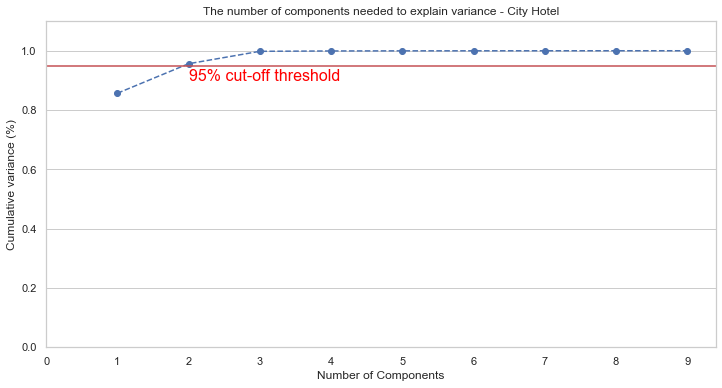

In [250]:
pca_H2_95 = PCA().fit(pca_new_H2)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()

xi = np.arange(1, 10, step=1)
y = np.cumsum(pca_H2_95.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 10, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance - City Hotel')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(2.0, 0.90, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

**(2) 95% n_components PCA**

In [251]:
pca_H2_95 = PCA(n_components=0.95)
principalComponents = pca_H2_95.fit_transform(pca_new_H2)

In [252]:
pcDf_H2 = pd.DataFrame(data = principalComponents)
pcDf_H2.head()

,0,1
0,-105.322751,0.304691
1,-28.819374,0.952471
2,-37.322586,0.880738
3,-28.817458,0.952751
4,-28.818355,0.881422


**(3) Explained_Variance Table (Gouda, 2019)**

In [253]:
pca=PCA()  
pca.n_components=9  
pca_data=pca.fit_transform(pca_new_H2)

# look at explainded variance of PCA components 
exp_var_cumsum=pd.Series(np.round(pca.explained_variance_ratio_.cumsum(),4)*100)

for index,var in enumerate(exp_var_cumsum):  
    print('if n_components= %d,   variance=%f' %(index,np.round(var,3)))

if n_components= 0,   variance=85.660000
if n_components= 1,   variance=95.620000
if n_components= 2,   variance=99.810000
if n_components= 3,   variance=99.930000
if n_components= 4,   variance=99.970000
if n_components= 5,   variance=99.980000
if n_components= 6,   variance=99.990000
if n_components= 7,   variance=100.000000
if n_components= 8,   variance=100.000000


**(4) Scree Plot**

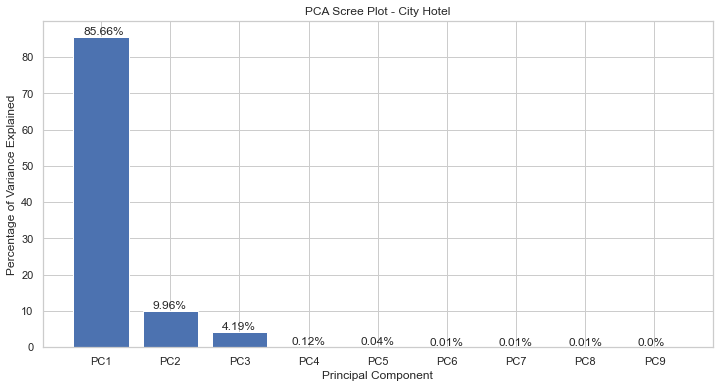

In [254]:
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9']
plt.bar(x= range(1,10), height=percent_variance, tick_label=columns)
plt.ylabel('Percentage of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot - City Hotel')

y=percent_variance
for i, v in enumerate(y):
    xlocs=[i+1 for i in range(0,10)]
    plt.text(xlocs[i] - 0.25, v + 0.5, str(v)+'%')

plt.show()

# Appendix

### From step 5: Scatterplot visualizations

#### Some Graphs rejected due to poor correlation and further explanation
 
 The two graphs below are typical of many plots on the pairplot, horizontal or vertical bands
 This can mean that the variables are constants or that we are looking at a comparison between 
 categorical variables which may not be suited to correlation or regression
 
 http://www.unige.ch/ses/sococ/cl//stat/action/diagscat.html?

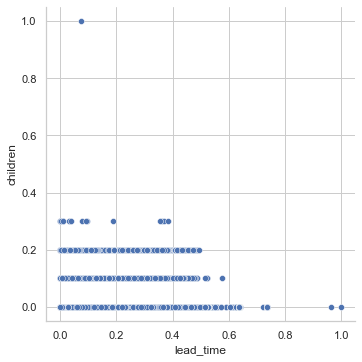

In [262]:
# Seaborn relplot

sns.relplot(x='lead_time',y='children',data=df_num1)

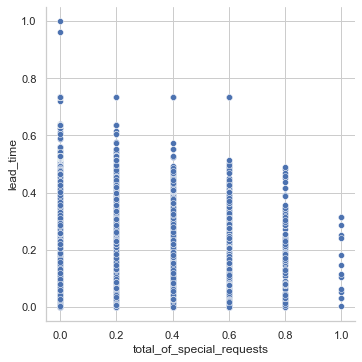

In [263]:
# Seaborn relplot

sns.relplot(x='total_of_special_requests',y='lead_time',data=df_num1)

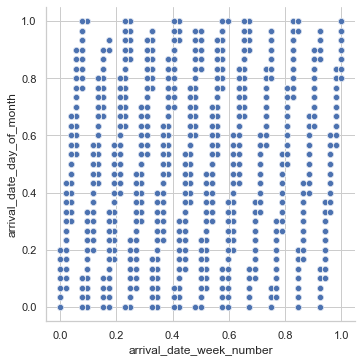

In [257]:
# Seaborn relplot

sns.relplot(x='arrival_date_week_number',y='arrival_date_day_of_month',data=df_num1)

The mosaic pattern is confusing to the eye and as this is comparing constants, this may simply
indicate these features, compared are not good candidates for investigating correlation

#### Some graphs rejected due to poor correlation but otherwise initially visually interesting

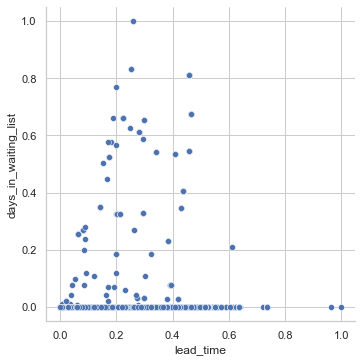

In [258]:
# Seaborn relplot

sns.relplot(x='lead_time',y='days_in_waiting_list',data=df_num1)

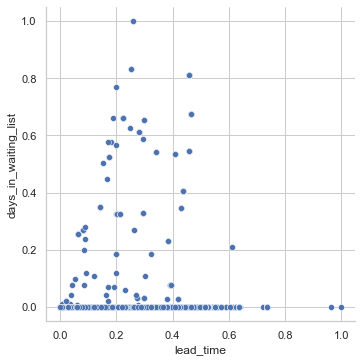

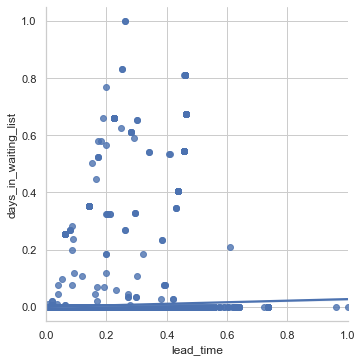

In [264]:
# Seaborn relplot
# Seaborn lmplot

sns.relplot(x='lead_time',y='days_in_waiting_list',data=df_num1)
sns.lmplot(x='lead_time',y='days_in_waiting_list',data=df_num1)

At a glance on pairplot this plot seemed like it might demonstrate some linearity but it is
confused by the overlay of a dense horizontal constant-like pattern low on the Y axis and
outliers and loosely correlated points. The line that can be drawn is not revealing and
these features do not numerically exhibit correlation

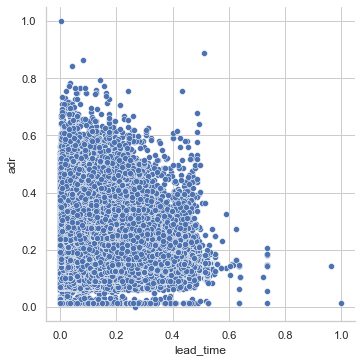

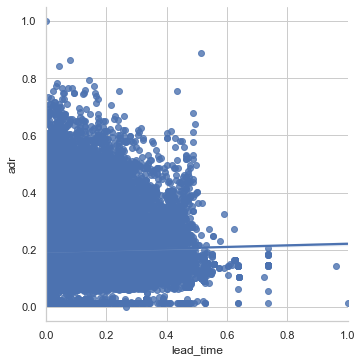

In [260]:
# Seaborn relplot
# Seaborn lmplot

sns.relplot(x='lead_time',y='adr',data=df_num1)
sns.lmplot(x='lead_time',y='adr',data=df_num1)

This plot looked interesting from a glance at the pairplot however on closer inspection it 
appears it may partly show a non-linear relationship between the two features, there is high
density, overplotting, outliers and the two features are not numerically well correlated
so any non-linear relationship is difficult to precisely identify

#### Note
All other subplots from the pairplot were rejected due to loosely clustered datapoints, constants or constants combined with outliers or the above or difficulty of establishing a relationship or generally low correlational relationships

Text(0.5, 1.0, 'adr vs adults: resort hotel')

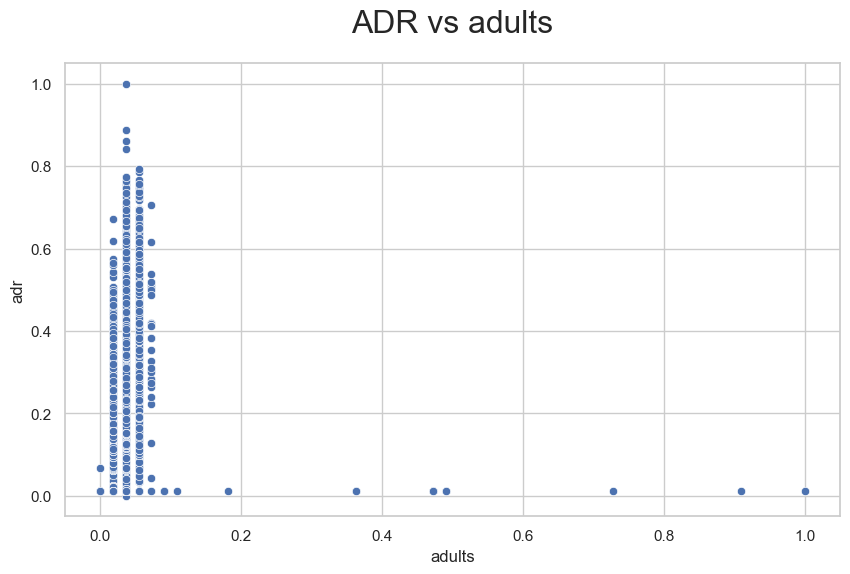

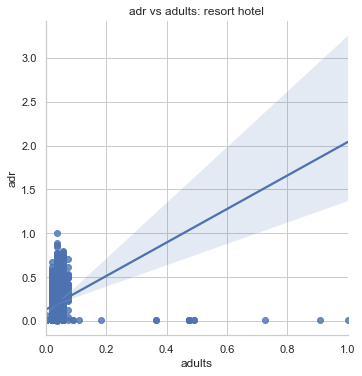

In [265]:
# Seaborn relplot
# Seaborn Scatterplot

x = df_num1['adults']
y = df_num1['adr']


fig, scatter = plt.subplots(figsize = (10,6), dpi = 100)
scatter = sns.scatterplot(x = x, y =y, data=df_num2 )
scatter.set_title('ADR vs adults', fontsize = 23, y =1.05);

sns.lmplot(x='adults',y='adr',data=df_num1)
ax = plt.gca()
ax.set_title('adr vs adults: resort hotel')

### From Step 6: Exploratory data analysis

In [266]:
# outlier adr value 
pd.set_option('max_columns', None)
df.loc[48515:48517]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
48515,City Hotel,1,35,2016,March,13,25,0,1,2,0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,1,Non Refund,12,0,Transient,5400.0,0,0,Canceled,2016-02-19
48516,City Hotel,1,37,2016,March,13,25,0,1,2,1,0,BB,ESP,Online TA,TA/TO,0,0,0,A,A,1,No Deposit,9,0,Transient,143.1,0,1,Canceled,2016-02-20
48517,City Hotel,1,41,2016,March,13,25,0,2,3,0,0,BB,ESP,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9,0,Transient,159.3,0,0,Canceled,2016-02-14


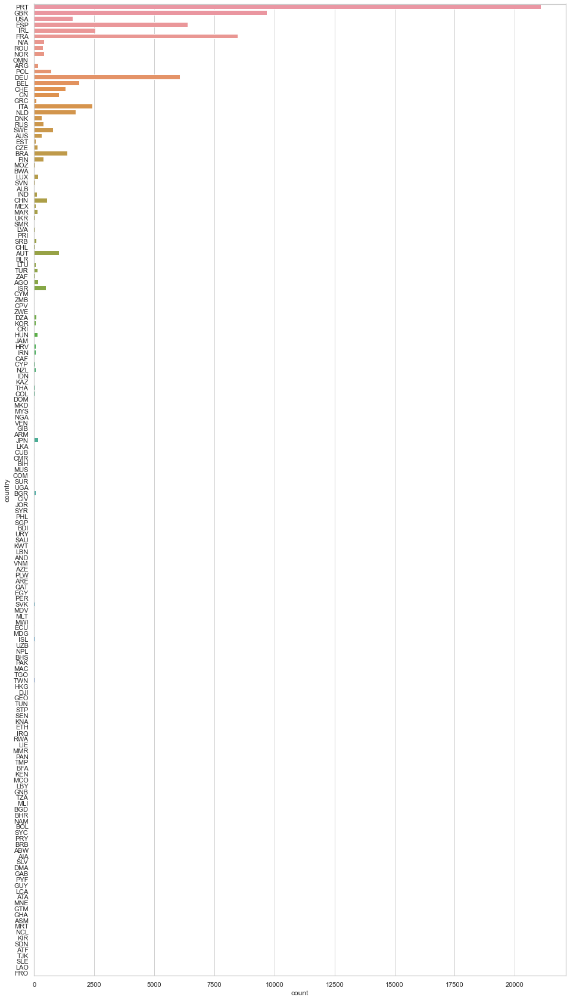

In [267]:
# Seaborn Countplot for Countries that have booked the two types of hotels together. 

plt.figure(figsize=(16,30))
sns.countplot(y= 'country', data = confirmed_df)

# Bibliography

Antonio, N., de Almeida, A. and Nunes, L. (2019) ‘Hotel Booking Demand Datasets’. Data in Brief, 22, pp. 41–49. DOI: 10.1016/j.dib.2018.11.126.

AV. (2016) PCA: Practical Guide to Principal Component Analysis in R & Python. Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2016/03/pca-practical-guide-principal-component-analysis-python/ (Accessed: 21 February 2021).

Data Camp. (2020) (Tutorial) Principal Component Analysis (PCA) in Python. DataCamp Community. Available at: https://www.datacamp.com/community/tutorials/principal-component-analysis-in-python (Accessed: 21 February 2021).

Galarnyk, M. (2021) PCA Using Python (Scikit-Learn). Medium. Available at: https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60 (Accessed: 27 February 2021).

Gouda, S. (2019) PCA(Principal Component Analysis) In Python. Medium. Available at: https://medium.com/@sarayupgouda/pca-principal-component-analysis-in-python-f9836c25acb9 (Accessed: 28 February 2021).

Jaadi, Z. (2020) A Step-by-Step Explanation of Principal Component Analysis. Built In. Available at: https://builtin.com/data-science/step-step-explanation-principal-component-analysis (Accessed: 21 February 2021).

Kindson The Genius. (2019) Principal Components Analysis(PCA) in Python - Step by Step. Kindson The Genius. Available at: https://www.kindsonthegenius.com/principal-components-analysispca-in-python-step-by-step/ (Accessed: 12 March 2021).

Matplotlib. (2021) List of Named Colors — Matplotlib 3.3.4 Documentation. matplotlib.org. Available at: https://matplotlib.org/stable/gallery/color/named_colors.html (Accessed: 24 February 2021).

mikulskibartosz. (2019) PCA — How to Choose the Number of Components?. Bartosz Mikulski. Available at: https://mikulskibartosz.name/pca-how-to-choose-the-number-of-components/ (Accessed: 24 February 2021).

Pandas. (2021a) Pandas.DataFrame.Reset_index — Pandas 1.2.3 Documentation. pandas.pydata.org. Available at: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.reset_index.html (Accessed: 13 March 2021).

Pandas. (2021b) Pandas.Set_option — Pandas 1.2.2 Documentation. pandas.pydata.org. Available at: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.set_option.html (Accessed: 20 February 2021).

Pandey, S. (2019) Get List of Pandas Dataframe Columns Based on Data Type - Intellipaat. Available at: https://intellipaat.com/community/23269/get-list-of-pandas-dataframe-columns-based-on-data-type (Accessed: 12 March 2021).

Prabhakaran, S. (2019) Principal Component Analysis (PCA) - Better Explained. ML+. Available at: https://www.machinelearningplus.com/machine-learning/principal-components-analysis-pca-better-explained/ (Accessed: 25 February 2021).

Pramoditha, R. (2020) Principal Component Analysis (PCA) with Scikit-Learn. Medium. Available at: https://towardsdatascience.com/principal-component-analysis-pca-with-scikit-learn-1e84a0c731b0 (Accessed: 24 February 2021).

Sarkar, D. (DJ). (2018) The Art of Effective Visualization of Multi-Dimensional Data. Medium. Available at: https://towardsdatascience.com/the-art-of-effective-visualization-of-multi-dimensional-data-6c7202990c57 (Accessed: 24 February 2021).

scikit-learn. (2020) Sklearn.Decomposition.PCA — Scikit-Learn 0.24.1 Documentation. scikit-learn. Available at: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html (Accessed: 12 March 2021).

stackoverflow. (2021) Python - Get List of Pandas Dataframe Columns Based on Data Type. Stack Overflow. Available at: https://stackoverflow.com/questions/22470690/get-list-of-pandas-dataframe-columns-based-on-data-type (Accessed: 20 February 2021).

VanderPlas, J. (2020) In Depth: Principal Component Analysis | Python Data Science Handbook. Python Data Science Handbook. Available at: https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html (Accessed: 27 February 2021).
